# What is Optuna?
LightGBM is one of powerful tool. And take a lot of time to tuning (for noob like me)
Optuna LightGBM Tuner (https://github.com/optuna/optuna/pull/549) can find out the best parameter on LightGBM.
Here I show you one of a cheap code using this powerful tool. thanks.

In [1]:
# import lightbgm as lab (you just import as follows instead of this code)
from optuna.integration import lightgbm as lgb

In [2]:
# from tutorial
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# import os
# for dirname, _, filenames in os.walk('./data/'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [3]:
train=pd.read_csv('./data/train.csv')
test=pd.read_csv('./data/test.csv')
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


# Categorical variables
Label Encoding some categorical variables that may contain information in their ordering set

In [5]:
numeric_features = train.select_dtypes(include=[np.number])
numeric_features.columns

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [6]:
categorical_features = train.select_dtypes(include=[np.object])
categorical_features.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

to check some categorical variables

In [7]:
# train_test['SaleCondition'].unique()

In [8]:
from sklearn.preprocessing import LabelEncoder
cols = ('MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition')

cols_defaults = ('FireplaceQu', 'BsmtQual', 'BsmtCond', 'GarageQual', 'GarageCond', 
        'ExterQual', 'ExterCond','HeatingQC', 'PoolQC', 'KitchenQual', 'BsmtFinType1', 
        'BsmtFinType2', 'Functional', 'Fence', 'BsmtExposure', 'GarageFinish', 'LandSlope',
        'LotShape', 'PavedDrive', 'Street', 'Alley', 'CentralAir', 'MSSubClass', 'OverallCond', 
        'YrSold', 'MoSold')
# process columns, apply LabelEncoder to categorical features
for c in cols:
    lbl = LabelEncoder() 
    lbl.fit(list(train[c].values)) 
    train[c] = lbl.transform(list(train[c].values))

# shape        
print('Shape train: {}'.format(train.shape))

Shape train: (1460, 81)


In [9]:
# process columns, apply LabelEncoder to categorical features
for c in cols:
    lbl = LabelEncoder() 
    lbl.fit(list(test[c].values)) 
    test[c] = lbl.transform(list(test[c].values))

# shape        
print('Shape test: {}'.format(test.shape))

Shape test: (1459, 80)


to confirm categorical variables has converted.

In [10]:
# train_test['SaleCondition'].unique()

In [11]:
train_test=pd.concat([train,test],axis=0,sort=False)
train_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,3,65.0,8450,1,2,3,3,0,...,0,3,4,4,0,2,2008,8,4,208500.0
1,2,20,3,80.0,9600,1,2,3,3,0,...,0,3,4,4,0,5,2007,8,4,181500.0
2,3,60,3,68.0,11250,1,2,0,3,0,...,0,3,4,4,0,9,2008,8,4,223500.0
3,4,70,3,60.0,9550,1,2,0,3,0,...,0,3,4,4,0,2,2006,8,0,140000.0
4,5,60,3,84.0,14260,1,2,0,3,0,...,0,3,4,4,0,12,2008,8,4,250000.0


In [12]:
train.isnull().sum() 

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [13]:
train_test.groupby('SaleCondition').count()['Id']

SaleCondition
0     190
1      12
2      24
3      46
4    2402
5     245
Name: Id, dtype: int64

<AxesSubplot:>

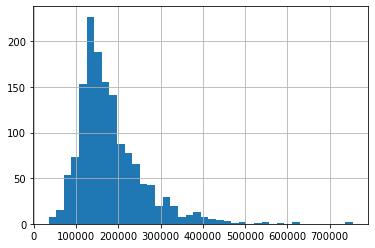

In [14]:
train['SalePrice'].hist(bins = 40)

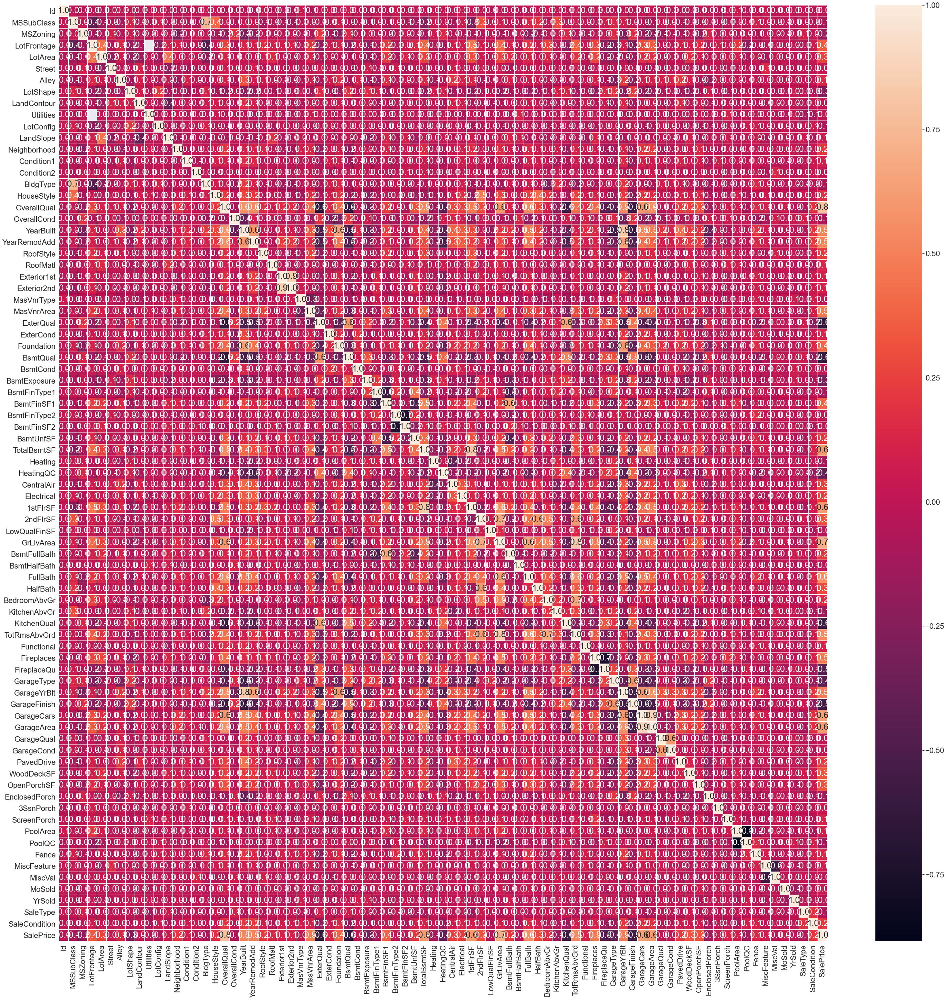

In [15]:
import matplotlib.pyplot as plt
import seaborn as sb
correlation_train=train.corr()
sb.set(font_scale=2)
plt.figure(figsize=(50,50))
ax = sb.heatmap(correlation_train, annot=True,annot_kws={"size": 25},fmt='.1f', linewidths=.5)

In [16]:
correlation_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

# Feature Engineering

pick up low-correlation elements, under 0.1 or over -0.1.

In [17]:
corr_dict=correlation_train['SalePrice'].sort_values(ascending=False).to_dict()
unimportant_columns=[]
for key,value in corr_dict.items():
    if  ((value>=-0.1) & (value<=0)) | (value==0.1):
        unimportant_columns.append(key)
unimportant_columns

['BsmtFinSF2',
 'Utilities',
 'BsmtHalfBath',
 'MiscVal',
 'Id',
 'LowQualFinSF',
 'YrSold',
 'SaleType',
 'LotConfig',
 'OverallCond',
 'MSSubClass',
 'BldgType',
 'Heating']

# Drop'em up


In [18]:
train2= train.drop(['BsmtFinSF2',
 'Utilities',
 'BsmtHalfBath',
 'MiscVal',
 'Id',
 'LowQualFinSF',
 'YrSold',
 'SaleType',
 'LotConfig',
 'OverallCond',
 'MSSubClass',
 'BldgType',
 'Heating'],axis=1)

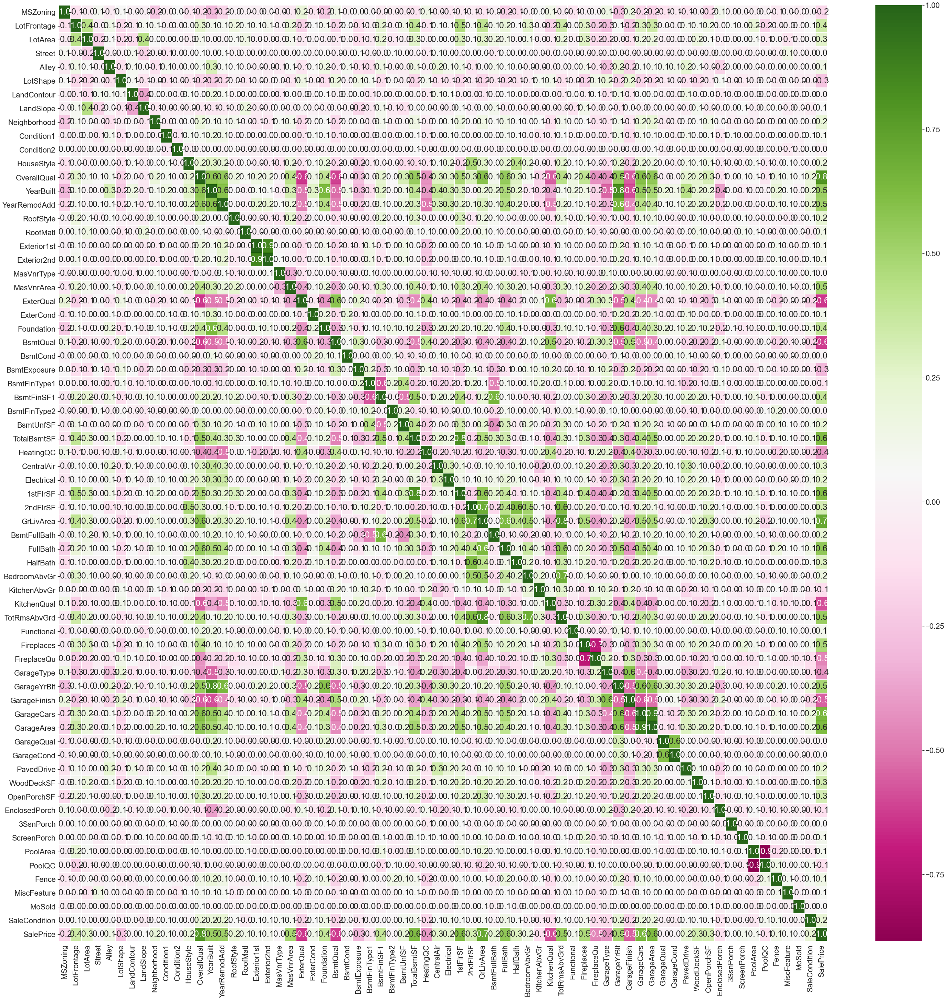

In [19]:
correlation_train2=train2.corr()
sb.set(font_scale=2)
plt.figure(figsize=(50,50))
ax = sb.heatmap(correlation_train2, annot=True,annot_kws={"size": 25},fmt='.1f',cmap='PiYG', linewidths=.5)

# Add non-AI knowledge

See heatmap, find high-correlations between features which seems to be same feature (i,e, 'GarageCars','GareageArea' they are have 0.9)
I dropped three features (tagged # del).

In [20]:
train2.columns

Index(['MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape',
       'LandContour', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'HouseStyle', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtUnfSF', 'TotalBsmtSF', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC',
       'Fence', 'MiscFeature', 'MoSold

In [21]:
train3= train.loc[:,['MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape',
       'LandContour', 'LandSlope', 
        #'Neighborhood',
        'Condition1', 'Condition2',
       'HouseStyle', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtUnfSF', 'TotalBsmtSF', 'HeatingQC', 'CentralAir', 'Electrical',
       #'1stFlrSF', 
        '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       #'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       #'GarageYrBlt',
       'GarageFinish', 
       #'GarageCars', 
       'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 
       #'PoolArea', 
        'PoolQC',
       'Fence', 'MiscFeature', 
       #'MoSold', 
       'SaleCondition', 'SalePrice']]


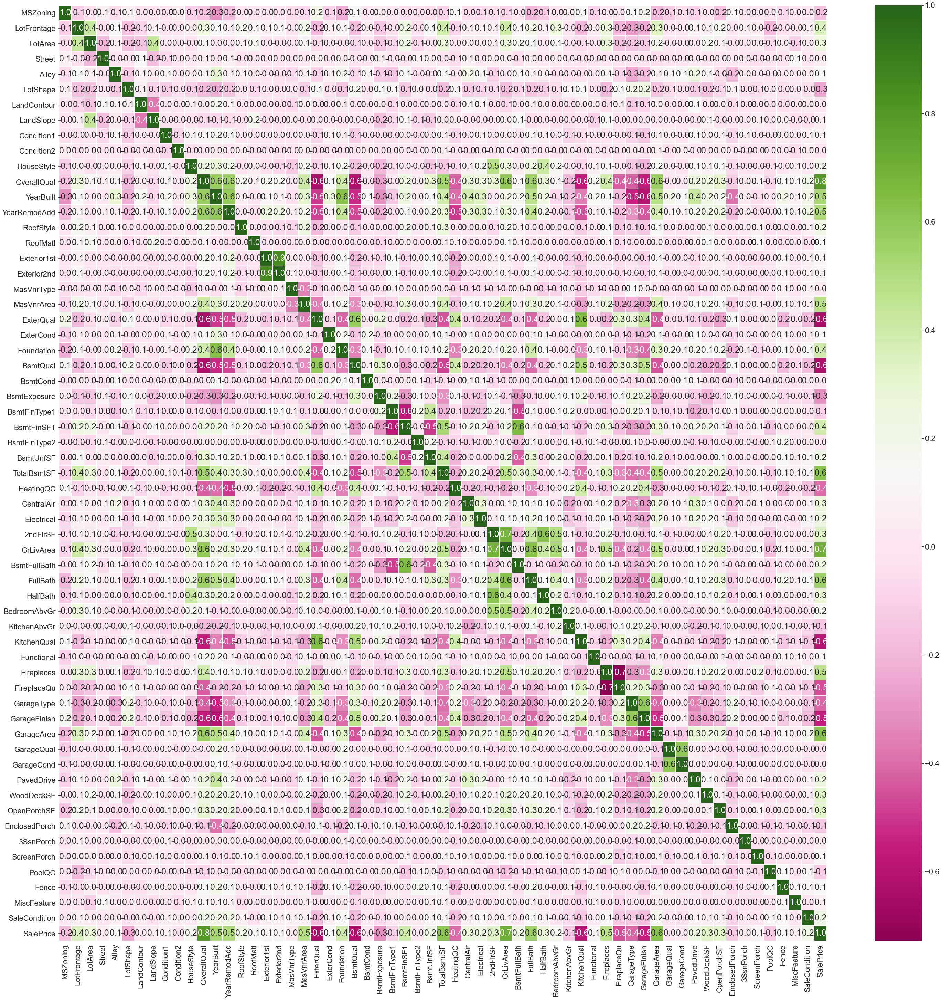

In [22]:
correlation_train3=train3.corr()
sb.set(font_scale=2)
plt.figure(figsize=(50,50))
ax = sb.heatmap(correlation_train3, annot=True,annot_kws={"size": 25},fmt='.1f',cmap='PiYG', linewidths=.5)

In [23]:
corr_dict3=correlation_train3['SalePrice'].sort_values(ascending=False).to_dict()
unimportant_columns_train3=[]
for key,value in corr_dict3.items():
    if  ((value>=-0.1) & (value<=0)) | (value==0.1):
        unimportant_columns_train3.append(key)
unimportant_columns_train3

[]

train3 has only important columns (val < 0.1 or val > 0.1)

In [24]:
import seaborn as sns
from sklearn.linear_model import LinearRegression

%matplotlib inline 

C:\Users\iiats\Anaconda3\envs\Python37-gpu\lib\site-packages\seaborn\axisgrid.py:1912: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


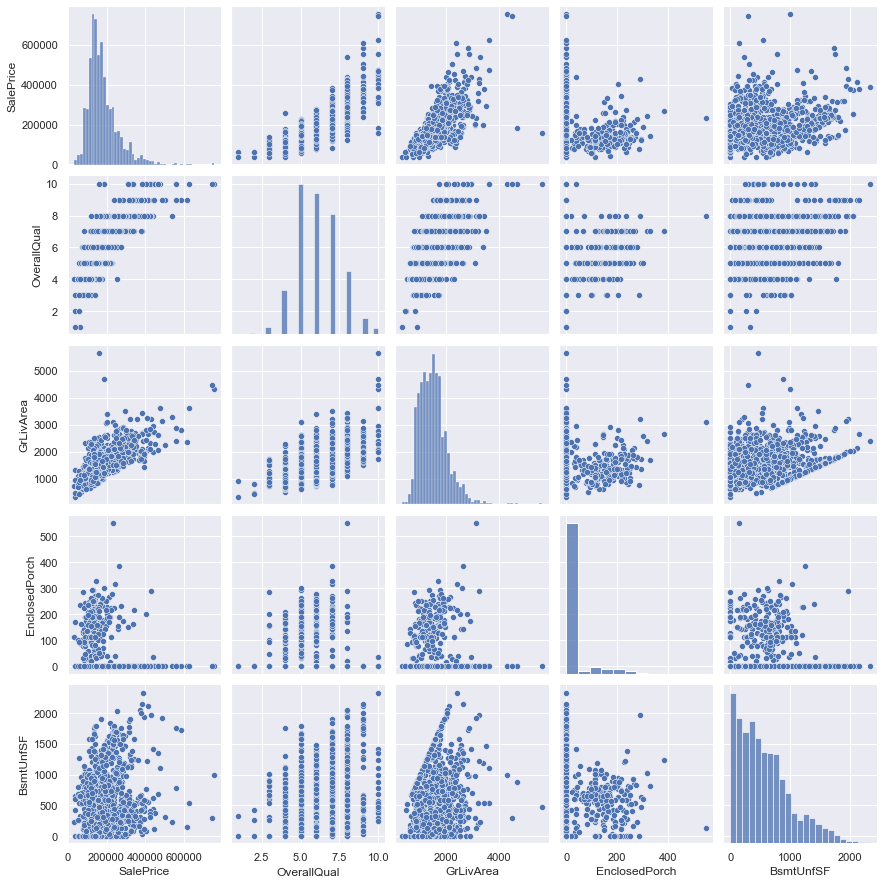

In [25]:

sns.set()
cols = ['SalePrice', 'OverallQual', 'GrLivArea','EnclosedPorch','BsmtUnfSF']
sns.pairplot(train3[cols], size = 2.5)
plt.show()

#  It's time to go

In [26]:
test= test.loc[:,['MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape',
       'LandContour', 'LandSlope', 
        #'Neighborhood',
        'Condition1', 'Condition2',
       'HouseStyle', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtUnfSF', 'TotalBsmtSF', 'HeatingQC', 'CentralAir', 'Electrical',
       #'1stFlrSF', 
        '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       #'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       #'GarageYrBlt',
       'GarageFinish', 
       #'GarageCars', 
       'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 
       #'PoolArea', 
        'PoolQC',
       'Fence', 'MiscFeature', 
       #'MoSold', 
       'SaleCondition'
                 ]]

In [27]:
len(test)

1459

In [28]:
len(train3)

1460

In [29]:
X_train = train3.drop([ 'SalePrice'], axis=1)
y_train = np.log1p(train3['SalePrice'])

In [30]:
from sklearn import preprocessing
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error

y_preds = []
models = []
oof_train = np.zeros((len(X_train),))
cv = KFold(n_splits=5, shuffle=True, random_state=0)


params = {
    'objective': 'regression',
        'metric': 'rmse',
        'verbosity': -1,
        'boosting_type': 'gbdt',
}

for fold_id, (train_index, valid_index) in enumerate(cv.split(X_train)):
    X_tr = X_train.loc[train_index, :]
    X_val = X_train.loc[valid_index, :]
    y_tr = y_train[train_index]
    y_val = y_train[valid_index]

    lgb_train = lgb.Dataset(X_tr,
                            y_tr,
                            #categorical_feature=categorical_cols
                           )

    lgb_eval = lgb.Dataset(X_val,
                           y_val,
                           reference=lgb_train,
                           #categorical_feature=categorical_cols
                          )

    model = lgb.train(params,
                      lgb_train,
                      valid_sets=[lgb_train, lgb_eval],
                      verbose_eval=10,
                      num_boost_round=1000,
                      early_stopping_rounds=10)


    oof_train[valid_index] = model.predict(X_val,
                                           num_iteration=model.best_iteration)
    y_pred = model.predict(test,
                           num_iteration=model.best_iteration)

    y_preds.append(y_pred)
    models.append(model)

[I 2020-10-09 06:56:43,790] A new study created in memory with name: no-name-ea90799b-bc6c-4e6b-88bb-97dab816f5e9
feature_fraction, val_score: inf:   0%|                                                          | 0/7 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.191388	valid_1's rmse: 0.192923
[20]	training's rmse: 0.121566	valid_1's rmse: 0.151847
[30]	training's rmse: 0.0967215	valid_1's rmse: 0.145586
[40]	training's rmse: 0.084351	valid_1's rmse: 0.144685
[50]	training's rmse: 0.0760394	valid_1's rmse: 0.144301
Early stopping, best iteration is:
[47]	training's rmse: 0.0781459	valid_1's rmse: 0.144248


feature_fraction, val_score: 0.144248:  14%|######4                                      | 1/7 [00:00<00:00,  8.93it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190625	valid_1's rmse: 0.192699
[20]	training's rmse: 0.121076	valid_1's rmse: 0.152584
[30]	training's rmse: 0.0960111	valid_1's rmse: 0.146754
[40]	training's rmse: 0.0832292	valid_1's rmse: 0.146942
Early stopping, best iteration is:
[34]	training's rmse: 0.0899562	valid_1's rmse: 0.146373


feature_fraction, val_score: 0.144248:  29%|############8                                | 2/7 [00:00<00:00,  8.93it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.189823	valid_1's rmse: 0.193429
[20]	training's rmse: 0.119759	valid_1's rmse: 0.15273
[30]	training's rmse: 0.094516	valid_1's rmse: 0.147103
[40]	training's rmse: 0.0816136	valid_1's rmse: 0.146412
Early stopping, best iteration is:
[34]	training's rmse: 0.0884131	valid_1's rmse: 0.146308


feature_fraction, val_score: 0.144248:  43%|###################2                         | 3/7 [00:00<00:00,  9.91it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.195852	valid_1's rmse: 0.195402
[20]	training's rmse: 0.125546	valid_1's rmse: 0.150153
[30]	training's rmse: 0.100522	valid_1's rmse: 0.143188
[40]	training's rmse: 0.0877243	valid_1's rmse: 0.143341
Early stopping, best iteration is:
[31]	training's rmse: 0.0988043	valid_1's rmse: 0.142935


feature_fraction, val_score: 0.142935:  57%|#########################7                   | 4/7 [00:00<00:00,  9.91it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.189323	valid_1's rmse: 0.193274
[20]	training's rmse: 0.119698	valid_1's rmse: 0.150511
[30]	training's rmse: 0.0946887	valid_1's rmse: 0.145748
[40]	training's rmse: 0.0824022	valid_1's rmse: 0.14605
Early stopping, best iteration is:
[34]	training's rmse: 0.0890254	valid_1's rmse: 0.145683


feature_fraction, val_score: 0.142935:  71%|################################1            | 5/7 [00:00<00:00, 10.84it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192996	valid_1's rmse: 0.19287
[20]	training's rmse: 0.122458	valid_1's rmse: 0.150421
[30]	training's rmse: 0.0973378	valid_1's rmse: 0.144226
[40]	training's rmse: 0.0851839	valid_1's rmse: 0.143378
Early stopping, best iteration is:
[36]	training's rmse: 0.0891203	valid_1's rmse: 0.14331


feature_fraction, val_score: 0.142935:  86%|######################################5      | 6/7 [00:00<00:00, 10.84it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190788	valid_1's rmse: 0.1923
[20]	training's rmse: 0.121128	valid_1's rmse: 0.152278
[30]	training's rmse: 0.0964444	valid_1's rmse: 0.145821
[40]	training's rmse: 0.0841168	valid_1's rmse: 0.145734
Early stopping, best iteration is:
[34]	training's rmse: 0.0905397	valid_1's rmse: 0.145411


num_leaves, val_score: 0.142935:   0%|                                                          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:   5%|##5                                               | 1/20 [00:01<00:30,  1.62s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  10%|#####                                             | 2/20 [00:03<00:29,  1.62s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  15%|#######5                                          | 3/20 [00:04<00:27,  1.62s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.233239	valid_1's rmse: 0.219866
[20]	training's rmse: 0.167568	valid_1's rmse: 0.167891
[30]	training's rmse: 0.139029	valid_1's rmse: 0.152701
[40]	training's rmse: 0.126481	valid_1's rmse: 0.149284
[50]	training's rmse: 0.119273	valid_1's rmse: 0.149171
[60]	training's rmse: 0.114582	valid_1's rmse: 0.148908
Early stopping, best iteration is:
[56]	training's rmse: 0.116085	valid_1's rmse: 0.148403


num_leaves, val_score: 0.130753:  20%|##########                                        | 4/20 [00:04<00:25,  1.62s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  25%|############5                                     | 5/20 [00:06<00:20,  1.38s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  30%|###############                                   | 6/20 [00:08<00:20,  1.47s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  35%|#################5                                | 7/20 [00:09<00:19,  1.51s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  40%|####################                              | 8/20 [00:11<00:18,  1.55s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  45%|######################5                           | 9/20 [00:13<00:17,  1.57s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  50%|########################5                        | 10/20 [00:14<00:15,  1.59s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  55%|##########################9                      | 11/20 [00:16<00:14,  1.65s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  60%|#############################4                   | 12/20 [00:18<00:13,  1.64s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  65%|###############################8                 | 13/20 [00:19<00:11,  1.63s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  70%|##################################3              | 14/20 [00:21<00:09,  1.64s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  75%|####################################7            | 15/20 [00:22<00:08,  1.62s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  80%|#######################################2         | 16/20 [00:24<00:06,  1.64s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.195578	valid_1's rmse: 0.195588
[20]	training's rmse: 0.125298	valid_1's rmse: 0.151348
[30]	training's rmse: 0.0999987	valid_1's rmse: 0.144412
[40]	training's rmse: 0.0877995	valid_1's rmse: 0.143577
Early stopping, best iteration is:
[38]	training's rmse: 0.0896021	valid_1's rmse: 0.14356


num_leaves, val_score: 0.130753:  85%|#########################################6       | 17/20 [00:24<00:04,  1.64s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  90%|############################################1    | 18/20 [00:26<00:02,  1.42s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

num_leaves, val_score: 0.130753:  95%|##############################################5  | 19/20 [00:28<00:01,  1.47s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

bagging, val_score: 0.130753:   0%|                                                             | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.197732	valid_1's rmse: 0.196519
[20]	training's rmse: 0.127987	valid_1's rmse: 0.149925
[30]	training's rmse: 0.103421	valid_1's rmse: 0.142255
[40]	training's rmse: 0.091207	valid_1's rmse: 0.140284
[50]	training's rmse: 0.0833558	valid_1's rmse: 0.139746
[60]	training's rmse: 0.0756858	valid_1's rmse: 0.13936
Early stopping, best iteration is:
[59]	training's rmse: 0.0762887	valid_1's rmse: 0.139206


bagging, val_score: 0.130753:  10%|#####3                                               | 1/10 [00:00<00:01,  8.40it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.211851	valid_1's rmse: 0.204089
[20]	training's rmse: 0.147007	valid_1's rmse: 0.154022
[30]	training's rmse: 0.124644	valid_1's rmse: 0.144005
[40]	training's rmse: 0.115918	valid_1's rmse: 0.143022
[50]	training's rmse: 0.110754	valid_1's rmse: 0.143084
[60]	training's rmse: 0.105537	valid_1's rmse: 0.14185
[70]	training's rmse: 0.101514	valid_1's rmse: 0.141951
Early stopping, best iteration is:
[63]	training's rmse: 0.104333	valid_1's rmse: 0.141264


bagging, val_score: 0.130753:  20%|##########6                                          | 2/10 [00:00<00:00,  8.40it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.213237	valid_1's rmse: 0.203172
[20]	training's rmse: 0.147898	valid_1's rmse: 0.152492
[30]	training's rmse: 0.12529	valid_1's rmse: 0.142945
[40]	training's rmse: 0.11517	valid_1's rmse: 0.143279
Early stopping, best iteration is:
[33]	training's rmse: 0.120852	valid_1's rmse: 0.142096


bagging, val_score: 0.130753:  30%|###############9                                     | 3/10 [00:00<00:00,  9.33it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.200343	valid_1's rmse: 0.19747
[20]	training's rmse: 0.133791	valid_1's rmse: 0.152438
[30]	training's rmse: 0.110484	valid_1's rmse: 0.144288
[40]	training's rmse: 0.0993502	valid_1's rmse: 0.142414
[50]	training's rmse: 0.091493	valid_1's rmse: 0.143311
Early stopping, best iteration is:
[40]	training's rmse: 0.0993502	valid_1's rmse: 0.142414


bagging, val_score: 0.130753:  40%|#####################2                               | 4/10 [00:00<00:00,  9.33it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.193014	valid_1's rmse: 0.193411
[20]	training's rmse: 0.122321	valid_1's rmse: 0.149096
[30]	training's rmse: 0.0971405	valid_1's rmse: 0.142505
[40]	training's rmse: 0.0840337	valid_1's rmse: 0.142457
Early stopping, best iteration is:
[34]	training's rmse: 0.0908282	valid_1's rmse: 0.142186


bagging, val_score: 0.130753:  50%|##########################5                          | 5/10 [00:00<00:00,  9.88it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.207892	valid_1's rmse: 0.199733
[20]	training's rmse: 0.141077	valid_1's rmse: 0.152477
[30]	training's rmse: 0.116775	valid_1's rmse: 0.145947
[40]	training's rmse: 0.105824	valid_1's rmse: 0.146468
Early stopping, best iteration is:
[33]	training's rmse: 0.112309	valid_1's rmse: 0.145677


bagging, val_score: 0.130753:  60%|###############################8                     | 6/10 [00:00<00:00,  9.88it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.1941	valid_1's rmse: 0.193209
[20]	training's rmse: 0.123708	valid_1's rmse: 0.150077
[30]	training's rmse: 0.0982236	valid_1's rmse: 0.144604
[40]	training's rmse: 0.0851646	valid_1's rmse: 0.144
[50]	training's rmse: 0.0766043	valid_1's rmse: 0.144595
Early stopping, best iteration is:
[41]	training's rmse: 0.0842533	valid_1's rmse: 0.143935


bagging, val_score: 0.130753:  70%|#####################################                | 7/10 [00:00<00:00, 10.33it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.20138	valid_1's rmse: 0.194624
[20]	training's rmse: 0.133332	valid_1's rmse: 0.15091
[30]	training's rmse: 0.109874	valid_1's rmse: 0.145188
[40]	training's rmse: 0.0982909	valid_1's rmse: 0.144903
Early stopping, best iteration is:
[39]	training's rmse: 0.0992353	valid_1's rmse: 0.14438


bagging, val_score: 0.130753:  80%|##########################################4          | 8/10 [00:00<00:00, 10.33it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.207839	valid_1's rmse: 0.202406
[20]	training's rmse: 0.142813	valid_1's rmse: 0.157481
[30]	training's rmse: 0.119571	valid_1's rmse: 0.149053
[40]	training's rmse: 0.108922	valid_1's rmse: 0.146058
[50]	training's rmse: 0.103264	valid_1's rmse: 0.144904
[60]	training's rmse: 0.0975799	valid_1's rmse: 0.144898
Early stopping, best iteration is:
[55]	training's rmse: 0.100047	valid_1's rmse: 0.144047


bagging, val_score: 0.130753:  90%|###############################################7     | 9/10 [00:00<00:00, 10.50it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.198018	valid_1's rmse: 0.19627
[20]	training's rmse: 0.129882	valid_1's rmse: 0.151356
[30]	training's rmse: 0.105278	valid_1's rmse: 0.144257
[40]	training's rmse: 0.0930324	valid_1's rmse: 0.143008
[50]	training's rmse: 0.0845935	valid_1's rmse: 0.141548
[60]	training's rmse: 0.0783919	valid_1's rmse: 0.140578
[70]	training's rmse: 0.0723812	valid_1's rmse: 0.140544
Early stopping, best iteration is:
[65]	training's rmse: 0.0749692	valid_1's rmse: 0.140052


feature_fraction_stage2, val_score: 0.130753:   0%|                                              | 0/3 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192072	valid_1's rmse: 0.190844
[20]	training's rmse: 0.121322	valid_1's rmse: 0.147269
[30]	training's rmse: 0.0961315	valid_1's rmse: 0.142557
[40]	training's rmse: 0.0829033	valid_1's rmse: 0.141918
[50]	training's rmse: 0.0743627	valid_1's rmse: 0.14236
Early stopping, best iteration is:
[43]	training's rmse: 0.0803996	valid_1's rmse: 0.141625


feature_fraction_stage2, val_score: 0.130753:  33%|############6                         | 1/3 [00:00<00:00, 10.00it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190329	valid_1's rmse: 0.191446
[20]	training's rmse: 0.119432	valid_1's rmse: 0.150663
[30]	training's rmse: 0.0939402	valid_1's rmse: 0.144492
[40]	training's rmse: 0.0816905	valid_1's rmse: 0.144259
Early stopping, best iteration is:
[34]	training's rmse: 0.0881636	valid_1's rmse: 0.144093


feature_fraction_stage2, val_score: 0.130753:  67%|#########################3            | 2/3 [00:00<00:00, 11.24it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.193263	valid_1's rmse: 0.193352
[20]	training's rmse: 0.122539	valid_1's rmse: 0.150212
[30]	training's rmse: 0.0973255	valid_1's rmse: 0.144325
[40]	training's rmse: 0.0841983	valid_1's rmse: 0.143328
[50]	training's rmse: 0.0755558	valid_1's rmse: 0.142426
[60]	training's rmse: 0.068259	valid_1's rmse: 0.14192
[70]	training's rmse: 0.0620291	valid_1's rmse: 0.141694
[80]	training's rmse: 0.0568834	valid_1's rmse: 0.141166
Early stopping, best iteration is:
[79]	training's rmse: 0.0573409	valid_1's rmse: 0.141104


regularization_factors, val_score: 0.130753:   0%|                                              | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192988	valid_1's rmse: 0.193418
[20]	training's rmse: 0.122293	valid_1's rmse: 0.149136
[30]	training's rmse: 0.0971492	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842647	valid_1's rmse: 0.14298
[50]	training's rmse: 0.0758442	valid_1's rmse: 0.14288
[60]	training's rmse: 0.0684739	valid_1's rmse: 0.142701
[70]	training's rmse: 0.0625898	valid_1's rmse: 0.142936
Early stopping, best iteration is:
[63]	training's rmse: 0.0667745	valid_1's rmse: 0.142322


regularization_factors, val_score: 0.130753:   5%|#9                                    | 1/20 [00:00<00:02,  7.41it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221825	valid_1's rmse: 0.214411
[20]	training's rmse: 0.158378	valid_1's rmse: 0.163795
[30]	training's rmse: 0.133515	valid_1's rmse: 0.150712
[40]	training's rmse: 0.123088	valid_1's rmse: 0.147667
[50]	training's rmse: 0.116457	valid_1's rmse: 0.146919
[60]	training's rmse: 0.112296	valid_1's rmse: 0.146395
[70]	training's rmse: 0.109383	valid_1's rmse: 0.146062
[80]	training's rmse: 0.107225	valid_1's rmse: 0.145611
[90]	training's rmse: 0.105603	valid_1's rmse: 0.145627
Early stopping, best iteration is:
[81]	training's rmse: 0.10703	valid_1's rmse: 0.145536


regularization_factors, val_score: 0.130753:  10%|###8                                  | 2/20 [00:00<00:02,  7.41it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221111	valid_1's rmse: 0.214923
[20]	training's rmse: 0.149609	valid_1's rmse: 0.160763
[30]	training's rmse: 0.118982	valid_1's rmse: 0.146414
[40]	training's rmse: 0.102578	valid_1's rmse: 0.142659
[50]	training's rmse: 0.091965	valid_1's rmse: 0.142683
Early stopping, best iteration is:
[44]	training's rmse: 0.0977568	valid_1's rmse: 0.142469


regularization_factors, val_score: 0.130753:  15%|#####7                                | 3/20 [00:00<00:02,  8.10it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

regularization_factors, val_score: 0.130705:  20%|#######6                              | 4/20 [00:02<00:09,  1.68it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

regularization_factors, val_score: 0.130705:  25%|#########5                            | 5/20 [00:03<00:13,  1.09it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

regularization_factors, val_score: 0.130705:  30%|###########4                          | 6/20 [00:05<00:16,  1.14s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

regularization_factors, val_score: 0.130705:  35%|#############3                        | 7/20 [00:06<00:13,  1.02s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

regularization_factors, val_score: 0.130705:  40%|###############2                      | 8/20 [00:07<00:14,  1.21s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139496
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139135
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138802
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.13838
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138074
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137876
[170]	training's rmse: 0

regularization_factors, val_score: 0.130617:  45%|#################1                    | 9/20 [00:09<00:15,  1.38s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

regularization_factors, val_score: 0.130617:  50%|##################5                  | 10/20 [00:11<00:15,  1.50s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

regularization_factors, val_score: 0.130617:  55%|####################3                | 11/20 [00:13<00:14,  1.56s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

regularization_factors, val_score: 0.130609:  60%|######################2              | 12/20 [00:14<00:12,  1.62s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

regularization_factors, val_score: 0.130609:  65%|########################             | 13/20 [00:16<00:11,  1.69s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681949	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.0452321	valid_1's rmse: 0.139588
[120]	training's rmse: 0.0424168	valid_1's rmse: 0.138806
[130]	training's rmse: 0.0395406	valid_1's rmse: 0.1384
[140]	training's rmse: 0.0371678	valid_1's rmse: 0.138044
[150]	training's rmse: 0.0351109	valid_1's rmse: 0.138068
[160]	training's rmse: 0.0332598	valid_1's rmse: 0.137753
[170]	training's rmse: 0

regularization_factors, val_score: 0.130609:  70%|#########################9           | 14/20 [00:17<00:07,  1.30s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681949	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.0452321	valid_1's rmse: 0.139588
[120]	training's rmse: 0.0424168	valid_1's rmse: 0.138806
[130]	training's rmse: 0.0395407	valid_1's rmse: 0.1384
[140]	training's rmse: 0.0371678	valid_1's rmse: 0.138044
[150]	training's rmse: 0.0351109	valid_1's rmse: 0.138068
[160]	training's rmse: 0.0332598	valid_1's rmse: 0.137753
[170]	training's rmse: 0

regularization_factors, val_score: 0.130609:  75%|###########################7         | 15/20 [00:17<00:05,  1.02s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

regularization_factors, val_score: 0.130609:  80%|#############################6       | 16/20 [00:19<00:05,  1.27s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681949	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.0452321	valid_1's rmse: 0.139588
[120]	training's rmse: 0.0424168	valid_1's rmse: 0.138806
[130]	training's rmse: 0.0395406	valid_1's rmse: 0.1384
[140]	training's rmse: 0.0371678	valid_1's rmse: 0.138047
[150]	training's rmse: 0.0351109	valid_1's rmse: 0.13807
[160]	training's rmse: 0.0332598	valid_1's rmse: 0.137756
[170]	training's rmse: 0.

regularization_factors, val_score: 0.130609:  85%|###############################4     | 17/20 [00:19<00:03,  1.00s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681948	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

regularization_factors, val_score: 0.130340:  90%|#################################3   | 18/20 [00:21<00:02,  1.23s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681949	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

regularization_factors, val_score: 0.130274:  95%|###################################1 | 19/20 [00:23<00:01,  1.39s/it]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192982	valid_1's rmse: 0.193412
[20]	training's rmse: 0.122289	valid_1's rmse: 0.149134
[30]	training's rmse: 0.0971459	valid_1's rmse: 0.143249
[40]	training's rmse: 0.0842567	valid_1's rmse: 0.142997
[50]	training's rmse: 0.0757106	valid_1's rmse: 0.142798
[60]	training's rmse: 0.0681949	valid_1's rmse: 0.142133
[70]	training's rmse: 0.0623212	valid_1's rmse: 0.142006
[80]	training's rmse: 0.0573878	valid_1's rmse: 0.140711
[90]	training's rmse: 0.0524933	valid_1's rmse: 0.140177
[100]	training's rmse: 0.0488232	valid_1's rmse: 0.139496
[110]	training's rmse: 0.045336	valid_1's rmse: 0.139498
[120]	training's rmse: 0.0423702	valid_1's rmse: 0.139138
[130]	training's rmse: 0.0396268	valid_1's rmse: 0.138804
[140]	training's rmse: 0.0373604	valid_1's rmse: 0.138383
[150]	training's rmse: 0.0351381	valid_1's rmse: 0.138077
[160]	training's rmse: 0.0333136	valid_1's rmse: 0.137878
[170]	training's rmse: 

min_data_in_leaf, val_score: 0.130274:   0%|                                                     | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.198649	valid_1's rmse: 0.195218
[20]	training's rmse: 0.130579	valid_1's rmse: 0.147499
[30]	training's rmse: 0.105832	valid_1's rmse: 0.140631
[40]	training's rmse: 0.0929753	valid_1's rmse: 0.140059
Early stopping, best iteration is:
[39]	training's rmse: 0.094022	valid_1's rmse: 0.13998


min_data_in_leaf, val_score: 0.130274:  20%|#########                                    | 1/5 [00:00<00:00, 10.31it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.213236	valid_1's rmse: 0.206818
[20]	training's rmse: 0.149404	valid_1's rmse: 0.157886
[30]	training's rmse: 0.126048	valid_1's rmse: 0.14696
[40]	training's rmse: 0.11592	valid_1's rmse: 0.145057
[50]	training's rmse: 0.109666	valid_1's rmse: 0.144961
Early stopping, best iteration is:
[44]	training's rmse: 0.112984	valid_1's rmse: 0.144555


min_data_in_leaf, val_score: 0.130274:  40%|##################                           | 2/5 [00:00<00:00, 12.58it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.17903	valid_1's rmse: 0.190572
[20]	training's rmse: 0.0996863	valid_1's rmse: 0.146185
[30]	training's rmse: 0.070588	valid_1's rmse: 0.137226
[40]	training's rmse: 0.0554359	valid_1's rmse: 0.135596
[50]	training's rmse: 0.0461465	valid_1's rmse: 0.134596
[60]	training's rmse: 0.0386763	valid_1's rmse: 0.133592
[70]	training's rmse: 0.0333382	valid_1's rmse: 0.133196
[80]	training's rmse: 0.0292579	valid_1's rmse: 0.13305
[90]	training's rmse: 0.0258707	valid_1's rmse: 0.132715
[100]	training's rmse: 0.0231433	valid_1's rmse: 0.132604
Early stopping, best iteration is:
[96]	training's rmse: 0.0241168	valid_1's rmse: 0.13248


min_data_in_leaf, val_score: 0.130274:  60%|###########################                  | 3/5 [00:00<00:00,  6.81it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.163179	valid_1's rmse: 0.187679
[20]	training's rmse: 0.0757029	valid_1's rmse: 0.144828
[30]	training's rmse: 0.0431826	valid_1's rmse: 0.137595
[40]	training's rmse: 0.0287632	valid_1's rmse: 0.136133
[50]	training's rmse: 0.0209974	valid_1's rmse: 0.135977
Early stopping, best iteration is:
[45]	training's rmse: 0.024316	valid_1's rmse: 0.135916


min_data_in_leaf, val_score: 0.130274:  80%|####################################         | 4/5 [00:00<00:00,  5.41it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.231186	valid_1's rmse: 0.220612
[20]	training's rmse: 0.169992	valid_1's rmse: 0.169819
[30]	training's rmse: 0.147618	valid_1's rmse: 0.155419
[40]	training's rmse: 0.138137	valid_1's rmse: 0.151818
[50]	training's rmse: 0.132464	valid_1's rmse: 0.149501
[60]	training's rmse: 0.128343	valid_1's rmse: 0.148431
[70]	training's rmse: 0.125193	valid_1's rmse: 0.147419
[80]	training's rmse: 0.122752	valid_1's rmse: 0.146854
[90]	training's rmse: 0.120385	valid_1's rmse: 0.146717
[100]	training's rmse: 0.117949	valid_1's rmse: 0.146544
[110]	training's rmse: 0.115832	valid_1's rmse: 0.146197
[120]	training's rmse: 0.113718	valid_1's rmse: 0.146141
Early stopping, best iteration is:
[115]	training's rmse: 0.114678	valid_1's rmse: 0.146028


min_data_in_leaf, val_score: 0.130274: 100%|#############################################| 5/5 [00:00<00:00,  5.89it/s]
[I 2020-10-09 06:57:41,058] A new study created in memory with name: no-name-4c79406c-5874-4ab1-a3f6-2f58b66502e3
feature_fraction, val_score: inf:   0%|                                                          | 0/7 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.194101	valid_1's rmse: 0.19567
[20]	training's rmse: 0.127507	valid_1's rmse: 0.14425
[30]	training's rmse: 0.102981	valid_1's rmse: 0.129583
[40]	training's rmse: 0.0898083	valid_1's rmse: 0.125746
[50]	training's rmse: 0.0805033	valid_1's rmse: 0.123409
[60]	training's rmse: 0.0732234	valid_1's rmse: 0.1228
Early stopping, best iteration is:
[57]	training's rmse: 0.0752414	valid_1's rmse: 0.122309


feature_fraction, val_score: 0.122309:  14%|######4                                      | 1/7 [00:00<00:00,  9.62it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192672	valid_1's rmse: 0.19708
[20]	training's rmse: 0.125944	valid_1's rmse: 0.146308
[30]	training's rmse: 0.101599	valid_1's rmse: 0.13314
[40]	training's rmse: 0.0883764	valid_1's rmse: 0.1288
[50]	training's rmse: 0.0792248	valid_1's rmse: 0.127802
[60]	training's rmse: 0.0719553	valid_1's rmse: 0.127115
[70]	training's rmse: 0.0657193	valid_1's rmse: 0.126174
[80]	training's rmse: 0.0605232	valid_1's rmse: 0.126327
Early stopping, best iteration is:
[78]	training's rmse: 0.0616732	valid_1's rmse: 0.125948


feature_fraction, val_score: 0.122309:  29%|############8                                | 2/7 [00:00<00:00,  8.34it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19592	valid_1's rmse: 0.197647
[20]	training's rmse: 0.129234	valid_1's rmse: 0.143276
[30]	training's rmse: 0.104994	valid_1's rmse: 0.128918
[40]	training's rmse: 0.0914149	valid_1's rmse: 0.124758
[50]	training's rmse: 0.0820825	valid_1's rmse: 0.12385
[60]	training's rmse: 0.074859	valid_1's rmse: 0.123544
Early stopping, best iteration is:
[57]	training's rmse: 0.0768631	valid_1's rmse: 0.123068


feature_fraction, val_score: 0.122309:  43%|###################2                         | 3/7 [00:00<00:00,  8.75it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.193414	valid_1's rmse: 0.196715
[20]	training's rmse: 0.127768	valid_1's rmse: 0.145395
[30]	training's rmse: 0.103581	valid_1's rmse: 0.131604
[40]	training's rmse: 0.0901132	valid_1's rmse: 0.126892
[50]	training's rmse: 0.0812384	valid_1's rmse: 0.125114
[60]	training's rmse: 0.0736905	valid_1's rmse: 0.12486
[70]	training's rmse: 0.067666	valid_1's rmse: 0.124783
Early stopping, best iteration is:
[66]	training's rmse: 0.0700976	valid_1's rmse: 0.124646


feature_fraction, val_score: 0.122309:  57%|#########################7                   | 4/7 [00:00<00:00,  8.88it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19302	valid_1's rmse: 0.197271
[20]	training's rmse: 0.126567	valid_1's rmse: 0.146213
[30]	training's rmse: 0.101034	valid_1's rmse: 0.132694
[40]	training's rmse: 0.0880063	valid_1's rmse: 0.128415
[50]	training's rmse: 0.0792737	valid_1's rmse: 0.126245
[60]	training's rmse: 0.0716831	valid_1's rmse: 0.126069
[70]	training's rmse: 0.0657316	valid_1's rmse: 0.125336
Early stopping, best iteration is:
[68]	training's rmse: 0.0668256	valid_1's rmse: 0.125315


feature_fraction, val_score: 0.122309:  71%|################################1            | 5/7 [00:00<00:00,  8.66it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.198149	valid_1's rmse: 0.197307
[20]	training's rmse: 0.130821	valid_1's rmse: 0.141796
[30]	training's rmse: 0.106591	valid_1's rmse: 0.126829
[40]	training's rmse: 0.0939288	valid_1's rmse: 0.12287
[50]	training's rmse: 0.0847756	valid_1's rmse: 0.123164
Early stopping, best iteration is:
[46]	training's rmse: 0.0883283	valid_1's rmse: 0.122568


feature_fraction, val_score: 0.122309:  86%|######################################5      | 6/7 [00:00<00:00,  8.66it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.191858	valid_1's rmse: 0.195937
[20]	training's rmse: 0.125781	valid_1's rmse: 0.145722
[30]	training's rmse: 0.100781	valid_1's rmse: 0.133829
[40]	training's rmse: 0.0871002	valid_1's rmse: 0.12981
[50]	training's rmse: 0.0780349	valid_1's rmse: 0.128132
[60]	training's rmse: 0.0708589	valid_1's rmse: 0.126987
[70]	training's rmse: 0.0646958	valid_1's rmse: 0.12675
[80]	training's rmse: 0.0594079	valid_1's rmse: 0.126636
Early stopping, best iteration is:
[79]	training's rmse: 0.0599847	valid_1's rmse: 0.126369


num_leaves, val_score: 0.122309:   0%|                                                          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190773	valid_1's rmse: 0.192541
[20]	training's rmse: 0.123955	valid_1's rmse: 0.140654
[30]	training's rmse: 0.0988781	valid_1's rmse: 0.126692
[40]	training's rmse: 0.0854116	valid_1's rmse: 0.123952
[50]	training's rmse: 0.0761959	valid_1's rmse: 0.12275
[60]	training's rmse: 0.0685863	valid_1's rmse: 0.122802
Early stopping, best iteration is:
[57]	training's rmse: 0.0706556	valid_1's rmse: 0.122603


num_leaves, val_score: 0.122309:   5%|##5                                               | 1/20 [00:00<00:02,  8.85it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190773	valid_1's rmse: 0.192541
[20]	training's rmse: 0.123955	valid_1's rmse: 0.140654
[30]	training's rmse: 0.0988781	valid_1's rmse: 0.126692
[40]	training's rmse: 0.0854116	valid_1's rmse: 0.123952
[50]	training's rmse: 0.0761959	valid_1's rmse: 0.12275
[60]	training's rmse: 0.0685863	valid_1's rmse: 0.122802
Early stopping, best iteration is:
[57]	training's rmse: 0.0706556	valid_1's rmse: 0.122603


num_leaves, val_score: 0.122309:  10%|#####                                             | 2/20 [00:00<00:02,  8.80it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190773	valid_1's rmse: 0.192541
[20]	training's rmse: 0.123955	valid_1's rmse: 0.140654
[30]	training's rmse: 0.0988781	valid_1's rmse: 0.126692
[40]	training's rmse: 0.0854116	valid_1's rmse: 0.123952
[50]	training's rmse: 0.0761959	valid_1's rmse: 0.12275
[60]	training's rmse: 0.0685863	valid_1's rmse: 0.122802
Early stopping, best iteration is:
[57]	training's rmse: 0.0706556	valid_1's rmse: 0.122603


num_leaves, val_score: 0.122309:  15%|#######5                                          | 3/20 [00:00<00:01,  8.66it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.202378	valid_1's rmse: 0.203154
[20]	training's rmse: 0.138418	valid_1's rmse: 0.148403
[30]	training's rmse: 0.114103	valid_1's rmse: 0.133637
[40]	training's rmse: 0.102211	valid_1's rmse: 0.127944
[50]	training's rmse: 0.093584	valid_1's rmse: 0.125654
[60]	training's rmse: 0.0873348	valid_1's rmse: 0.124323
[70]	training's rmse: 0.0824409	valid_1's rmse: 0.124265
Early stopping, best iteration is:
[65]	training's rmse: 0.0849932	valid_1's rmse: 0.124067


num_leaves, val_score: 0.122309:  20%|##########                                        | 4/20 [00:00<00:01,  8.66it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.199807	valid_1's rmse: 0.201255
[20]	training's rmse: 0.134816	valid_1's rmse: 0.146526
[30]	training's rmse: 0.111292	valid_1's rmse: 0.130363
[40]	training's rmse: 0.0986367	valid_1's rmse: 0.126677
[50]	training's rmse: 0.0895717	valid_1's rmse: 0.125981
[60]	training's rmse: 0.0828505	valid_1's rmse: 0.124977
[70]	training's rmse: 0.0774214	valid_1's rmse: 0.124331
Early stopping, best iteration is:
[69]	training's rmse: 0.0779029	valid_1's rmse: 0.124092


num_leaves, val_score: 0.122309:  25%|############5                                     | 5/20 [00:00<00:01,  9.26it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190773	valid_1's rmse: 0.192541
[20]	training's rmse: 0.123955	valid_1's rmse: 0.140654
[30]	training's rmse: 0.0988781	valid_1's rmse: 0.126692
[40]	training's rmse: 0.0854116	valid_1's rmse: 0.123952
[50]	training's rmse: 0.0761959	valid_1's rmse: 0.12275
[60]	training's rmse: 0.0685863	valid_1's rmse: 0.122802
Early stopping, best iteration is:
[57]	training's rmse: 0.0706556	valid_1's rmse: 0.122603


num_leaves, val_score: 0.122309:  30%|###############                                   | 6/20 [00:00<00:01,  8.89it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190773	valid_1's rmse: 0.192541
[20]	training's rmse: 0.123955	valid_1's rmse: 0.140654
[30]	training's rmse: 0.0988781	valid_1's rmse: 0.126692
[40]	training's rmse: 0.0854116	valid_1's rmse: 0.123952
[50]	training's rmse: 0.0761959	valid_1's rmse: 0.12275
[60]	training's rmse: 0.0685863	valid_1's rmse: 0.122802
Early stopping, best iteration is:
[57]	training's rmse: 0.0706556	valid_1's rmse: 0.122603


num_leaves, val_score: 0.122309:  35%|#################5                                | 7/20 [00:00<00:01,  8.58it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190773	valid_1's rmse: 0.192541
[20]	training's rmse: 0.123955	valid_1's rmse: 0.140654
[30]	training's rmse: 0.0988781	valid_1's rmse: 0.126692
[40]	training's rmse: 0.0854116	valid_1's rmse: 0.123952
[50]	training's rmse: 0.0761959	valid_1's rmse: 0.12275
[60]	training's rmse: 0.0685863	valid_1's rmse: 0.122802
Early stopping, best iteration is:
[57]	training's rmse: 0.0706556	valid_1's rmse: 0.122603


num_leaves, val_score: 0.122309:  40%|####################                              | 8/20 [00:00<00:01,  8.42it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190773	valid_1's rmse: 0.192541
[20]	training's rmse: 0.123955	valid_1's rmse: 0.140654
[30]	training's rmse: 0.0988781	valid_1's rmse: 0.126692
[40]	training's rmse: 0.0854116	valid_1's rmse: 0.123952
[50]	training's rmse: 0.0761959	valid_1's rmse: 0.12275
[60]	training's rmse: 0.0685863	valid_1's rmse: 0.122802
Early stopping, best iteration is:
[57]	training's rmse: 0.0706556	valid_1's rmse: 0.122603


num_leaves, val_score: 0.122309:  45%|######################5                           | 9/20 [00:01<00:01,  8.39it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190773	valid_1's rmse: 0.192541
[20]	training's rmse: 0.123955	valid_1's rmse: 0.140654
[30]	training's rmse: 0.0988781	valid_1's rmse: 0.126692
[40]	training's rmse: 0.0854116	valid_1's rmse: 0.123952
[50]	training's rmse: 0.0761959	valid_1's rmse: 0.12275
[60]	training's rmse: 0.0685863	valid_1's rmse: 0.122802
Early stopping, best iteration is:
[57]	training's rmse: 0.0706556	valid_1's rmse: 0.122603


num_leaves, val_score: 0.122309:  50%|########################5                        | 10/20 [00:01<00:01,  8.31it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190773	valid_1's rmse: 0.192541
[20]	training's rmse: 0.123955	valid_1's rmse: 0.140654
[30]	training's rmse: 0.0988781	valid_1's rmse: 0.126692
[40]	training's rmse: 0.0854116	valid_1's rmse: 0.123952
[50]	training's rmse: 0.0761959	valid_1's rmse: 0.12275
[60]	training's rmse: 0.0685863	valid_1's rmse: 0.122802
Early stopping, best iteration is:
[57]	training's rmse: 0.0706556	valid_1's rmse: 0.122603


num_leaves, val_score: 0.122309:  55%|##########################9                      | 11/20 [00:01<00:01,  8.40it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190773	valid_1's rmse: 0.192541
[20]	training's rmse: 0.123955	valid_1's rmse: 0.140654
[30]	training's rmse: 0.0988781	valid_1's rmse: 0.126692
[40]	training's rmse: 0.0854116	valid_1's rmse: 0.123952
[50]	training's rmse: 0.0761959	valid_1's rmse: 0.12275
[60]	training's rmse: 0.0685863	valid_1's rmse: 0.122802
Early stopping, best iteration is:
[57]	training's rmse: 0.0706556	valid_1's rmse: 0.122603


num_leaves, val_score: 0.122309:  60%|#############################4                   | 12/20 [00:01<00:00,  8.38it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190773	valid_1's rmse: 0.192541
[20]	training's rmse: 0.123955	valid_1's rmse: 0.140654
[30]	training's rmse: 0.0988781	valid_1's rmse: 0.126692
[40]	training's rmse: 0.0854116	valid_1's rmse: 0.123952
[50]	training's rmse: 0.0761959	valid_1's rmse: 0.12275
[60]	training's rmse: 0.0685863	valid_1's rmse: 0.122802
Early stopping, best iteration is:
[57]	training's rmse: 0.0706556	valid_1's rmse: 0.122603


num_leaves, val_score: 0.122309:  65%|###############################8                 | 13/20 [00:01<00:00,  8.32it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290192	valid_1's rmse: 0.279885
[20]	training's rmse: 0.237053	valid_1's rmse: 0.228396
[30]	training's rmse: 0.20652	valid_1's rmse: 0.198973
[40]	training's rmse: 0.186868	valid_1's rmse: 0.180563
[50]	training's rmse: 0.173931	valid_1's rmse: 0.168084
[60]	training's rmse: 0.164702	valid_1's rmse: 0.158228
[70]	training's rmse: 0.158112	valid_1's rmse: 0.14978
[80]	training's rmse: 0.15319	valid_1's rmse: 0.14454
[90]	training's rmse: 0.149496	valid_1's rmse: 0.140487
[100]	training's rmse: 0.146539	valid_1's rmse: 0.137904
[110]	training's rmse: 0.144116	valid_1's rmse: 0.135521
[120]	training's rmse: 0.142155	valid_1's rmse: 0.133838
[130]	training's rmse: 0.140548	valid_1's rmse: 0.132618
[140]	training's rmse: 0.139193	valid_1's rmse: 0.13082
[150]	training's rmse: 0.138058	valid_1's rmse: 0.130174
[160]	training's rmse: 0.137083	valid_1's rmse: 0.129534
[170]	training's rmse: 0.13624	valid_1's 

num_leaves, val_score: 0.119989:  70%|##################################3              | 14/20 [00:01<00:00,  6.69it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.237045	valid_1's rmse: 0.232696
[20]	training's rmse: 0.1758	valid_1's rmse: 0.173072
[30]	training's rmse: 0.1504	valid_1's rmse: 0.148719
[40]	training's rmse: 0.137919	valid_1's rmse: 0.137022
[50]	training's rmse: 0.130824	valid_1's rmse: 0.131654
[60]	training's rmse: 0.125762	valid_1's rmse: 0.129711
[70]	training's rmse: 0.12199	valid_1's rmse: 0.128397
[80]	training's rmse: 0.118929	valid_1's rmse: 0.126823
[90]	training's rmse: 0.11618	valid_1's rmse: 0.126354
[100]	training's rmse: 0.113732	valid_1's rmse: 0.125725
[110]	training's rmse: 0.111577	valid_1's rmse: 0.124935
[120]	training's rmse: 0.109591	valid_1's rmse: 0.124231
[130]	training's rmse: 0.10788	valid_1's rmse: 0.123483
[140]	training's rmse: 0.10607	valid_1's rmse: 0.123096
[150]	training's rmse: 0.104348	valid_1's rmse: 0.122951
[160]	training's rmse: 0.103024	valid_1's rmse: 0.123007
Early stopping, best iteration is:
[152]	tra

num_leaves, val_score: 0.119989:  75%|####################################7            | 15/20 [00:01<00:00,  7.30it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190847	valid_1's rmse: 0.192709
[20]	training's rmse: 0.123812	valid_1's rmse: 0.141965
[30]	training's rmse: 0.0989681	valid_1's rmse: 0.128126
[40]	training's rmse: 0.0857001	valid_1's rmse: 0.124519
[50]	training's rmse: 0.0762604	valid_1's rmse: 0.123507
[60]	training's rmse: 0.0686995	valid_1's rmse: 0.123605
Early stopping, best iteration is:
[51]	training's rmse: 0.0755498	valid_1's rmse: 0.123333


num_leaves, val_score: 0.119989:  80%|#######################################2         | 16/20 [00:01<00:00,  7.79it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190773	valid_1's rmse: 0.192541
[20]	training's rmse: 0.123955	valid_1's rmse: 0.140654
[30]	training's rmse: 0.0988781	valid_1's rmse: 0.126692
[40]	training's rmse: 0.0854116	valid_1's rmse: 0.123952
[50]	training's rmse: 0.0761959	valid_1's rmse: 0.12275
[60]	training's rmse: 0.0685863	valid_1's rmse: 0.122802
Early stopping, best iteration is:
[57]	training's rmse: 0.0706556	valid_1's rmse: 0.122603


num_leaves, val_score: 0.119989:  85%|#########################################6       | 17/20 [00:02<00:00,  8.00it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.190773	valid_1's rmse: 0.192541
[20]	training's rmse: 0.123955	valid_1's rmse: 0.140654
[30]	training's rmse: 0.0988781	valid_1's rmse: 0.126692
[40]	training's rmse: 0.0854116	valid_1's rmse: 0.123952
[50]	training's rmse: 0.0761959	valid_1's rmse: 0.12275
[60]	training's rmse: 0.0685863	valid_1's rmse: 0.122802
Early stopping, best iteration is:
[57]	training's rmse: 0.0706556	valid_1's rmse: 0.122603


num_leaves, val_score: 0.119989:  90%|############################################1    | 18/20 [00:02<00:00,  8.08it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.191699	valid_1's rmse: 0.193117
[20]	training's rmse: 0.124931	valid_1's rmse: 0.141612
[30]	training's rmse: 0.100925	valid_1's rmse: 0.128068
[40]	training's rmse: 0.0879262	valid_1's rmse: 0.124372
[50]	training's rmse: 0.0786763	valid_1's rmse: 0.122866
[60]	training's rmse: 0.0713197	valid_1's rmse: 0.122546
[70]	training's rmse: 0.0646454	valid_1's rmse: 0.122498
Early stopping, best iteration is:
[63]	training's rmse: 0.0688003	valid_1's rmse: 0.122397


num_leaves, val_score: 0.119989:  95%|##############################################5  | 19/20 [00:02<00:00,  8.00it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.191793	valid_1's rmse: 0.192265
[20]	training's rmse: 0.125094	valid_1's rmse: 0.142738
[30]	training's rmse: 0.100016	valid_1's rmse: 0.12919
[40]	training's rmse: 0.086662	valid_1's rmse: 0.124881
[50]	training's rmse: 0.0771803	valid_1's rmse: 0.123285
[60]	training's rmse: 0.0694915	valid_1's rmse: 0.12338
Early stopping, best iteration is:
[55]	training's rmse: 0.0732922	valid_1's rmse: 0.123061


bagging, val_score: 0.119989:   0%|                                                             | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.289391	valid_1's rmse: 0.280105
[20]	training's rmse: 0.236608	valid_1's rmse: 0.227671
[30]	training's rmse: 0.206007	valid_1's rmse: 0.198595
[40]	training's rmse: 0.186422	valid_1's rmse: 0.180991
[50]	training's rmse: 0.173248	valid_1's rmse: 0.167567
[60]	training's rmse: 0.163972	valid_1's rmse: 0.157869
[70]	training's rmse: 0.157583	valid_1's rmse: 0.149618
[80]	training's rmse: 0.15287	valid_1's rmse: 0.144406
[90]	training's rmse: 0.149403	valid_1's rmse: 0.140162
[100]	training's rmse: 0.146556	valid_1's rmse: 0.136629
[110]	training's rmse: 0.144299	valid_1's rmse: 0.134911
[120]	training's rmse: 0.142246	valid_1's rmse: 0.133145
[130]	training's rmse: 0.14072	valid_1's rmse: 0.131555
[140]	training's rmse: 0.139434	valid_1's rmse: 0.130168
[150]	training's rmse: 0.138364	valid_1's rmse: 0.129098
[160]	training's rmse: 0.137435	valid_1's rmse: 0.128701
[170]	training's rmse: 0.136649	valid_

bagging, val_score: 0.119989:  10%|#####3                                               | 1/10 [00:00<00:01,  7.41it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290458	valid_1's rmse: 0.280929
[20]	training's rmse: 0.237396	valid_1's rmse: 0.22883
[30]	training's rmse: 0.205502	valid_1's rmse: 0.195777
[40]	training's rmse: 0.184001	valid_1's rmse: 0.176781
[50]	training's rmse: 0.171132	valid_1's rmse: 0.163411
[60]	training's rmse: 0.162199	valid_1's rmse: 0.152976
[70]	training's rmse: 0.15633	valid_1's rmse: 0.146819
[80]	training's rmse: 0.151917	valid_1's rmse: 0.142878
[90]	training's rmse: 0.14851	valid_1's rmse: 0.138817
[100]	training's rmse: 0.145749	valid_1's rmse: 0.136621
[110]	training's rmse: 0.143897	valid_1's rmse: 0.134294
[120]	training's rmse: 0.142242	valid_1's rmse: 0.132804
[130]	training's rmse: 0.140861	valid_1's rmse: 0.131809
[140]	training's rmse: 0.139504	valid_1's rmse: 0.130979
[150]	training's rmse: 0.138633	valid_1's rmse: 0.130038
[160]	training's rmse: 0.138097	valid_1's rmse: 0.129064
[170]	training's rmse: 0.137499	valid_1

bagging, val_score: 0.119989:  20%|##########6                                          | 2/10 [00:00<00:01,  7.39it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.288376	valid_1's rmse: 0.279672
[20]	training's rmse: 0.23495	valid_1's rmse: 0.226617
[30]	training's rmse: 0.206601	valid_1's rmse: 0.197378
[40]	training's rmse: 0.189709	valid_1's rmse: 0.180554
[50]	training's rmse: 0.17718	valid_1's rmse: 0.16826
[60]	training's rmse: 0.168109	valid_1's rmse: 0.15963
[70]	training's rmse: 0.160894	valid_1's rmse: 0.153026
[80]	training's rmse: 0.155324	valid_1's rmse: 0.147952
[90]	training's rmse: 0.151935	valid_1's rmse: 0.142858
[100]	training's rmse: 0.150149	valid_1's rmse: 0.142064
[110]	training's rmse: 0.148477	valid_1's rmse: 0.139204
[120]	training's rmse: 0.14693	valid_1's rmse: 0.137017
[130]	training's rmse: 0.145213	valid_1's rmse: 0.135279
[140]	training's rmse: 0.143894	valid_1's rmse: 0.134973
[150]	training's rmse: 0.14227	valid_1's rmse: 0.132849
[160]	training's rmse: 0.140989	valid_1's rmse: 0.131906
[170]	training's rmse: 0.140083	valid_1's 

bagging, val_score: 0.119989:  30%|###############9                                     | 3/10 [00:00<00:00,  7.69it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.289904	valid_1's rmse: 0.27998
[20]	training's rmse: 0.235502	valid_1's rmse: 0.227001
[30]	training's rmse: 0.205029	valid_1's rmse: 0.197263
[40]	training's rmse: 0.184893	valid_1's rmse: 0.177991
[50]	training's rmse: 0.171641	valid_1's rmse: 0.163857
[60]	training's rmse: 0.16245	valid_1's rmse: 0.153225
[70]	training's rmse: 0.15579	valid_1's rmse: 0.146035
[80]	training's rmse: 0.151169	valid_1's rmse: 0.141242
[90]	training's rmse: 0.147687	valid_1's rmse: 0.137672
[100]	training's rmse: 0.144738	valid_1's rmse: 0.135
[110]	training's rmse: 0.142575	valid_1's rmse: 0.13243
[120]	training's rmse: 0.140759	valid_1's rmse: 0.131194
[130]	training's rmse: 0.139165	valid_1's rmse: 0.129754
[140]	training's rmse: 0.137942	valid_1's rmse: 0.128136
[150]	training's rmse: 0.136997	valid_1's rmse: 0.12728
[160]	training's rmse: 0.136181	valid_1's rmse: 0.126738
[170]	training's rmse: 0.135365	valid_1's rm

bagging, val_score: 0.119989:  40%|#####################2                               | 4/10 [00:00<00:00,  8.10it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.289859	valid_1's rmse: 0.279555
[20]	training's rmse: 0.237545	valid_1's rmse: 0.22938
[30]	training's rmse: 0.20647	valid_1's rmse: 0.199422
[40]	training's rmse: 0.186578	valid_1's rmse: 0.180267
[50]	training's rmse: 0.173797	valid_1's rmse: 0.167383
[60]	training's rmse: 0.164607	valid_1's rmse: 0.157221
[70]	training's rmse: 0.157953	valid_1's rmse: 0.149358
[80]	training's rmse: 0.153004	valid_1's rmse: 0.14442
[90]	training's rmse: 0.149268	valid_1's rmse: 0.13985
[100]	training's rmse: 0.146308	valid_1's rmse: 0.137356
[110]	training's rmse: 0.14397	valid_1's rmse: 0.134552
[120]	training's rmse: 0.141969	valid_1's rmse: 0.133034
[130]	training's rmse: 0.140296	valid_1's rmse: 0.132028
[140]	training's rmse: 0.138938	valid_1's rmse: 0.130307
[150]	training's rmse: 0.137834	valid_1's rmse: 0.129129
[160]	training's rmse: 0.136896	valid_1's rmse: 0.128132
[170]	training's rmse: 0.136067	valid_1's

bagging, val_score: 0.119989:  50%|##########################5                          | 5/10 [00:00<00:00,  7.24it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.29006	valid_1's rmse: 0.279756
[20]	training's rmse: 0.237165	valid_1's rmse: 0.228475
[30]	training's rmse: 0.206625	valid_1's rmse: 0.199653
[40]	training's rmse: 0.186854	valid_1's rmse: 0.180479
[50]	training's rmse: 0.173787	valid_1's rmse: 0.167091
[60]	training's rmse: 0.164592	valid_1's rmse: 0.157246
[70]	training's rmse: 0.15796	valid_1's rmse: 0.149247
[80]	training's rmse: 0.153088	valid_1's rmse: 0.144069
[90]	training's rmse: 0.149312	valid_1's rmse: 0.140256
[100]	training's rmse: 0.146325	valid_1's rmse: 0.137025
[110]	training's rmse: 0.143914	valid_1's rmse: 0.134867
[120]	training's rmse: 0.141946	valid_1's rmse: 0.133118
[130]	training's rmse: 0.14032	valid_1's rmse: 0.131757
[140]	training's rmse: 0.13898	valid_1's rmse: 0.130242
[150]	training's rmse: 0.137845	valid_1's rmse: 0.129187
[160]	training's rmse: 0.136887	valid_1's rmse: 0.128645
[170]	training's rmse: 0.136054	valid_1'

bagging, val_score: 0.119989:  60%|###############################8                     | 6/10 [00:00<00:00,  5.78it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.289901	valid_1's rmse: 0.279602
[20]	training's rmse: 0.237493	valid_1's rmse: 0.229331
[30]	training's rmse: 0.20646	valid_1's rmse: 0.199416
[40]	training's rmse: 0.186573	valid_1's rmse: 0.180263
[50]	training's rmse: 0.173829	valid_1's rmse: 0.167459
[60]	training's rmse: 0.16452	valid_1's rmse: 0.156706
[70]	training's rmse: 0.157865	valid_1's rmse: 0.149119
[80]	training's rmse: 0.152906	valid_1's rmse: 0.14401
[90]	training's rmse: 0.149152	valid_1's rmse: 0.139585
[100]	training's rmse: 0.146186	valid_1's rmse: 0.137088
[110]	training's rmse: 0.14384	valid_1's rmse: 0.134311
[120]	training's rmse: 0.141839	valid_1's rmse: 0.133138
[130]	training's rmse: 0.140209	valid_1's rmse: 0.13154
[140]	training's rmse: 0.138873	valid_1's rmse: 0.130053
[150]	training's rmse: 0.137759	valid_1's rmse: 0.129015
[160]	training's rmse: 0.136764	valid_1's rmse: 0.127628
[170]	training's rmse: 0.135946	valid_1's

bagging, val_score: 0.119471:  70%|#####################################                | 7/10 [00:01<00:00,  5.62it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290008	valid_1's rmse: 0.279693
[20]	training's rmse: 0.237584	valid_1's rmse: 0.229429
[30]	training's rmse: 0.206532	valid_1's rmse: 0.199495
[40]	training's rmse: 0.186721	valid_1's rmse: 0.180484
[50]	training's rmse: 0.173774	valid_1's rmse: 0.167399
[60]	training's rmse: 0.16469	valid_1's rmse: 0.157846
[70]	training's rmse: 0.157988	valid_1's rmse: 0.150116
[80]	training's rmse: 0.153132	valid_1's rmse: 0.144168
[90]	training's rmse: 0.149421	valid_1's rmse: 0.139829
[100]	training's rmse: 0.146424	valid_1's rmse: 0.137613
[110]	training's rmse: 0.144096	valid_1's rmse: 0.134903
[120]	training's rmse: 0.142099	valid_1's rmse: 0.133155
[130]	training's rmse: 0.140479	valid_1's rmse: 0.131868
[140]	training's rmse: 0.139129	valid_1's rmse: 0.130341
[150]	training's rmse: 0.137995	valid_1's rmse: 0.129047
[160]	training's rmse: 0.137053	valid_1's rmse: 0.128304
[170]	training's rmse: 0.136228	valid

bagging, val_score: 0.119471:  80%|##########################################4          | 8/10 [00:01<00:00,  5.72it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290057	valid_1's rmse: 0.279735
[20]	training's rmse: 0.236828	valid_1's rmse: 0.229072
[30]	training's rmse: 0.206688	valid_1's rmse: 0.199436
[40]	training's rmse: 0.186873	valid_1's rmse: 0.181413
[50]	training's rmse: 0.17391	valid_1's rmse: 0.167128
[60]	training's rmse: 0.164729	valid_1's rmse: 0.157349
[70]	training's rmse: 0.158105	valid_1's rmse: 0.149237
[80]	training's rmse: 0.15318	valid_1's rmse: 0.144064
[90]	training's rmse: 0.14945	valid_1's rmse: 0.13994
[100]	training's rmse: 0.146465	valid_1's rmse: 0.137362
[110]	training's rmse: 0.144057	valid_1's rmse: 0.135121
[120]	training's rmse: 0.142077	valid_1's rmse: 0.133346
[130]	training's rmse: 0.140446	valid_1's rmse: 0.131843
[140]	training's rmse: 0.139078	valid_1's rmse: 0.130569
[150]	training's rmse: 0.137942	valid_1's rmse: 0.129135
[160]	training's rmse: 0.136987	valid_1's rmse: 0.128426
[170]	training's rmse: 0.136142	valid_1'

bagging, val_score: 0.119471:  90%|###############################################7     | 9/10 [00:01<00:00,  5.85it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290074	valid_1's rmse: 0.280124
[20]	training's rmse: 0.236927	valid_1's rmse: 0.229375
[30]	training's rmse: 0.206098	valid_1's rmse: 0.198857
[40]	training's rmse: 0.186928	valid_1's rmse: 0.1802
[50]	training's rmse: 0.173911	valid_1's rmse: 0.166703
[60]	training's rmse: 0.164576	valid_1's rmse: 0.155175
[70]	training's rmse: 0.157718	valid_1's rmse: 0.148626
[80]	training's rmse: 0.15282	valid_1's rmse: 0.143125
[90]	training's rmse: 0.149234	valid_1's rmse: 0.138866
[100]	training's rmse: 0.146454	valid_1's rmse: 0.136711
[110]	training's rmse: 0.144255	valid_1's rmse: 0.134525
[120]	training's rmse: 0.142211	valid_1's rmse: 0.132555
[130]	training's rmse: 0.140838	valid_1's rmse: 0.130994
[140]	training's rmse: 0.139584	valid_1's rmse: 0.129626
[150]	training's rmse: 0.138485	valid_1's rmse: 0.128303
[160]	training's rmse: 0.137515	valid_1's rmse: 0.127873
[170]	training's rmse: 0.136741	valid_1

feature_fraction_stage2, val_score: 0.119471:   0%|                                              | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.289212	valid_1's rmse: 0.279704
[20]	training's rmse: 0.236842	valid_1's rmse: 0.228945
[30]	training's rmse: 0.20649	valid_1's rmse: 0.199483
[40]	training's rmse: 0.186675	valid_1's rmse: 0.180256
[50]	training's rmse: 0.173732	valid_1's rmse: 0.166205
[60]	training's rmse: 0.164469	valid_1's rmse: 0.156139
[70]	training's rmse: 0.157732	valid_1's rmse: 0.14823
[80]	training's rmse: 0.152801	valid_1's rmse: 0.143277
[90]	training's rmse: 0.149064	valid_1's rmse: 0.139333
[100]	training's rmse: 0.146036	valid_1's rmse: 0.136574
[110]	training's rmse: 0.143625	valid_1's rmse: 0.134366
[120]	training's rmse: 0.141638	valid_1's rmse: 0.13251
[130]	training's rmse: 0.139953	valid_1's rmse: 0.131082
[140]	training's rmse: 0.138588	valid_1's rmse: 0.12956
[150]	training's rmse: 0.137477	valid_1's rmse: 0.128565
[160]	training's rmse: 0.136473	valid_1's rmse: 0.127492
[170]	training's rmse: 0.135618	valid_1'

feature_fraction_stage2, val_score: 0.119471:  17%|######3                               | 1/6 [00:00<00:00,  6.62it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.289901	valid_1's rmse: 0.279602
[20]	training's rmse: 0.237805	valid_1's rmse: 0.228807
[30]	training's rmse: 0.206425	valid_1's rmse: 0.199184
[40]	training's rmse: 0.186841	valid_1's rmse: 0.180666
[50]	training's rmse: 0.17382	valid_1's rmse: 0.166822
[60]	training's rmse: 0.164641	valid_1's rmse: 0.15704
[70]	training's rmse: 0.158119	valid_1's rmse: 0.14943
[80]	training's rmse: 0.153152	valid_1's rmse: 0.143149
[90]	training's rmse: 0.149445	valid_1's rmse: 0.139627
[100]	training's rmse: 0.14647	valid_1's rmse: 0.136957
[110]	training's rmse: 0.14416	valid_1's rmse: 0.134655
[120]	training's rmse: 0.142198	valid_1's rmse: 0.133007
[130]	training's rmse: 0.140583	valid_1's rmse: 0.131859
[140]	training's rmse: 0.139218	valid_1's rmse: 0.130319
[150]	training's rmse: 0.138081	valid_1's rmse: 0.12926
[160]	training's rmse: 0.137109	valid_1's rmse: 0.128088
[170]	training's rmse: 0.136274	valid_1's 

feature_fraction_stage2, val_score: 0.119471:  33%|############6                         | 2/6 [00:00<00:00,  6.74it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.289901	valid_1's rmse: 0.279602
[20]	training's rmse: 0.237493	valid_1's rmse: 0.229331
[30]	training's rmse: 0.206485	valid_1's rmse: 0.19923
[40]	training's rmse: 0.186648	valid_1's rmse: 0.180451
[50]	training's rmse: 0.173884	valid_1's rmse: 0.166934
[60]	training's rmse: 0.164504	valid_1's rmse: 0.156619
[70]	training's rmse: 0.157951	valid_1's rmse: 0.149337
[80]	training's rmse: 0.153008	valid_1's rmse: 0.143853
[90]	training's rmse: 0.14925	valid_1's rmse: 0.139384
[100]	training's rmse: 0.146258	valid_1's rmse: 0.136705
[110]	training's rmse: 0.143912	valid_1's rmse: 0.133852
[120]	training's rmse: 0.14191	valid_1's rmse: 0.132396
[130]	training's rmse: 0.140288	valid_1's rmse: 0.13108
[140]	training's rmse: 0.138953	valid_1's rmse: 0.129752
[150]	training's rmse: 0.137828	valid_1's rmse: 0.12864
[160]	training's rmse: 0.136834	valid_1's rmse: 0.127564
[170]	training's rmse: 0.135989	valid_1's

feature_fraction_stage2, val_score: 0.119471:  50%|###################                   | 3/6 [00:00<00:00,  7.08it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.289901	valid_1's rmse: 0.279602
[20]	training's rmse: 0.237805	valid_1's rmse: 0.228807
[30]	training's rmse: 0.206425	valid_1's rmse: 0.199184
[40]	training's rmse: 0.186727	valid_1's rmse: 0.181191
[50]	training's rmse: 0.173687	valid_1's rmse: 0.167618
[60]	training's rmse: 0.164425	valid_1's rmse: 0.156805
[70]	training's rmse: 0.157887	valid_1's rmse: 0.149111
[80]	training's rmse: 0.152915	valid_1's rmse: 0.144032
[90]	training's rmse: 0.149165	valid_1's rmse: 0.13925
[100]	training's rmse: 0.146189	valid_1's rmse: 0.136676
[110]	training's rmse: 0.143882	valid_1's rmse: 0.133976
[120]	training's rmse: 0.141856	valid_1's rmse: 0.132733
[130]	training's rmse: 0.140206	valid_1's rmse: 0.131737
[140]	training's rmse: 0.138844	valid_1's rmse: 0.130105
[150]	training's rmse: 0.137727	valid_1's rmse: 0.129111
[160]	training's rmse: 0.136748	valid_1's rmse: 0.127821
[170]	training's rmse: 0.135928	valid

feature_fraction_stage2, val_score: 0.119471:  67%|#########################3            | 4/6 [00:00<00:00,  6.91it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228187
[30]	training's rmse: 0.206696	valid_1's rmse: 0.199183
[40]	training's rmse: 0.186739	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173708	valid_1's rmse: 0.167108
[60]	training's rmse: 0.164656	valid_1's rmse: 0.157551
[70]	training's rmse: 0.158082	valid_1's rmse: 0.14922
[80]	training's rmse: 0.153082	valid_1's rmse: 0.144186
[90]	training's rmse: 0.149399	valid_1's rmse: 0.139834
[100]	training's rmse: 0.146404	valid_1's rmse: 0.137509
[110]	training's rmse: 0.144158	valid_1's rmse: 0.134996
[120]	training's rmse: 0.142103	valid_1's rmse: 0.133307
[130]	training's rmse: 0.140488	valid_1's rmse: 0.132134
[140]	training's rmse: 0.139135	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137997	valid_1's rmse: 0.129673
[160]	training's rmse: 0.137021	valid_1's rmse: 0.128681
[170]	training's rmse: 0.136181	valid

feature_fraction_stage2, val_score: 0.119048:  83%|###############################6      | 5/6 [00:00<00:00,  5.35it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.289801	valid_1's rmse: 0.279937
[20]	training's rmse: 0.236786	valid_1's rmse: 0.229043
[30]	training's rmse: 0.206469	valid_1's rmse: 0.199563
[40]	training's rmse: 0.186735	valid_1's rmse: 0.180527
[50]	training's rmse: 0.173872	valid_1's rmse: 0.165991
[60]	training's rmse: 0.164646	valid_1's rmse: 0.156627
[70]	training's rmse: 0.158018	valid_1's rmse: 0.148471
[80]	training's rmse: 0.153067	valid_1's rmse: 0.143423
[90]	training's rmse: 0.149262	valid_1's rmse: 0.13863
[100]	training's rmse: 0.14625	valid_1's rmse: 0.135863
[110]	training's rmse: 0.143886	valid_1's rmse: 0.134061
[120]	training's rmse: 0.141909	valid_1's rmse: 0.132265
[130]	training's rmse: 0.140242	valid_1's rmse: 0.130759
[140]	training's rmse: 0.138889	valid_1's rmse: 0.129368
[150]	training's rmse: 0.137727	valid_1's rmse: 0.128182
[160]	training's rmse: 0.13673	valid_1's rmse: 0.127359
[170]	training's rmse: 0.135877	valid_1

regularization_factors, val_score: 0.119048:   0%|                                              | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290057	valid_1's rmse: 0.279977
[20]	training's rmse: 0.237604	valid_1's rmse: 0.228189
[30]	training's rmse: 0.206698	valid_1's rmse: 0.199184
[40]	training's rmse: 0.186741	valid_1's rmse: 0.18025
[50]	training's rmse: 0.17371	valid_1's rmse: 0.16711
[60]	training's rmse: 0.164658	valid_1's rmse: 0.157553
[70]	training's rmse: 0.158084	valid_1's rmse: 0.149223
[80]	training's rmse: 0.153084	valid_1's rmse: 0.144189
[90]	training's rmse: 0.149401	valid_1's rmse: 0.139836
[100]	training's rmse: 0.146406	valid_1's rmse: 0.137512
[110]	training's rmse: 0.14416	valid_1's rmse: 0.134999
[120]	training's rmse: 0.142105	valid_1's rmse: 0.13331
[130]	training's rmse: 0.140491	valid_1's rmse: 0.132136
[140]	training's rmse: 0.139138	valid_1's rmse: 0.130623
[150]	training's rmse: 0.138	valid_1's rmse: 0.129675
[160]	training's rmse: 0.137024	valid_1's rmse: 0.128683
[170]	training's rmse: 0.136183	valid_1's rm

regularization_factors, val_score: 0.119048:   5%|#9                                    | 1/20 [00:00<00:05,  3.48it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290057	valid_1's rmse: 0.279978
[20]	training's rmse: 0.237604	valid_1's rmse: 0.228189
[30]	training's rmse: 0.206699	valid_1's rmse: 0.199185
[40]	training's rmse: 0.186742	valid_1's rmse: 0.18025
[50]	training's rmse: 0.173711	valid_1's rmse: 0.167111
[60]	training's rmse: 0.164659	valid_1's rmse: 0.157554
[70]	training's rmse: 0.158084	valid_1's rmse: 0.149224
[80]	training's rmse: 0.153085	valid_1's rmse: 0.14419
[90]	training's rmse: 0.149402	valid_1's rmse: 0.139837
[100]	training's rmse: 0.146407	valid_1's rmse: 0.137512
[110]	training's rmse: 0.144161	valid_1's rmse: 0.134999
[120]	training's rmse: 0.142106	valid_1's rmse: 0.133311
[130]	training's rmse: 0.140492	valid_1's rmse: 0.132137
[140]	training's rmse: 0.139138	valid_1's rmse: 0.130623
[150]	training's rmse: 0.138	valid_1's rmse: 0.129676
[160]	training's rmse: 0.137024	valid_1's rmse: 0.128684
[170]	training's rmse: 0.136184	valid_1's

regularization_factors, val_score: 0.119048:  10%|###8                                  | 2/20 [00:00<00:05,  3.50it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290057	valid_1's rmse: 0.279977
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228188
[30]	training's rmse: 0.206697	valid_1's rmse: 0.199183
[40]	training's rmse: 0.18674	valid_1's rmse: 0.180249
[50]	training's rmse: 0.173709	valid_1's rmse: 0.167109
[60]	training's rmse: 0.164657	valid_1's rmse: 0.157552
[70]	training's rmse: 0.158082	valid_1's rmse: 0.149221
[80]	training's rmse: 0.153083	valid_1's rmse: 0.144187
[90]	training's rmse: 0.1494	valid_1's rmse: 0.139835
[100]	training's rmse: 0.146405	valid_1's rmse: 0.13751
[110]	training's rmse: 0.144159	valid_1's rmse: 0.134997
[120]	training's rmse: 0.142104	valid_1's rmse: 0.133308
[130]	training's rmse: 0.140489	valid_1's rmse: 0.132135
[140]	training's rmse: 0.139136	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137998	valid_1's rmse: 0.129674
[160]	training's rmse: 0.137022	valid_1's rmse: 0.128682
[170]	training's rmse: 0.136182	valid_1'

regularization_factors, val_score: 0.119048:  15%|#####7                                | 3/20 [00:00<00:04,  3.49it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290057	valid_1's rmse: 0.279977
[20]	training's rmse: 0.237604	valid_1's rmse: 0.228188
[30]	training's rmse: 0.206698	valid_1's rmse: 0.199184
[40]	training's rmse: 0.186741	valid_1's rmse: 0.180249
[50]	training's rmse: 0.17371	valid_1's rmse: 0.16711
[60]	training's rmse: 0.164658	valid_1's rmse: 0.157553
[70]	training's rmse: 0.158083	valid_1's rmse: 0.149222
[80]	training's rmse: 0.153084	valid_1's rmse: 0.144188
[90]	training's rmse: 0.149401	valid_1's rmse: 0.139836
[100]	training's rmse: 0.146406	valid_1's rmse: 0.137511
[110]	training's rmse: 0.144159	valid_1's rmse: 0.134998
[120]	training's rmse: 0.142105	valid_1's rmse: 0.133309
[130]	training's rmse: 0.14049	valid_1's rmse: 0.132136
[140]	training's rmse: 0.139137	valid_1's rmse: 0.130622
[150]	training's rmse: 0.137999	valid_1's rmse: 0.129675
[160]	training's rmse: 0.137023	valid_1's rmse: 0.128683
[170]	training's rmse: 0.136182	valid_1

regularization_factors, val_score: 0.119048:  20%|#######6                              | 4/20 [00:01<00:04,  3.42it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290057	valid_1's rmse: 0.279977
[20]	training's rmse: 0.237604	valid_1's rmse: 0.228188
[30]	training's rmse: 0.206698	valid_1's rmse: 0.199184
[40]	training's rmse: 0.186741	valid_1's rmse: 0.180249
[50]	training's rmse: 0.17371	valid_1's rmse: 0.16711
[60]	training's rmse: 0.164658	valid_1's rmse: 0.157553
[70]	training's rmse: 0.158083	valid_1's rmse: 0.149222
[80]	training's rmse: 0.153084	valid_1's rmse: 0.144188
[90]	training's rmse: 0.149401	valid_1's rmse: 0.139836
[100]	training's rmse: 0.146406	valid_1's rmse: 0.137511
[110]	training's rmse: 0.144159	valid_1's rmse: 0.134998
[120]	training's rmse: 0.142105	valid_1's rmse: 0.133309
[130]	training's rmse: 0.14049	valid_1's rmse: 0.132136
[140]	training's rmse: 0.139137	valid_1's rmse: 0.130622
[150]	training's rmse: 0.137999	valid_1's rmse: 0.129675
[160]	training's rmse: 0.137023	valid_1's rmse: 0.128683
[170]	training's rmse: 0.136183	valid_1

regularization_factors, val_score: 0.119048:  25%|#########5                            | 5/20 [00:01<00:04,  3.40it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290057	valid_1's rmse: 0.279977
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228188
[30]	training's rmse: 0.206698	valid_1's rmse: 0.199184
[40]	training's rmse: 0.186741	valid_1's rmse: 0.180249
[50]	training's rmse: 0.17371	valid_1's rmse: 0.167109
[60]	training's rmse: 0.164658	valid_1's rmse: 0.157553
[70]	training's rmse: 0.158083	valid_1's rmse: 0.149222
[80]	training's rmse: 0.153083	valid_1's rmse: 0.144188
[90]	training's rmse: 0.1494	valid_1's rmse: 0.139835
[100]	training's rmse: 0.146405	valid_1's rmse: 0.137511
[110]	training's rmse: 0.144159	valid_1's rmse: 0.134998
[120]	training's rmse: 0.142104	valid_1's rmse: 0.133309
[130]	training's rmse: 0.14049	valid_1's rmse: 0.132135
[140]	training's rmse: 0.139137	valid_1's rmse: 0.130622
[150]	training's rmse: 0.137999	valid_1's rmse: 0.129674
[160]	training's rmse: 0.137023	valid_1's rmse: 0.128682
[170]	training's rmse: 0.136182	valid_1'

regularization_factors, val_score: 0.119048:  30%|###########4                          | 6/20 [00:01<00:03,  3.55it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290057	valid_1's rmse: 0.279977
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228188
[30]	training's rmse: 0.206697	valid_1's rmse: 0.199183
[40]	training's rmse: 0.18674	valid_1's rmse: 0.180249
[50]	training's rmse: 0.173709	valid_1's rmse: 0.167109
[60]	training's rmse: 0.164657	valid_1's rmse: 0.157552
[70]	training's rmse: 0.158082	valid_1's rmse: 0.149221
[80]	training's rmse: 0.153083	valid_1's rmse: 0.144187
[90]	training's rmse: 0.1494	valid_1's rmse: 0.139835
[100]	training's rmse: 0.146405	valid_1's rmse: 0.13751
[110]	training's rmse: 0.144159	valid_1's rmse: 0.134997
[120]	training's rmse: 0.142104	valid_1's rmse: 0.133308
[130]	training's rmse: 0.140489	valid_1's rmse: 0.132135
[140]	training's rmse: 0.139136	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137998	valid_1's rmse: 0.129674
[160]	training's rmse: 0.137022	valid_1's rmse: 0.128682
[170]	training's rmse: 0.136182	valid_1'

regularization_factors, val_score: 0.119048:  35%|#############3                        | 7/20 [00:02<00:03,  3.53it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279977
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228188
[30]	training's rmse: 0.206697	valid_1's rmse: 0.199183
[40]	training's rmse: 0.18674	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173709	valid_1's rmse: 0.167108
[60]	training's rmse: 0.164657	valid_1's rmse: 0.157552
[70]	training's rmse: 0.158082	valid_1's rmse: 0.149221
[80]	training's rmse: 0.153082	valid_1's rmse: 0.144187
[90]	training's rmse: 0.149399	valid_1's rmse: 0.139834
[100]	training's rmse: 0.146404	valid_1's rmse: 0.13751
[110]	training's rmse: 0.144158	valid_1's rmse: 0.134997
[120]	training's rmse: 0.142103	valid_1's rmse: 0.133308
[130]	training's rmse: 0.140489	valid_1's rmse: 0.132134
[140]	training's rmse: 0.139136	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137998	valid_1's rmse: 0.129673
[160]	training's rmse: 0.137022	valid_1's rmse: 0.128681
[170]	training's rmse: 0.136181	valid_

regularization_factors, val_score: 0.119048:  40%|###############2                      | 8/20 [00:02<00:03,  3.49it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279977
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228188
[30]	training's rmse: 0.206697	valid_1's rmse: 0.199183
[40]	training's rmse: 0.18674	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173709	valid_1's rmse: 0.167108
[60]	training's rmse: 0.164657	valid_1's rmse: 0.157552
[70]	training's rmse: 0.158082	valid_1's rmse: 0.149221
[80]	training's rmse: 0.153082	valid_1's rmse: 0.144187
[90]	training's rmse: 0.149399	valid_1's rmse: 0.139834
[100]	training's rmse: 0.146404	valid_1's rmse: 0.13751
[110]	training's rmse: 0.144158	valid_1's rmse: 0.134997
[120]	training's rmse: 0.142103	valid_1's rmse: 0.133308
[130]	training's rmse: 0.140489	valid_1's rmse: 0.132134
[140]	training's rmse: 0.139136	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137998	valid_1's rmse: 0.129673
[160]	training's rmse: 0.137022	valid_1's rmse: 0.128681
[170]	training's rmse: 0.136181	valid_

regularization_factors, val_score: 0.119048:  45%|#################1                    | 9/20 [00:02<00:03,  3.49it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228187
[30]	training's rmse: 0.206696	valid_1's rmse: 0.199183
[40]	training's rmse: 0.186739	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173708	valid_1's rmse: 0.167108
[60]	training's rmse: 0.164656	valid_1's rmse: 0.157551
[70]	training's rmse: 0.158082	valid_1's rmse: 0.14922
[80]	training's rmse: 0.153082	valid_1's rmse: 0.144186
[90]	training's rmse: 0.149399	valid_1's rmse: 0.139834
[100]	training's rmse: 0.146404	valid_1's rmse: 0.137509
[110]	training's rmse: 0.144158	valid_1's rmse: 0.134996
[120]	training's rmse: 0.142103	valid_1's rmse: 0.133308
[130]	training's rmse: 0.140488	valid_1's rmse: 0.132134
[140]	training's rmse: 0.139136	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137997	valid_1's rmse: 0.129673
[160]	training's rmse: 0.137021	valid_1's rmse: 0.128681
[170]	training's rmse: 0.136181	valid

regularization_factors, val_score: 0.119048:  50%|##################5                  | 10/20 [00:02<00:02,  3.46it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228187
[30]	training's rmse: 0.206696	valid_1's rmse: 0.199183
[40]	training's rmse: 0.186739	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173708	valid_1's rmse: 0.167108
[60]	training's rmse: 0.164656	valid_1's rmse: 0.157551
[70]	training's rmse: 0.158082	valid_1's rmse: 0.14922
[80]	training's rmse: 0.153082	valid_1's rmse: 0.144186
[90]	training's rmse: 0.149399	valid_1's rmse: 0.139834
[100]	training's rmse: 0.146404	valid_1's rmse: 0.137509
[110]	training's rmse: 0.144158	valid_1's rmse: 0.134996
[120]	training's rmse: 0.142103	valid_1's rmse: 0.133307
[130]	training's rmse: 0.140488	valid_1's rmse: 0.132134
[140]	training's rmse: 0.139135	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137997	valid_1's rmse: 0.129673
[160]	training's rmse: 0.137021	valid_1's rmse: 0.128681
[170]	training's rmse: 0.136181	valid

regularization_factors, val_score: 0.119048:  55%|####################3                | 11/20 [00:03<00:02,  3.47it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228187
[30]	training's rmse: 0.206696	valid_1's rmse: 0.199183
[40]	training's rmse: 0.186739	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173708	valid_1's rmse: 0.167108
[60]	training's rmse: 0.164656	valid_1's rmse: 0.157551
[70]	training's rmse: 0.158082	valid_1's rmse: 0.14922
[80]	training's rmse: 0.153082	valid_1's rmse: 0.144186
[90]	training's rmse: 0.149399	valid_1's rmse: 0.139834
[100]	training's rmse: 0.146404	valid_1's rmse: 0.137509
[110]	training's rmse: 0.144158	valid_1's rmse: 0.134996
[120]	training's rmse: 0.142103	valid_1's rmse: 0.133307
[130]	training's rmse: 0.140488	valid_1's rmse: 0.132134
[140]	training's rmse: 0.139135	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137997	valid_1's rmse: 0.129673
[160]	training's rmse: 0.137021	valid_1's rmse: 0.128681
[170]	training's rmse: 0.136181	valid

regularization_factors, val_score: 0.119048:  60%|######################2              | 12/20 [00:03<00:02,  3.45it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228188
[30]	training's rmse: 0.206697	valid_1's rmse: 0.199183
[40]	training's rmse: 0.18674	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173708	valid_1's rmse: 0.167108
[60]	training's rmse: 0.164656	valid_1's rmse: 0.157552
[70]	training's rmse: 0.158082	valid_1's rmse: 0.149221
[80]	training's rmse: 0.153082	valid_1's rmse: 0.144187
[90]	training's rmse: 0.149399	valid_1's rmse: 0.139834
[100]	training's rmse: 0.146404	valid_1's rmse: 0.137509
[110]	training's rmse: 0.144158	valid_1's rmse: 0.134996
[120]	training's rmse: 0.142103	valid_1's rmse: 0.133308
[130]	training's rmse: 0.140489	valid_1's rmse: 0.132134
[140]	training's rmse: 0.139136	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137998	valid_1's rmse: 0.129673
[160]	training's rmse: 0.137021	valid_1's rmse: 0.128681
[170]	training's rmse: 0.136181	valid

regularization_factors, val_score: 0.119048:  65%|########################             | 13/20 [00:03<00:02,  3.46it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228188
[30]	training's rmse: 0.206697	valid_1's rmse: 0.199183
[40]	training's rmse: 0.18674	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173708	valid_1's rmse: 0.167108
[60]	training's rmse: 0.164656	valid_1's rmse: 0.157552
[70]	training's rmse: 0.158082	valid_1's rmse: 0.149221
[80]	training's rmse: 0.153082	valid_1's rmse: 0.144187
[90]	training's rmse: 0.149399	valid_1's rmse: 0.139834
[100]	training's rmse: 0.146404	valid_1's rmse: 0.137509
[110]	training's rmse: 0.144158	valid_1's rmse: 0.134996
[120]	training's rmse: 0.142103	valid_1's rmse: 0.133308
[130]	training's rmse: 0.140489	valid_1's rmse: 0.132134
[140]	training's rmse: 0.139136	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137998	valid_1's rmse: 0.129673
[160]	training's rmse: 0.137021	valid_1's rmse: 0.128681
[170]	training's rmse: 0.136181	valid

regularization_factors, val_score: 0.119048:  70%|#########################9           | 14/20 [00:04<00:01,  3.46it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290057	valid_1's rmse: 0.279977
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228188
[30]	training's rmse: 0.206697	valid_1's rmse: 0.199184
[40]	training's rmse: 0.18674	valid_1's rmse: 0.180249
[50]	training's rmse: 0.173709	valid_1's rmse: 0.167109
[60]	training's rmse: 0.164657	valid_1's rmse: 0.157552
[70]	training's rmse: 0.158082	valid_1's rmse: 0.149221
[80]	training's rmse: 0.153083	valid_1's rmse: 0.144187
[90]	training's rmse: 0.1494	valid_1's rmse: 0.139835
[100]	training's rmse: 0.146405	valid_1's rmse: 0.13751
[110]	training's rmse: 0.144158	valid_1's rmse: 0.134997
[120]	training's rmse: 0.142103	valid_1's rmse: 0.133308
[130]	training's rmse: 0.140489	valid_1's rmse: 0.132135
[140]	training's rmse: 0.139136	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137998	valid_1's rmse: 0.129673
[160]	training's rmse: 0.137022	valid_1's rmse: 0.128681
[170]	training's rmse: 0.136181	valid_1'

regularization_factors, val_score: 0.119048:  75%|###########################7         | 15/20 [00:04<00:01,  3.48it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290057	valid_1's rmse: 0.279977
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228188
[30]	training's rmse: 0.206697	valid_1's rmse: 0.199184
[40]	training's rmse: 0.18674	valid_1's rmse: 0.180249
[50]	training's rmse: 0.173709	valid_1's rmse: 0.167109
[60]	training's rmse: 0.164657	valid_1's rmse: 0.157552
[70]	training's rmse: 0.158082	valid_1's rmse: 0.149221
[80]	training's rmse: 0.153083	valid_1's rmse: 0.144187
[90]	training's rmse: 0.1494	valid_1's rmse: 0.139835
[100]	training's rmse: 0.146405	valid_1's rmse: 0.13751
[110]	training's rmse: 0.144158	valid_1's rmse: 0.134997
[120]	training's rmse: 0.142103	valid_1's rmse: 0.133308
[130]	training's rmse: 0.140489	valid_1's rmse: 0.132135
[140]	training's rmse: 0.139136	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137998	valid_1's rmse: 0.129673
[160]	training's rmse: 0.137022	valid_1's rmse: 0.128681
[170]	training's rmse: 0.136181	valid_1'

regularization_factors, val_score: 0.119048:  80%|#############################6       | 16/20 [00:04<00:01,  3.48it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228187
[30]	training's rmse: 0.206696	valid_1's rmse: 0.199183
[40]	training's rmse: 0.186739	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173708	valid_1's rmse: 0.167108
[60]	training's rmse: 0.164656	valid_1's rmse: 0.157551
[70]	training's rmse: 0.158082	valid_1's rmse: 0.14922
[80]	training's rmse: 0.153082	valid_1's rmse: 0.144186
[90]	training's rmse: 0.149399	valid_1's rmse: 0.139834
[100]	training's rmse: 0.146404	valid_1's rmse: 0.137509
[110]	training's rmse: 0.144158	valid_1's rmse: 0.134996
[120]	training's rmse: 0.142103	valid_1's rmse: 0.133307
[130]	training's rmse: 0.140488	valid_1's rmse: 0.132134
[140]	training's rmse: 0.139135	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137997	valid_1's rmse: 0.129673
[160]	training's rmse: 0.137021	valid_1's rmse: 0.128681
[170]	training's rmse: 0.136181	valid

regularization_factors, val_score: 0.119048:  85%|###############################4     | 17/20 [00:04<00:00,  3.49it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228187
[30]	training's rmse: 0.206696	valid_1's rmse: 0.199183
[40]	training's rmse: 0.186739	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173708	valid_1's rmse: 0.167108
[60]	training's rmse: 0.164656	valid_1's rmse: 0.157551
[70]	training's rmse: 0.158082	valid_1's rmse: 0.14922
[80]	training's rmse: 0.153082	valid_1's rmse: 0.144186
[90]	training's rmse: 0.149399	valid_1's rmse: 0.139834
[100]	training's rmse: 0.146404	valid_1's rmse: 0.137509
[110]	training's rmse: 0.144158	valid_1's rmse: 0.134996
[120]	training's rmse: 0.142103	valid_1's rmse: 0.133307
[130]	training's rmse: 0.140488	valid_1's rmse: 0.132134
[140]	training's rmse: 0.139135	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137997	valid_1's rmse: 0.129673
[160]	training's rmse: 0.137021	valid_1's rmse: 0.128681
[170]	training's rmse: 0.136181	valid

regularization_factors, val_score: 0.119048:  90%|#################################3   | 18/20 [00:05<00:00,  3.50it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228187
[30]	training's rmse: 0.206696	valid_1's rmse: 0.199183
[40]	training's rmse: 0.186739	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173708	valid_1's rmse: 0.167108
[60]	training's rmse: 0.164656	valid_1's rmse: 0.157551
[70]	training's rmse: 0.158082	valid_1's rmse: 0.14922
[80]	training's rmse: 0.153082	valid_1's rmse: 0.144186
[90]	training's rmse: 0.149399	valid_1's rmse: 0.139834
[100]	training's rmse: 0.146404	valid_1's rmse: 0.137509
[110]	training's rmse: 0.144158	valid_1's rmse: 0.134996
[120]	training's rmse: 0.142103	valid_1's rmse: 0.133307
[130]	training's rmse: 0.140488	valid_1's rmse: 0.132134
[140]	training's rmse: 0.139135	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137997	valid_1's rmse: 0.129673
[160]	training's rmse: 0.137021	valid_1's rmse: 0.128681
[170]	training's rmse: 0.136181	valid

regularization_factors, val_score: 0.119048:  95%|###################################1 | 19/20 [00:05<00:00,  3.66it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228187
[30]	training's rmse: 0.206696	valid_1's rmse: 0.199183
[40]	training's rmse: 0.186739	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173708	valid_1's rmse: 0.167108
[60]	training's rmse: 0.164656	valid_1's rmse: 0.157551
[70]	training's rmse: 0.158082	valid_1's rmse: 0.14922
[80]	training's rmse: 0.153082	valid_1's rmse: 0.144186
[90]	training's rmse: 0.149399	valid_1's rmse: 0.139834
[100]	training's rmse: 0.146404	valid_1's rmse: 0.137509
[110]	training's rmse: 0.144158	valid_1's rmse: 0.134996
[120]	training's rmse: 0.142103	valid_1's rmse: 0.133307
[130]	training's rmse: 0.140488	valid_1's rmse: 0.132134
[140]	training's rmse: 0.139135	valid_1's rmse: 0.130621
[150]	training's rmse: 0.137997	valid_1's rmse: 0.129673
[160]	training's rmse: 0.137021	valid_1's rmse: 0.128681
[170]	training's rmse: 0.136181	valid

min_data_in_leaf, val_score: 0.119048:   0%|                                                     | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228187
[30]	training's rmse: 0.206696	valid_1's rmse: 0.199183
[40]	training's rmse: 0.186739	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173708	valid_1's rmse: 0.167108
[60]	training's rmse: 0.164808	valid_1's rmse: 0.157818
[70]	training's rmse: 0.15828	valid_1's rmse: 0.150203
[80]	training's rmse: 0.153472	valid_1's rmse: 0.145265
[90]	training's rmse: 0.14985	valid_1's rmse: 0.14158
[100]	training's rmse: 0.146984	valid_1's rmse: 0.138451
[110]	training's rmse: 0.144838	valid_1's rmse: 0.136166
[120]	training's rmse: 0.142945	valid_1's rmse: 0.134589
[130]	training's rmse: 0.141395	valid_1's rmse: 0.1331
[140]	training's rmse: 0.140107	valid_1's rmse: 0.131763
[150]	training's rmse: 0.139067	valid_1's rmse: 0.130938
[160]	training's rmse: 0.138196	valid_1's rmse: 0.129965
[170]	training's rmse: 0.137473	valid_1's

min_data_in_leaf, val_score: 0.119048:  20%|#########                                    | 1/5 [00:00<00:00,  4.55it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228187
[30]	training's rmse: 0.206696	valid_1's rmse: 0.199183
[40]	training's rmse: 0.186739	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173602	valid_1's rmse: 0.168365
[60]	training's rmse: 0.163947	valid_1's rmse: 0.1596
[70]	training's rmse: 0.156765	valid_1's rmse: 0.151531
[80]	training's rmse: 0.151255	valid_1's rmse: 0.146398
[90]	training's rmse: 0.146976	valid_1's rmse: 0.142685
[100]	training's rmse: 0.143525	valid_1's rmse: 0.140445
[110]	training's rmse: 0.140803	valid_1's rmse: 0.13795
[120]	training's rmse: 0.138538	valid_1's rmse: 0.13629
[130]	training's rmse: 0.136497	valid_1's rmse: 0.135466
[140]	training's rmse: 0.134822	valid_1's rmse: 0.134249
[150]	training's rmse: 0.133347	valid_1's rmse: 0.133385
[160]	training's rmse: 0.132069	valid_1's rmse: 0.13283
[170]	training's rmse: 0.1309	valid_1's r

min_data_in_leaf, val_score: 0.119048:  40%|##################                           | 2/5 [00:00<00:00,  5.08it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228187
[30]	training's rmse: 0.207105	valid_1's rmse: 0.20026
[40]	training's rmse: 0.188726	valid_1's rmse: 0.182078
[50]	training's rmse: 0.176791	valid_1's rmse: 0.170301
[60]	training's rmse: 0.16848	valid_1's rmse: 0.161099
[70]	training's rmse: 0.162671	valid_1's rmse: 0.154879
[80]	training's rmse: 0.158484	valid_1's rmse: 0.150575
[90]	training's rmse: 0.155395	valid_1's rmse: 0.146547
[100]	training's rmse: 0.15316	valid_1's rmse: 0.144248
[110]	training's rmse: 0.151583	valid_1's rmse: 0.142435
[120]	training's rmse: 0.150321	valid_1's rmse: 0.140851
[130]	training's rmse: 0.149398	valid_1's rmse: 0.140512
[140]	training's rmse: 0.148697	valid_1's rmse: 0.139573
[150]	training's rmse: 0.148115	valid_1's rmse: 0.139171
[160]	training's rmse: 0.147595	valid_1's rmse: 0.138571
[170]	training's rmse: 0.147121	valid_1

min_data_in_leaf, val_score: 0.119048:  60%|###########################                  | 3/5 [00:00<00:00,  5.48it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228187
[30]	training's rmse: 0.206755	valid_1's rmse: 0.200076
[40]	training's rmse: 0.186916	valid_1's rmse: 0.180952
[50]	training's rmse: 0.174064	valid_1's rmse: 0.168388
[60]	training's rmse: 0.165132	valid_1's rmse: 0.158852
[70]	training's rmse: 0.158729	valid_1's rmse: 0.151096
[80]	training's rmse: 0.153887	valid_1's rmse: 0.145862
[90]	training's rmse: 0.15037	valid_1's rmse: 0.142129
[100]	training's rmse: 0.147631	valid_1's rmse: 0.139654
[110]	training's rmse: 0.145488	valid_1's rmse: 0.137548
[120]	training's rmse: 0.143735	valid_1's rmse: 0.13584
[130]	training's rmse: 0.142248	valid_1's rmse: 0.134685
[140]	training's rmse: 0.141063	valid_1's rmse: 0.133116
[150]	training's rmse: 0.140096	valid_1's rmse: 0.132131
[160]	training's rmse: 0.1393	valid_1's rmse: 0.131506
[170]	training's rmse: 0.138598	valid_1'

min_data_in_leaf, val_score: 0.119048:  80%|####################################         | 4/5 [00:00<00:00,  5.45it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.290056	valid_1's rmse: 0.279976
[20]	training's rmse: 0.237603	valid_1's rmse: 0.228187
[30]	training's rmse: 0.206696	valid_1's rmse: 0.199183
[40]	training's rmse: 0.186739	valid_1's rmse: 0.180248
[50]	training's rmse: 0.173708	valid_1's rmse: 0.167108
[60]	training's rmse: 0.164656	valid_1's rmse: 0.157551
[70]	training's rmse: 0.158082	valid_1's rmse: 0.14922
[80]	training's rmse: 0.153077	valid_1's rmse: 0.144014
[90]	training's rmse: 0.149339	valid_1's rmse: 0.140432
[100]	training's rmse: 0.146297	valid_1's rmse: 0.137937
[110]	training's rmse: 0.144003	valid_1's rmse: 0.135718
[120]	training's rmse: 0.141933	valid_1's rmse: 0.134129
[130]	training's rmse: 0.140121	valid_1's rmse: 0.133084
[140]	training's rmse: 0.138627	valid_1's rmse: 0.131862
[150]	training's rmse: 0.137362	valid_1's rmse: 0.130744
[160]	training's rmse: 0.136258	valid_1's rmse: 0.129818
[170]	training's rmse: 0.135288	valid

min_data_in_leaf, val_score: 0.119048: 100%|#############################################| 5/5 [00:00<00:00,  5.91it/s]
[I 2020-10-09 06:57:53,509] A new study created in memory with name: no-name-aa8196fe-27ff-4db4-bb77-e51182661714
feature_fraction, val_score: inf:   0%|                                                          | 0/7 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.183201	valid_1's rmse: 0.247457
[20]	training's rmse: 0.116523	valid_1's rmse: 0.191963
[30]	training's rmse: 0.0907074	valid_1's rmse: 0.177115
[40]	training's rmse: 0.0778324	valid_1's rmse: 0.172996
[50]	training's rmse: 0.0693656	valid_1's rmse: 0.171361
[60]	training's rmse: 0.0625198	valid_1's rmse: 0.170415
[70]	training's rmse: 0.0570036	valid_1's rmse: 0.17046
Early stopping, best iteration is:
[65]	training's rmse: 0.059535	valid_1's rmse: 0.170079


feature_fraction, val_score: 0.170079:  14%|######4                                      | 1/7 [00:00<00:00,  8.26it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.186018	valid_1's rmse: 0.25055
[20]	training's rmse: 0.119247	valid_1's rmse: 0.194746
[30]	training's rmse: 0.0950297	valid_1's rmse: 0.178195
[40]	training's rmse: 0.0819182	valid_1's rmse: 0.173605
[50]	training's rmse: 0.0736122	valid_1's rmse: 0.172573
[60]	training's rmse: 0.0667875	valid_1's rmse: 0.172009
Early stopping, best iteration is:
[56]	training's rmse: 0.0693397	valid_1's rmse: 0.171829


feature_fraction, val_score: 0.170079:  29%|############8                                | 2/7 [00:00<00:00,  8.65it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.182505	valid_1's rmse: 0.246233
[20]	training's rmse: 0.116105	valid_1's rmse: 0.191618
[30]	training's rmse: 0.0903466	valid_1's rmse: 0.178246
[40]	training's rmse: 0.0778967	valid_1's rmse: 0.174324
[50]	training's rmse: 0.0689157	valid_1's rmse: 0.174374
[60]	training's rmse: 0.0619767	valid_1's rmse: 0.174099
Early stopping, best iteration is:
[57]	training's rmse: 0.0638729	valid_1's rmse: 0.173854


feature_fraction, val_score: 0.170079:  43%|###################2                         | 3/7 [00:00<00:00,  8.65it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.182817	valid_1's rmse: 0.24659
[20]	training's rmse: 0.116286	valid_1's rmse: 0.192641
[30]	training's rmse: 0.0907667	valid_1's rmse: 0.178407
[40]	training's rmse: 0.077226	valid_1's rmse: 0.17383
[50]	training's rmse: 0.0683823	valid_1's rmse: 0.172707
[60]	training's rmse: 0.0610506	valid_1's rmse: 0.172412
[70]	training's rmse: 0.0553969	valid_1's rmse: 0.172617
Early stopping, best iteration is:
[64]	training's rmse: 0.0585924	valid_1's rmse: 0.172352


feature_fraction, val_score: 0.170079:  57%|#########################7                   | 4/7 [00:00<00:00,  8.86it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.182964	valid_1's rmse: 0.248059
[20]	training's rmse: 0.115772	valid_1's rmse: 0.193383
[30]	training's rmse: 0.0905698	valid_1's rmse: 0.178776
[40]	training's rmse: 0.0779905	valid_1's rmse: 0.174519
[50]	training's rmse: 0.0695597	valid_1's rmse: 0.173601
[60]	training's rmse: 0.0625557	valid_1's rmse: 0.172978
[70]	training's rmse: 0.0570902	valid_1's rmse: 0.172919
[80]	training's rmse: 0.0525141	valid_1's rmse: 0.1725
[90]	training's rmse: 0.0484439	valid_1's rmse: 0.172513
[100]	training's rmse: 0.0449578	valid_1's rmse: 0.172272
Early stopping, best iteration is:
[92]	training's rmse: 0.047636	valid_1's rmse: 0.172251


feature_fraction, val_score: 0.170079:  71%|################################1            | 5/7 [00:00<00:00,  8.14it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.183964	valid_1's rmse: 0.248838
[20]	training's rmse: 0.11654	valid_1's rmse: 0.192858
[30]	training's rmse: 0.0922246	valid_1's rmse: 0.176525
[40]	training's rmse: 0.0789862	valid_1's rmse: 0.172374
[50]	training's rmse: 0.0701144	valid_1's rmse: 0.170566
[60]	training's rmse: 0.0635016	valid_1's rmse: 0.169827
[70]	training's rmse: 0.0579404	valid_1's rmse: 0.169192
Early stopping, best iteration is:
[65]	training's rmse: 0.0605924	valid_1's rmse: 0.1691


feature_fraction, val_score: 0.169100:  86%|######################################5      | 6/7 [00:00<00:00,  8.43it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187701	valid_1's rmse: 0.251279
[20]	training's rmse: 0.120537	valid_1's rmse: 0.195616
[30]	training's rmse: 0.0954264	valid_1's rmse: 0.178498
[40]	training's rmse: 0.0825028	valid_1's rmse: 0.173483
[50]	training's rmse: 0.0740197	valid_1's rmse: 0.171883
[60]	training's rmse: 0.0668281	valid_1's rmse: 0.171291
[70]	training's rmse: 0.0614731	valid_1's rmse: 0.170627
[80]	training's rmse: 0.0568921	valid_1's rmse: 0.170321
[90]	training's rmse: 0.0526028	valid_1's rmse: 0.169714
[100]	training's rmse: 0.0492425	valid_1's rmse: 0.169772
[110]	training's rmse: 0.045857	valid_1's rmse: 0.16951
Early stopping, best iteration is:
[109]	training's rmse: 0.0461678	valid_1's rmse: 0.169298


num_leaves, val_score: 0.169100:   0%|                                                          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.182421	valid_1's rmse: 0.247271
[20]	training's rmse: 0.114666	valid_1's rmse: 0.192118
[30]	training's rmse: 0.0897551	valid_1's rmse: 0.177144
[40]	training's rmse: 0.0765403	valid_1's rmse: 0.172569
[50]	training's rmse: 0.0675308	valid_1's rmse: 0.171502
[60]	training's rmse: 0.0609743	valid_1's rmse: 0.170912
[70]	training's rmse: 0.0553287	valid_1's rmse: 0.170985
Early stopping, best iteration is:
[64]	training's rmse: 0.0586415	valid_1's rmse: 0.170713


num_leaves, val_score: 0.169100:   5%|##5                                               | 1/20 [00:00<00:02,  8.93it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  10%|#####                                             | 2/20 [00:00<00:02,  7.93it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  15%|#######5                                          | 3/20 [00:00<00:02,  7.45it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  20%|##########                                        | 4/20 [00:00<00:02,  7.02it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  25%|############5                                     | 5/20 [00:00<00:02,  6.71it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  30%|###############                                   | 6/20 [00:00<00:02,  6.55it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  35%|#################5                                | 7/20 [00:01<00:02,  6.04it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  40%|####################                              | 8/20 [00:01<00:01,  6.09it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.196157	valid_1's rmse: 0.253877
[20]	training's rmse: 0.131217	valid_1's rmse: 0.197338
[30]	training's rmse: 0.105954	valid_1's rmse: 0.179864
[40]	training's rmse: 0.0940678	valid_1's rmse: 0.175184
[50]	training's rmse: 0.0860571	valid_1's rmse: 0.17328
[60]	training's rmse: 0.0806131	valid_1's rmse: 0.172289
[70]	training's rmse: 0.0763022	valid_1's rmse: 0.171793
[80]	training's rmse: 0.07242	valid_1's rmse: 0.171344
[90]	training's rmse: 0.068722	valid_1's rmse: 0.171449
Early stopping, best iteration is:
[81]	training's rmse: 0.0720478	valid_1's rmse: 0.171264


num_leaves, val_score: 0.169100:  45%|######################5                           | 9/20 [00:01<00:01,  6.09it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  50%|########################5                        | 10/20 [00:01<00:01,  6.55it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  55%|##########################9                      | 11/20 [00:01<00:01,  6.51it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.235886	valid_1's rmse: 0.289005
[20]	training's rmse: 0.17435	valid_1's rmse: 0.227328
[30]	training's rmse: 0.14483	valid_1's rmse: 0.200726
[40]	training's rmse: 0.130176	valid_1's rmse: 0.190689
[50]	training's rmse: 0.122169	valid_1's rmse: 0.184021
[60]	training's rmse: 0.116643	valid_1's rmse: 0.180214
[70]	training's rmse: 0.112868	valid_1's rmse: 0.178463
[80]	training's rmse: 0.11001	valid_1's rmse: 0.177635
[90]	training's rmse: 0.107775	valid_1's rmse: 0.176607
[100]	training's rmse: 0.106048	valid_1's rmse: 0.176446
[110]	training's rmse: 0.104186	valid_1's rmse: 0.175663
[120]	training's rmse: 0.102613	valid_1's rmse: 0.175124
[130]	training's rmse: 0.101094	valid_1's rmse: 0.174548
[140]	training's rmse: 0.0996104	valid_1's rmse: 0.174214
[150]	training's rmse: 0.0983248	valid_1's rmse: 0.173739
Early stopping, best iteration is:
[146]	training's rmse: 0.0987392	valid_1's rmse: 0.173669


num_leaves, val_score: 0.169100:  60%|#############################4                   | 12/20 [00:01<00:01,  6.51it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  65%|###############################8                 | 13/20 [00:01<00:01,  6.91it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  70%|##################################3              | 14/20 [00:02<00:00,  6.77it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  75%|####################################7            | 15/20 [00:02<00:00,  6.56it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  80%|#######################################2         | 16/20 [00:02<00:00,  6.39it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  85%|#########################################6       | 17/20 [00:02<00:00,  6.35it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  90%|############################################1    | 18/20 [00:02<00:00,  6.31it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


num_leaves, val_score: 0.169100:  95%|##############################################5  | 19/20 [00:02<00:00,  6.30it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.180992	valid_1's rmse: 0.245645
[20]	training's rmse: 0.112803	valid_1's rmse: 0.191937
[30]	training's rmse: 0.08696	valid_1's rmse: 0.177276
[40]	training's rmse: 0.0739771	valid_1's rmse: 0.172518
[50]	training's rmse: 0.0650088	valid_1's rmse: 0.171871
[60]	training's rmse: 0.0581469	valid_1's rmse: 0.17042
[70]	training's rmse: 0.052519	valid_1's rmse: 0.170161
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724
[90]	training's rmse: 0.0438538	valid_1's rmse: 0.170009
Early stopping, best iteration is:
[80]	training's rmse: 0.0478858	valid_1's rmse: 0.169724


bagging, val_score: 0.169100:   0%|                                                             | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.184262	valid_1's rmse: 0.249276
[20]	training's rmse: 0.116879	valid_1's rmse: 0.193637
[30]	training's rmse: 0.0914456	valid_1's rmse: 0.176585
[40]	training's rmse: 0.0789601	valid_1's rmse: 0.172336
[50]	training's rmse: 0.0699507	valid_1's rmse: 0.171616
[60]	training's rmse: 0.0632492	valid_1's rmse: 0.170918
[70]	training's rmse: 0.0577308	valid_1's rmse: 0.170017
Early stopping, best iteration is:
[69]	training's rmse: 0.0583141	valid_1's rmse: 0.169971


bagging, val_score: 0.169100:  10%|#####3                                               | 1/10 [00:00<00:01,  8.13it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19901	valid_1's rmse: 0.255731
[20]	training's rmse: 0.137248	valid_1's rmse: 0.199046
[30]	training's rmse: 0.11502	valid_1's rmse: 0.181359
[40]	training's rmse: 0.106005	valid_1's rmse: 0.177828
[50]	training's rmse: 0.099299	valid_1's rmse: 0.176956
[60]	training's rmse: 0.0944629	valid_1's rmse: 0.175161
[70]	training's rmse: 0.0909885	valid_1's rmse: 0.173929
[80]	training's rmse: 0.0880416	valid_1's rmse: 0.173884
[90]	training's rmse: 0.0850672	valid_1's rmse: 0.173933
Early stopping, best iteration is:
[87]	training's rmse: 0.0859679	valid_1's rmse: 0.173215


bagging, val_score: 0.169100:  20%|##########6                                          | 2/10 [00:00<00:00,  8.17it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187294	valid_1's rmse: 0.248322
[20]	training's rmse: 0.125144	valid_1's rmse: 0.195605
[30]	training's rmse: 0.100957	valid_1's rmse: 0.177481
[40]	training's rmse: 0.0885486	valid_1's rmse: 0.173422
[50]	training's rmse: 0.0809648	valid_1's rmse: 0.173377
Early stopping, best iteration is:
[42]	training's rmse: 0.0868285	valid_1's rmse: 0.172604


bagging, val_score: 0.169100:  30%|###############9                                     | 3/10 [00:00<00:00,  8.17it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.183726	valid_1's rmse: 0.249836
[20]	training's rmse: 0.116336	valid_1's rmse: 0.193528
[30]	training's rmse: 0.0915374	valid_1's rmse: 0.17831
[40]	training's rmse: 0.0784888	valid_1's rmse: 0.174456
[50]	training's rmse: 0.0698848	valid_1's rmse: 0.17314
[60]	training's rmse: 0.0631422	valid_1's rmse: 0.172241
[70]	training's rmse: 0.0578886	valid_1's rmse: 0.171946
Early stopping, best iteration is:
[66]	training's rmse: 0.0598547	valid_1's rmse: 0.171731


bagging, val_score: 0.169100:  40%|#####################2                               | 4/10 [00:00<00:00,  8.59it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.196613	valid_1's rmse: 0.253368
[20]	training's rmse: 0.137999	valid_1's rmse: 0.202395
[30]	training's rmse: 0.115745	valid_1's rmse: 0.183763
[40]	training's rmse: 0.104781	valid_1's rmse: 0.176067
[50]	training's rmse: 0.0993248	valid_1's rmse: 0.174459
[60]	training's rmse: 0.0954406	valid_1's rmse: 0.174113
[70]	training's rmse: 0.0915157	valid_1's rmse: 0.174017
Early stopping, best iteration is:
[68]	training's rmse: 0.0919629	valid_1's rmse: 0.173574


bagging, val_score: 0.169100:  50%|##########################5                          | 5/10 [00:00<00:00,  8.59it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187085	valid_1's rmse: 0.246673
[20]	training's rmse: 0.125068	valid_1's rmse: 0.193602
[30]	training's rmse: 0.101029	valid_1's rmse: 0.176658
[40]	training's rmse: 0.0885287	valid_1's rmse: 0.173022
[50]	training's rmse: 0.0806678	valid_1's rmse: 0.171327
[60]	training's rmse: 0.0739411	valid_1's rmse: 0.170224
[70]	training's rmse: 0.0684523	valid_1's rmse: 0.169212
[80]	training's rmse: 0.0643294	valid_1's rmse: 0.168847
[90]	training's rmse: 0.0607101	valid_1's rmse: 0.168419
[100]	training's rmse: 0.0572704	valid_1's rmse: 0.167781
[110]	training's rmse: 0.0541672	valid_1's rmse: 0.168152
Early stopping, best iteration is:
[100]	training's rmse: 0.0572704	valid_1's rmse: 0.167781


bagging, val_score: 0.167781:  60%|###############################8                     | 6/10 [00:00<00:00,  8.37it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187458	valid_1's rmse: 0.244604
[20]	training's rmse: 0.124634	valid_1's rmse: 0.191732
[30]	training's rmse: 0.100565	valid_1's rmse: 0.173289
[40]	training's rmse: 0.0879094	valid_1's rmse: 0.167702
[50]	training's rmse: 0.0801658	valid_1's rmse: 0.167287
Early stopping, best iteration is:
[45]	training's rmse: 0.0837609	valid_1's rmse: 0.166416


bagging, val_score: 0.166416:  70%|#####################################                | 7/10 [00:00<00:00,  8.37it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187144	valid_1's rmse: 0.246021
[20]	training's rmse: 0.124715	valid_1's rmse: 0.193133
[30]	training's rmse: 0.101182	valid_1's rmse: 0.176089
[40]	training's rmse: 0.0887427	valid_1's rmse: 0.171839
[50]	training's rmse: 0.0806967	valid_1's rmse: 0.170443
[60]	training's rmse: 0.0741717	valid_1's rmse: 0.168856
[70]	training's rmse: 0.0690336	valid_1's rmse: 0.168332
[80]	training's rmse: 0.0646309	valid_1's rmse: 0.167728
[90]	training's rmse: 0.0608685	valid_1's rmse: 0.168185
Early stopping, best iteration is:
[80]	training's rmse: 0.0646309	valid_1's rmse: 0.167728


bagging, val_score: 0.166416:  80%|##########################################4          | 8/10 [00:00<00:00,  8.49it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187251	valid_1's rmse: 0.246498
[20]	training's rmse: 0.124261	valid_1's rmse: 0.193394
[30]	training's rmse: 0.100491	valid_1's rmse: 0.175988
[40]	training's rmse: 0.0878952	valid_1's rmse: 0.171721
[50]	training's rmse: 0.0804292	valid_1's rmse: 0.17087
[60]	training's rmse: 0.0737742	valid_1's rmse: 0.169566
[70]	training's rmse: 0.0687708	valid_1's rmse: 0.16907
[80]	training's rmse: 0.0643559	valid_1's rmse: 0.168779
[90]	training's rmse: 0.0604859	valid_1's rmse: 0.168673
[100]	training's rmse: 0.0567355	valid_1's rmse: 0.16808
[110]	training's rmse: 0.053802	valid_1's rmse: 0.16827
Early stopping, best iteration is:
[100]	training's rmse: 0.0567355	valid_1's rmse: 0.16808


bagging, val_score: 0.166416:  90%|###############################################7     | 9/10 [00:01<00:00,  7.61it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.186806	valid_1's rmse: 0.248028
[20]	training's rmse: 0.124845	valid_1's rmse: 0.1949
[30]	training's rmse: 0.101108	valid_1's rmse: 0.179306
[40]	training's rmse: 0.0889834	valid_1's rmse: 0.175655
[50]	training's rmse: 0.0811622	valid_1's rmse: 0.173701
[60]	training's rmse: 0.0745892	valid_1's rmse: 0.171338
[70]	training's rmse: 0.0693914	valid_1's rmse: 0.17042
[80]	training's rmse: 0.0649167	valid_1's rmse: 0.169564
[90]	training's rmse: 0.0612202	valid_1's rmse: 0.169657
Early stopping, best iteration is:
[81]	training's rmse: 0.0645019	valid_1's rmse: 0.16932


feature_fraction_stage2, val_score: 0.166416:   0%|                                              | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187397	valid_1's rmse: 0.244488
[20]	training's rmse: 0.124897	valid_1's rmse: 0.191009
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.0885174	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803583	valid_1's rmse: 0.168325
[60]	training's rmse: 0.0740115	valid_1's rmse: 0.167123
[70]	training's rmse: 0.0688359	valid_1's rmse: 0.166391
[80]	training's rmse: 0.0642144	valid_1's rmse: 0.166467
Early stopping, best iteration is:
[72]	training's rmse: 0.0678423	valid_1's rmse: 0.166163


feature_fraction_stage2, val_score: 0.166163:  17%|######3                               | 1/6 [00:00<00:00,  8.13it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.186318	valid_1's rmse: 0.245806
[20]	training's rmse: 0.124083	valid_1's rmse: 0.193392
[30]	training's rmse: 0.100008	valid_1's rmse: 0.177478
[40]	training's rmse: 0.0873829	valid_1's rmse: 0.172965
[50]	training's rmse: 0.0798898	valid_1's rmse: 0.172592
[60]	training's rmse: 0.0735151	valid_1's rmse: 0.171191
[70]	training's rmse: 0.0683186	valid_1's rmse: 0.170997
[80]	training's rmse: 0.0637594	valid_1's rmse: 0.171514
Early stopping, best iteration is:
[71]	training's rmse: 0.0677351	valid_1's rmse: 0.170843


feature_fraction_stage2, val_score: 0.166163:  33%|############6                         | 2/6 [00:00<00:00,  8.17it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187485	valid_1's rmse: 0.244364
[20]	training's rmse: 0.125269	valid_1's rmse: 0.193396
[30]	training's rmse: 0.101388	valid_1's rmse: 0.17646
[40]	training's rmse: 0.0887459	valid_1's rmse: 0.172319
[50]	training's rmse: 0.080389	valid_1's rmse: 0.171098
[60]	training's rmse: 0.0735681	valid_1's rmse: 0.169178
[70]	training's rmse: 0.0678616	valid_1's rmse: 0.168926
[80]	training's rmse: 0.0632804	valid_1's rmse: 0.168546
[90]	training's rmse: 0.0598092	valid_1's rmse: 0.167884
[100]	training's rmse: 0.0560106	valid_1's rmse: 0.166786
[110]	training's rmse: 0.0529428	valid_1's rmse: 0.166706
Early stopping, best iteration is:
[103]	training's rmse: 0.0548597	valid_1's rmse: 0.166551


feature_fraction_stage2, val_score: 0.166163:  50%|###################                   | 3/6 [00:00<00:00,  7.45it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.188981	valid_1's rmse: 0.247545
[20]	training's rmse: 0.125518	valid_1's rmse: 0.195096
[30]	training's rmse: 0.101027	valid_1's rmse: 0.178135
[40]	training's rmse: 0.0892705	valid_1's rmse: 0.173761
[50]	training's rmse: 0.0816112	valid_1's rmse: 0.172815
[60]	training's rmse: 0.0746942	valid_1's rmse: 0.17126
[70]	training's rmse: 0.0696973	valid_1's rmse: 0.170155
[80]	training's rmse: 0.0655392	valid_1's rmse: 0.169894
[90]	training's rmse: 0.0618288	valid_1's rmse: 0.169674
[100]	training's rmse: 0.0578963	valid_1's rmse: 0.168714
Early stopping, best iteration is:
[99]	training's rmse: 0.0582673	valid_1's rmse: 0.168549


feature_fraction_stage2, val_score: 0.166163:  67%|#########################3            | 4/6 [00:00<00:00,  7.13it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187366	valid_1's rmse: 0.245062
[20]	training's rmse: 0.124004	valid_1's rmse: 0.192528
[30]	training's rmse: 0.0997234	valid_1's rmse: 0.177438
[40]	training's rmse: 0.0868369	valid_1's rmse: 0.172852
[50]	training's rmse: 0.0788236	valid_1's rmse: 0.172795
[60]	training's rmse: 0.0723653	valid_1's rmse: 0.172165
[70]	training's rmse: 0.0671124	valid_1's rmse: 0.171692
[80]	training's rmse: 0.0631241	valid_1's rmse: 0.171339
[90]	training's rmse: 0.0595555	valid_1's rmse: 0.170586
[100]	training's rmse: 0.0557804	valid_1's rmse: 0.169647
[110]	training's rmse: 0.0527137	valid_1's rmse: 0.170087
Early stopping, best iteration is:
[103]	training's rmse: 0.0547355	valid_1's rmse: 0.169567


feature_fraction_stage2, val_score: 0.166163:  83%|###############################6      | 5/6 [00:00<00:00,  6.73it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187958	valid_1's rmse: 0.246358
[20]	training's rmse: 0.125666	valid_1's rmse: 0.193564
[30]	training's rmse: 0.101139	valid_1's rmse: 0.177652
[40]	training's rmse: 0.0887639	valid_1's rmse: 0.172805
[50]	training's rmse: 0.0808837	valid_1's rmse: 0.171294
[60]	training's rmse: 0.074203	valid_1's rmse: 0.170372
[70]	training's rmse: 0.0689655	valid_1's rmse: 0.171041
Early stopping, best iteration is:
[62]	training's rmse: 0.0731641	valid_1's rmse: 0.170135


regularization_factors, val_score: 0.166163:   0%|                                              | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187496	valid_1's rmse: 0.244266
[20]	training's rmse: 0.125493	valid_1's rmse: 0.191546
[30]	training's rmse: 0.100792	valid_1's rmse: 0.17438
[40]	training's rmse: 0.0880192	valid_1's rmse: 0.168999
[50]	training's rmse: 0.0798067	valid_1's rmse: 0.168966
Early stopping, best iteration is:
[42]	training's rmse: 0.0863182	valid_1's rmse: 0.168295


regularization_factors, val_score: 0.166163:   5%|#9                                    | 1/20 [00:00<00:01, 10.87it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.251278	valid_1's rmse: 0.306511
[20]	training's rmse: 0.200587	valid_1's rmse: 0.256023
[30]	training's rmse: 0.176204	valid_1's rmse: 0.232251
[40]	training's rmse: 0.163181	valid_1's rmse: 0.218708
[50]	training's rmse: 0.156689	valid_1's rmse: 0.211828
[60]	training's rmse: 0.152235	valid_1's rmse: 0.207579
[70]	training's rmse: 0.150088	valid_1's rmse: 0.205404
[80]	training's rmse: 0.148911	valid_1's rmse: 0.204276
[90]	training's rmse: 0.148582	valid_1's rmse: 0.204033
[100]	training's rmse: 0.148172	valid_1's rmse: 0.203725
[110]	training's rmse: 0.147817	valid_1's rmse: 0.203428
[120]	training's rmse: 0.14739	valid_1's rmse: 0.202988
[130]	training's rmse: 0.14658	valid_1's rmse: 0.202277
[140]	training's rmse: 0.146208	valid_1's rmse: 0.201864
[150]	training's rmse: 0.145905	valid_1's rmse: 0.201602
[160]	training's rmse: 0.145381	valid_1's rmse: 0.200918
[170]	training's rmse: 0.145164	valid_

regularization_factors, val_score: 0.166163:  10%|###8                                  | 2/20 [00:00<00:02,  8.77it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.204432	valid_1's rmse: 0.263464
[20]	training's rmse: 0.138816	valid_1's rmse: 0.206351
[30]	training's rmse: 0.110499	valid_1's rmse: 0.183911
[40]	training's rmse: 0.0957241	valid_1's rmse: 0.176671
[50]	training's rmse: 0.0869631	valid_1's rmse: 0.173091
[60]	training's rmse: 0.0800884	valid_1's rmse: 0.170606
[70]	training's rmse: 0.075122	valid_1's rmse: 0.169892
[80]	training's rmse: 0.0704643	valid_1's rmse: 0.168731
[90]	training's rmse: 0.0664097	valid_1's rmse: 0.16858
[100]	training's rmse: 0.0626663	valid_1's rmse: 0.169055
Early stopping, best iteration is:
[91]	training's rmse: 0.0660312	valid_1's rmse: 0.168358


regularization_factors, val_score: 0.166163:  15%|#####7                                | 3/20 [00:00<00:02,  7.97it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187397	valid_1's rmse: 0.244489
[20]	training's rmse: 0.124897	valid_1's rmse: 0.191009
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.0885175	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803584	valid_1's rmse: 0.168326
[60]	training's rmse: 0.0740116	valid_1's rmse: 0.167123
[70]	training's rmse: 0.068836	valid_1's rmse: 0.166391
[80]	training's rmse: 0.0642145	valid_1's rmse: 0.166467
Early stopping, best iteration is:
[72]	training's rmse: 0.0678424	valid_1's rmse: 0.166163


regularization_factors, val_score: 0.166163:  20%|#######6                              | 4/20 [00:00<00:02,  7.74it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187398	valid_1's rmse: 0.24449
[20]	training's rmse: 0.124898	valid_1's rmse: 0.19101
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173488
[40]	training's rmse: 0.0885177	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803586	valid_1's rmse: 0.168326
[60]	training's rmse: 0.0740118	valid_1's rmse: 0.167123
[70]	training's rmse: 0.0688362	valid_1's rmse: 0.166391
[80]	training's rmse: 0.0642147	valid_1's rmse: 0.166467
Early stopping, best iteration is:
[72]	training's rmse: 0.0678426	valid_1's rmse: 0.166163


regularization_factors, val_score: 0.166163:  25%|#########5                            | 5/20 [00:00<00:01,  7.69it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187398	valid_1's rmse: 0.244489
[20]	training's rmse: 0.124897	valid_1's rmse: 0.19101
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.0885175	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803585	valid_1's rmse: 0.168326
[60]	training's rmse: 0.0740117	valid_1's rmse: 0.167123
[70]	training's rmse: 0.0688361	valid_1's rmse: 0.166391
[80]	training's rmse: 0.0642146	valid_1's rmse: 0.166467
Early stopping, best iteration is:
[72]	training's rmse: 0.0678424	valid_1's rmse: 0.166163


regularization_factors, val_score: 0.166163:  30%|###########4                          | 6/20 [00:00<00:01,  7.62it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187399	valid_1's rmse: 0.24449
[20]	training's rmse: 0.124898	valid_1's rmse: 0.19101
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173488
[40]	training's rmse: 0.0885177	valid_1's rmse: 0.168646
[50]	training's rmse: 0.0803587	valid_1's rmse: 0.168326
[60]	training's rmse: 0.0740177	valid_1's rmse: 0.16712
[70]	training's rmse: 0.0685223	valid_1's rmse: 0.166152
[80]	training's rmse: 0.0639275	valid_1's rmse: 0.166373
Early stopping, best iteration is:
[71]	training's rmse: 0.0680253	valid_1's rmse: 0.166135


regularization_factors, val_score: 0.166135:  35%|#############3                        | 7/20 [00:00<00:01,  7.64it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187398	valid_1's rmse: 0.244489
[20]	training's rmse: 0.124897	valid_1's rmse: 0.19101
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.0885175	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803585	valid_1's rmse: 0.168326
[60]	training's rmse: 0.0740117	valid_1's rmse: 0.167123
[70]	training's rmse: 0.0688361	valid_1's rmse: 0.166391
[80]	training's rmse: 0.0642146	valid_1's rmse: 0.166467
Early stopping, best iteration is:
[72]	training's rmse: 0.0678425	valid_1's rmse: 0.166163


regularization_factors, val_score: 0.166135:  40%|###############2                      | 8/20 [00:01<00:01,  7.60it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187398	valid_1's rmse: 0.244489
[20]	training's rmse: 0.124897	valid_1's rmse: 0.19101
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.0885175	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803585	valid_1's rmse: 0.168326
[60]	training's rmse: 0.0740116	valid_1's rmse: 0.167123
[70]	training's rmse: 0.068836	valid_1's rmse: 0.166391
[80]	training's rmse: 0.0642146	valid_1's rmse: 0.166467
Early stopping, best iteration is:
[72]	training's rmse: 0.0678424	valid_1's rmse: 0.166163


regularization_factors, val_score: 0.166135:  45%|#################1                    | 9/20 [00:01<00:01,  7.48it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187398	valid_1's rmse: 0.244489
[20]	training's rmse: 0.124897	valid_1's rmse: 0.19101
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.0885176	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803585	valid_1's rmse: 0.168326
[60]	training's rmse: 0.0740117	valid_1's rmse: 0.167123
[70]	training's rmse: 0.0688361	valid_1's rmse: 0.166391
[80]	training's rmse: 0.0642113	valid_1's rmse: 0.166467
Early stopping, best iteration is:
[72]	training's rmse: 0.0678425	valid_1's rmse: 0.166163


regularization_factors, val_score: 0.166135:  50%|##################5                  | 10/20 [00:01<00:01,  7.51it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187398	valid_1's rmse: 0.244489
[20]	training's rmse: 0.124897	valid_1's rmse: 0.19101
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.0885176	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803585	valid_1's rmse: 0.168326
[60]	training's rmse: 0.0740117	valid_1's rmse: 0.167123
[70]	training's rmse: 0.0688381	valid_1's rmse: 0.166392
[80]	training's rmse: 0.0640556	valid_1's rmse: 0.166479
Early stopping, best iteration is:
[72]	training's rmse: 0.0678442	valid_1's rmse: 0.166163


regularization_factors, val_score: 0.166135:  55%|####################3                | 11/20 [00:01<00:01,  7.51it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187398	valid_1's rmse: 0.244489
[20]	training's rmse: 0.124897	valid_1's rmse: 0.19101
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.0885175	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803585	valid_1's rmse: 0.168326
[60]	training's rmse: 0.0740175	valid_1's rmse: 0.16712
[70]	training's rmse: 0.0685221	valid_1's rmse: 0.166152
[80]	training's rmse: 0.0639254	valid_1's rmse: 0.166373
Early stopping, best iteration is:
[71]	training's rmse: 0.0680251	valid_1's rmse: 0.166135


regularization_factors, val_score: 0.166135:  60%|######################2              | 12/20 [00:01<00:01,  7.62it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187397	valid_1's rmse: 0.244488
[20]	training's rmse: 0.124897	valid_1's rmse: 0.191009
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.0885174	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803584	valid_1's rmse: 0.168325
[60]	training's rmse: 0.0740173	valid_1's rmse: 0.16712
[70]	training's rmse: 0.068522	valid_1's rmse: 0.166152
[80]	training's rmse: 0.0639271	valid_1's rmse: 0.166373
Early stopping, best iteration is:
[71]	training's rmse: 0.068025	valid_1's rmse: 0.166135


regularization_factors, val_score: 0.166135:  65%|########################             | 13/20 [00:01<00:00,  7.60it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187397	valid_1's rmse: 0.244488
[20]	training's rmse: 0.124897	valid_1's rmse: 0.191009
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.088518	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803629	valid_1's rmse: 0.168343
Early stopping, best iteration is:
[44]	training's rmse: 0.0852134	valid_1's rmse: 0.168183


regularization_factors, val_score: 0.166135:  70%|#########################9           | 14/20 [00:01<00:00,  7.60it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187551	valid_1's rmse: 0.244321
[20]	training's rmse: 0.125525	valid_1's rmse: 0.191576
[30]	training's rmse: 0.100807	valid_1's rmse: 0.174395
[40]	training's rmse: 0.0880643	valid_1's rmse: 0.16885
[50]	training's rmse: 0.0800496	valid_1's rmse: 0.168985
Early stopping, best iteration is:
[42]	training's rmse: 0.086304	valid_1's rmse: 0.16831


regularization_factors, val_score: 0.166135:  75%|###########################7         | 15/20 [00:01<00:00,  8.36it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187397	valid_1's rmse: 0.244488
[20]	training's rmse: 0.124897	valid_1's rmse: 0.191009
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.0885174	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803584	valid_1's rmse: 0.168325
[60]	training's rmse: 0.0740173	valid_1's rmse: 0.16712
[70]	training's rmse: 0.0685219	valid_1's rmse: 0.166152
[80]	training's rmse: 0.0639271	valid_1's rmse: 0.166373
Early stopping, best iteration is:
[71]	training's rmse: 0.068025	valid_1's rmse: 0.166135


regularization_factors, val_score: 0.166135:  80%|#############################6       | 16/20 [00:02<00:00,  7.66it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187397	valid_1's rmse: 0.244488
[20]	training's rmse: 0.124897	valid_1's rmse: 0.191009
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.0885174	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803584	valid_1's rmse: 0.168325
[60]	training's rmse: 0.0740115	valid_1's rmse: 0.167123
[70]	training's rmse: 0.0688359	valid_1's rmse: 0.166391
[80]	training's rmse: 0.0642145	valid_1's rmse: 0.166467
Early stopping, best iteration is:
[72]	training's rmse: 0.0678423	valid_1's rmse: 0.166163


regularization_factors, val_score: 0.166135:  85%|###############################4     | 17/20 [00:02<00:00,  7.43it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187397	valid_1's rmse: 0.244488
[20]	training's rmse: 0.124897	valid_1's rmse: 0.191009
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.0885174	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803584	valid_1's rmse: 0.168325
[60]	training's rmse: 0.0740116	valid_1's rmse: 0.167123
[70]	training's rmse: 0.068836	valid_1's rmse: 0.166391
[80]	training's rmse: 0.0642145	valid_1's rmse: 0.166467
Early stopping, best iteration is:
[72]	training's rmse: 0.0678423	valid_1's rmse: 0.166163


regularization_factors, val_score: 0.166135:  90%|#################################3   | 18/20 [00:02<00:00,  7.46it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187397	valid_1's rmse: 0.244488
[20]	training's rmse: 0.124897	valid_1's rmse: 0.191009
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.0885174	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803584	valid_1's rmse: 0.168325
[60]	training's rmse: 0.0740116	valid_1's rmse: 0.167123
[70]	training's rmse: 0.068836	valid_1's rmse: 0.166391
[80]	training's rmse: 0.0642145	valid_1's rmse: 0.166467
Early stopping, best iteration is:
[72]	training's rmse: 0.0678424	valid_1's rmse: 0.166163


regularization_factors, val_score: 0.166135:  95%|###################################1 | 19/20 [00:02<00:00,  7.47it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.187397	valid_1's rmse: 0.244488
[20]	training's rmse: 0.124897	valid_1's rmse: 0.191009
[30]	training's rmse: 0.100644	valid_1's rmse: 0.173487
[40]	training's rmse: 0.0885174	valid_1's rmse: 0.168645
[50]	training's rmse: 0.0803584	valid_1's rmse: 0.168325
[60]	training's rmse: 0.0740174	valid_1's rmse: 0.16712
[70]	training's rmse: 0.068522	valid_1's rmse: 0.166152
[80]	training's rmse: 0.0639271	valid_1's rmse: 0.166373
Early stopping, best iteration is:
[71]	training's rmse: 0.068025	valid_1's rmse: 0.166135


min_data_in_leaf, val_score: 0.166135:   0%|                                                     | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.181896	valid_1's rmse: 0.249014
[20]	training's rmse: 0.114694	valid_1's rmse: 0.196034
[30]	training's rmse: 0.0884907	valid_1's rmse: 0.17955
[40]	training's rmse: 0.0741789	valid_1's rmse: 0.174586
[50]	training's rmse: 0.0654654	valid_1's rmse: 0.173121
[60]	training's rmse: 0.0584799	valid_1's rmse: 0.172299
Early stopping, best iteration is:
[59]	training's rmse: 0.0590501	valid_1's rmse: 0.172085


min_data_in_leaf, val_score: 0.166135:  20%|#########                                    | 1/5 [00:00<00:00,  7.87it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.226373	valid_1's rmse: 0.279016
[20]	training's rmse: 0.170317	valid_1's rmse: 0.219161
[30]	training's rmse: 0.147806	valid_1's rmse: 0.197231
[40]	training's rmse: 0.138306	valid_1's rmse: 0.189422
[50]	training's rmse: 0.133754	valid_1's rmse: 0.184888
[60]	training's rmse: 0.130109	valid_1's rmse: 0.183712
[70]	training's rmse: 0.127215	valid_1's rmse: 0.182665
[80]	training's rmse: 0.12473	valid_1's rmse: 0.182609
[90]	training's rmse: 0.122921	valid_1's rmse: 0.182098
[100]	training's rmse: 0.121185	valid_1's rmse: 0.182338
Early stopping, best iteration is:
[91]	training's rmse: 0.122698	valid_1's rmse: 0.181944


min_data_in_leaf, val_score: 0.166135:  40%|##################                           | 2/5 [00:00<00:00,  7.87it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.179791	valid_1's rmse: 0.2501
[20]	training's rmse: 0.108884	valid_1's rmse: 0.195952
[30]	training's rmse: 0.0812092	valid_1's rmse: 0.17834
[40]	training's rmse: 0.0664481	valid_1's rmse: 0.174812
[50]	training's rmse: 0.0580554	valid_1's rmse: 0.173522
[60]	training's rmse: 0.0507784	valid_1's rmse: 0.172857
Early stopping, best iteration is:
[56]	training's rmse: 0.0535874	valid_1's rmse: 0.172401


min_data_in_leaf, val_score: 0.166135:  60%|###########################                  | 3/5 [00:00<00:00,  8.25it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19142	valid_1's rmse: 0.250807
[20]	training's rmse: 0.129797	valid_1's rmse: 0.196104
[30]	training's rmse: 0.105934	valid_1's rmse: 0.178762
[40]	training's rmse: 0.0943789	valid_1's rmse: 0.17376
[50]	training's rmse: 0.0867886	valid_1's rmse: 0.172445
[60]	training's rmse: 0.0806199	valid_1's rmse: 0.171654
[70]	training's rmse: 0.0754921	valid_1's rmse: 0.171431
[80]	training's rmse: 0.0714107	valid_1's rmse: 0.171331
Early stopping, best iteration is:
[73]	training's rmse: 0.0741678	valid_1's rmse: 0.171055


min_data_in_leaf, val_score: 0.166135:  80%|####################################         | 4/5 [00:00<00:00,  8.18it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.208638	valid_1's rmse: 0.263175
[20]	training's rmse: 0.148117	valid_1's rmse: 0.206807
[30]	training's rmse: 0.124534	valid_1's rmse: 0.18548
[40]	training's rmse: 0.114244	valid_1's rmse: 0.179082
[50]	training's rmse: 0.108615	valid_1's rmse: 0.17715
[60]	training's rmse: 0.103427	valid_1's rmse: 0.176025
[70]	training's rmse: 0.0997536	valid_1's rmse: 0.174884
[80]	training's rmse: 0.0963307	valid_1's rmse: 0.174567
[90]	training's rmse: 0.0936471	valid_1's rmse: 0.174967
Early stopping, best iteration is:
[81]	training's rmse: 0.0960594	valid_1's rmse: 0.174492


min_data_in_leaf, val_score: 0.166135: 100%|#############################################| 5/5 [00:00<00:00,  8.71it/s]
[I 2020-10-09 06:58:02,707] A new study created in memory with name: no-name-83bd321e-3f5e-473c-bdbf-673a4a141f11
feature_fraction, val_score: inf:   0%|                                                          | 0/7 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192175	valid_1's rmse: 0.201065
[20]	training's rmse: 0.123955	valid_1's rmse: 0.149925
[30]	training's rmse: 0.0988599	valid_1's rmse: 0.13832
[40]	training's rmse: 0.0855572	valid_1's rmse: 0.133034
[50]	training's rmse: 0.076999	valid_1's rmse: 0.130835
[60]	training's rmse: 0.0701784	valid_1's rmse: 0.130034
[70]	training's rmse: 0.0639664	valid_1's rmse: 0.129572
[80]	training's rmse: 0.0588617	valid_1's rmse: 0.129076
[90]	training's rmse: 0.054188	valid_1's rmse: 0.128301
Early stopping, best iteration is:
[89]	training's rmse: 0.0546742	valid_1's rmse: 0.128268


feature_fraction, val_score: 0.128268:  14%|######4                                      | 1/7 [00:00<00:00,  6.37it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19185	valid_1's rmse: 0.201246
[20]	training's rmse: 0.123563	valid_1's rmse: 0.151101
[30]	training's rmse: 0.098945	valid_1's rmse: 0.138606
[40]	training's rmse: 0.0861925	valid_1's rmse: 0.133496
[50]	training's rmse: 0.0775036	valid_1's rmse: 0.132739
[60]	training's rmse: 0.0701283	valid_1's rmse: 0.132129
[70]	training's rmse: 0.0640207	valid_1's rmse: 0.130737
[80]	training's rmse: 0.0590307	valid_1's rmse: 0.13052
[90]	training's rmse: 0.0546179	valid_1's rmse: 0.130627
Early stopping, best iteration is:
[88]	training's rmse: 0.0555348	valid_1's rmse: 0.130493


feature_fraction, val_score: 0.128268:  29%|############8                                | 2/7 [00:00<00:00,  6.41it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.1927	valid_1's rmse: 0.200396
[20]	training's rmse: 0.125416	valid_1's rmse: 0.149061
[30]	training's rmse: 0.100229	valid_1's rmse: 0.136007
[40]	training's rmse: 0.0875349	valid_1's rmse: 0.132215
[50]	training's rmse: 0.0786171	valid_1's rmse: 0.131231
[60]	training's rmse: 0.0714309	valid_1's rmse: 0.130241
[70]	training's rmse: 0.0656327	valid_1's rmse: 0.128931
[80]	training's rmse: 0.0605136	valid_1's rmse: 0.12836
[90]	training's rmse: 0.0560202	valid_1's rmse: 0.127631
[100]	training's rmse: 0.0522093	valid_1's rmse: 0.12761
Early stopping, best iteration is:
[99]	training's rmse: 0.0525868	valid_1's rmse: 0.127468


feature_fraction, val_score: 0.127468:  43%|###################2                         | 3/7 [00:00<00:00,  6.41it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.197396	valid_1's rmse: 0.205059
[20]	training's rmse: 0.130217	valid_1's rmse: 0.148756
[30]	training's rmse: 0.106116	valid_1's rmse: 0.132426
[40]	training's rmse: 0.0930227	valid_1's rmse: 0.127969
[50]	training's rmse: 0.0844405	valid_1's rmse: 0.12645
[60]	training's rmse: 0.0770247	valid_1's rmse: 0.12593
[70]	training's rmse: 0.0711881	valid_1's rmse: 0.12469
[80]	training's rmse: 0.0660753	valid_1's rmse: 0.123621
[90]	training's rmse: 0.0614253	valid_1's rmse: 0.122887
[100]	training's rmse: 0.0572769	valid_1's rmse: 0.12263
[110]	training's rmse: 0.0534003	valid_1's rmse: 0.122096
[120]	training's rmse: 0.0499191	valid_1's rmse: 0.122155
Early stopping, best iteration is:
[112]	training's rmse: 0.0526266	valid_1's rmse: 0.121935


feature_fraction, val_score: 0.121935:  57%|#########################7                   | 4/7 [00:00<00:00,  6.22it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.192199	valid_1's rmse: 0.200354
[20]	training's rmse: 0.124465	valid_1's rmse: 0.151941
[30]	training's rmse: 0.0997831	valid_1's rmse: 0.137244
[40]	training's rmse: 0.0866827	valid_1's rmse: 0.13284
[50]	training's rmse: 0.0778773	valid_1's rmse: 0.131746
[60]	training's rmse: 0.0708432	valid_1's rmse: 0.130296
[70]	training's rmse: 0.0651099	valid_1's rmse: 0.129932
[80]	training's rmse: 0.059837	valid_1's rmse: 0.130412
Early stopping, best iteration is:
[70]	training's rmse: 0.0651099	valid_1's rmse: 0.129932


feature_fraction, val_score: 0.121935:  71%|################################1            | 5/7 [00:00<00:00,  6.69it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.193296	valid_1's rmse: 0.201042
[20]	training's rmse: 0.126022	valid_1's rmse: 0.149232
[30]	training's rmse: 0.101964	valid_1's rmse: 0.135948
[40]	training's rmse: 0.0889562	valid_1's rmse: 0.130167
[50]	training's rmse: 0.0803405	valid_1's rmse: 0.128596
[60]	training's rmse: 0.0732364	valid_1's rmse: 0.128682
Early stopping, best iteration is:
[57]	training's rmse: 0.0751477	valid_1's rmse: 0.128315


feature_fraction, val_score: 0.121935:  86%|######################################5      | 6/7 [00:00<00:00,  7.39it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.194934	valid_1's rmse: 0.202716
[20]	training's rmse: 0.127487	valid_1's rmse: 0.148905
[30]	training's rmse: 0.103082	valid_1's rmse: 0.13535
[40]	training's rmse: 0.0900859	valid_1's rmse: 0.129504
[50]	training's rmse: 0.0816845	valid_1's rmse: 0.127305
[60]	training's rmse: 0.0743769	valid_1's rmse: 0.126376
[70]	training's rmse: 0.0686542	valid_1's rmse: 0.125713
[80]	training's rmse: 0.0634709	valid_1's rmse: 0.1256
[90]	training's rmse: 0.0589484	valid_1's rmse: 0.124948
Early stopping, best iteration is:
[86]	training's rmse: 0.0606328	valid_1's rmse: 0.124832


num_leaves, val_score: 0.121935:   0%|                                                          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19465	valid_1's rmse: 0.20231
[20]	training's rmse: 0.126832	valid_1's rmse: 0.147552
[30]	training's rmse: 0.101827	valid_1's rmse: 0.130809
[40]	training's rmse: 0.088482	valid_1's rmse: 0.125055
[50]	training's rmse: 0.0795447	valid_1's rmse: 0.122437
[60]	training's rmse: 0.0717319	valid_1's rmse: 0.122403
Early stopping, best iteration is:
[54]	training's rmse: 0.0762317	valid_1's rmse: 0.121886


num_leaves, val_score: 0.121886:   5%|##5                                               | 1/20 [00:00<00:02,  8.70it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19465	valid_1's rmse: 0.20231
[20]	training's rmse: 0.126832	valid_1's rmse: 0.147552
[30]	training's rmse: 0.101827	valid_1's rmse: 0.130809
[40]	training's rmse: 0.088482	valid_1's rmse: 0.125055
[50]	training's rmse: 0.0795447	valid_1's rmse: 0.122437
[60]	training's rmse: 0.0717319	valid_1's rmse: 0.122403
Early stopping, best iteration is:
[54]	training's rmse: 0.0762317	valid_1's rmse: 0.121886


num_leaves, val_score: 0.121886:  10%|#####                                             | 2/20 [00:00<00:02,  8.81it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19465	valid_1's rmse: 0.20231
[20]	training's rmse: 0.126832	valid_1's rmse: 0.147552
[30]	training's rmse: 0.101827	valid_1's rmse: 0.130809
[40]	training's rmse: 0.088482	valid_1's rmse: 0.125055
[50]	training's rmse: 0.0795447	valid_1's rmse: 0.122437
[60]	training's rmse: 0.0717319	valid_1's rmse: 0.122403
Early stopping, best iteration is:
[54]	training's rmse: 0.0762317	valid_1's rmse: 0.121886


num_leaves, val_score: 0.121886:  15%|#######5                                          | 3/20 [00:00<00:01,  8.73it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19465	valid_1's rmse: 0.20231
[20]	training's rmse: 0.126832	valid_1's rmse: 0.147552
[30]	training's rmse: 0.101827	valid_1's rmse: 0.130809
[40]	training's rmse: 0.088482	valid_1's rmse: 0.125055
[50]	training's rmse: 0.0795447	valid_1's rmse: 0.122437
[60]	training's rmse: 0.0717319	valid_1's rmse: 0.122403
Early stopping, best iteration is:
[54]	training's rmse: 0.0762317	valid_1's rmse: 0.121886


num_leaves, val_score: 0.121886:  20%|##########                                        | 4/20 [00:00<00:01,  8.33it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.195104	valid_1's rmse: 0.20226
[20]	training's rmse: 0.126631	valid_1's rmse: 0.147024
[30]	training's rmse: 0.101745	valid_1's rmse: 0.131751
[40]	training's rmse: 0.088189	valid_1's rmse: 0.126273
[50]	training's rmse: 0.0794767	valid_1's rmse: 0.123946
[60]	training's rmse: 0.0718413	valid_1's rmse: 0.122458
[70]	training's rmse: 0.0654369	valid_1's rmse: 0.121691
[80]	training's rmse: 0.0600859	valid_1's rmse: 0.121461
Early stopping, best iteration is:
[76]	training's rmse: 0.0620919	valid_1's rmse: 0.121338


num_leaves, val_score: 0.121338:  25%|############5                                     | 5/20 [00:00<00:01,  7.73it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.209146	valid_1's rmse: 0.213644
[20]	training's rmse: 0.144315	valid_1's rmse: 0.156855
[30]	training's rmse: 0.121009	valid_1's rmse: 0.137267
[40]	training's rmse: 0.109414	valid_1's rmse: 0.129445
[50]	training's rmse: 0.101857	valid_1's rmse: 0.12469
[60]	training's rmse: 0.0958853	valid_1's rmse: 0.123003
[70]	training's rmse: 0.0911463	valid_1's rmse: 0.122055
[80]	training's rmse: 0.0872212	valid_1's rmse: 0.12248
Early stopping, best iteration is:
[70]	training's rmse: 0.0911463	valid_1's rmse: 0.122055


num_leaves, val_score: 0.121338:  30%|###############                                   | 6/20 [00:00<00:01,  7.73it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.201286	valid_1's rmse: 0.207032
[20]	training's rmse: 0.134608	valid_1's rmse: 0.150037
[30]	training's rmse: 0.110754	valid_1's rmse: 0.133075
[40]	training's rmse: 0.0986131	valid_1's rmse: 0.126154
[50]	training's rmse: 0.0905399	valid_1's rmse: 0.122545
[60]	training's rmse: 0.0834334	valid_1's rmse: 0.12184
[70]	training's rmse: 0.0777963	valid_1's rmse: 0.121058
[80]	training's rmse: 0.0731186	valid_1's rmse: 0.120532
[90]	training's rmse: 0.068719	valid_1's rmse: 0.120135
[100]	training's rmse: 0.0650487	valid_1's rmse: 0.119751
[110]	training's rmse: 0.0613894	valid_1's rmse: 0.119704
Early stopping, best iteration is:
[104]	training's rmse: 0.0634724	valid_1's rmse: 0.119445


num_leaves, val_score: 0.119445:  35%|#################5                                | 7/20 [00:00<00:01,  7.92it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221013	valid_1's rmse: 0.223081
[20]	training's rmse: 0.156575	valid_1's rmse: 0.163126
[30]	training's rmse: 0.132064	valid_1's rmse: 0.141481
[40]	training's rmse: 0.120753	valid_1's rmse: 0.132235
[50]	training's rmse: 0.114194	valid_1's rmse: 0.127331
[60]	training's rmse: 0.109237	valid_1's rmse: 0.125272
[70]	training's rmse: 0.105154	valid_1's rmse: 0.122714
[80]	training's rmse: 0.10158	valid_1's rmse: 0.122369
[90]	training's rmse: 0.0984882	valid_1's rmse: 0.121801
[100]	training's rmse: 0.0957204	valid_1's rmse: 0.121415
[110]	training's rmse: 0.0931187	valid_1's rmse: 0.121191
[120]	training's rmse: 0.0907885	valid_1's rmse: 0.120494
[130]	training's rmse: 0.0885088	valid_1's rmse: 0.119999
[140]	training's rmse: 0.086308	valid_1's rmse: 0.119544
[150]	training's rmse: 0.0844767	valid_1's rmse: 0.119747
Early stopping, best iteration is:
[143]	training's rmse: 0.0857889	valid_1's rmse: 0.11

num_leaves, val_score: 0.119319:  40%|####################                              | 8/20 [00:01<00:01,  7.71it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19465	valid_1's rmse: 0.20231
[20]	training's rmse: 0.126832	valid_1's rmse: 0.147552
[30]	training's rmse: 0.101827	valid_1's rmse: 0.130809
[40]	training's rmse: 0.088482	valid_1's rmse: 0.125055
[50]	training's rmse: 0.0795447	valid_1's rmse: 0.122437
[60]	training's rmse: 0.0717319	valid_1's rmse: 0.122403
Early stopping, best iteration is:
[54]	training's rmse: 0.0762317	valid_1's rmse: 0.121886


num_leaves, val_score: 0.119319:  45%|######################5                           | 9/20 [00:01<00:01,  7.92it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.26313	valid_1's rmse: 0.257737
[20]	training's rmse: 0.203606	valid_1's rmse: 0.200749
[30]	training's rmse: 0.173619	valid_1's rmse: 0.174156
[40]	training's rmse: 0.156675	valid_1's rmse: 0.157482
[50]	training's rmse: 0.146614	valid_1's rmse: 0.14829
[60]	training's rmse: 0.140391	valid_1's rmse: 0.141762
[70]	training's rmse: 0.135968	valid_1's rmse: 0.137186
[80]	training's rmse: 0.132871	valid_1's rmse: 0.134875
[90]	training's rmse: 0.130538	valid_1's rmse: 0.132964
[100]	training's rmse: 0.128723	valid_1's rmse: 0.13109
[110]	training's rmse: 0.127163	valid_1's rmse: 0.130115
[120]	training's rmse: 0.125759	valid_1's rmse: 0.129367
[130]	training's rmse: 0.124478	valid_1's rmse: 0.128801
[140]	training's rmse: 0.123217	valid_1's rmse: 0.127519
[150]	training's rmse: 0.122133	valid_1's rmse: 0.12694
[160]	training's rmse: 0.121095	valid_1's rmse: 0.126119
[170]	training's rmse: 0.120168	valid_1'

num_leaves, val_score: 0.119319:  50%|########################5                        | 10/20 [00:01<00:01,  7.37it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19465	valid_1's rmse: 0.20231
[20]	training's rmse: 0.126832	valid_1's rmse: 0.147552
[30]	training's rmse: 0.101827	valid_1's rmse: 0.130809
[40]	training's rmse: 0.088482	valid_1's rmse: 0.125055
[50]	training's rmse: 0.0795447	valid_1's rmse: 0.122437
[60]	training's rmse: 0.0717319	valid_1's rmse: 0.122403
Early stopping, best iteration is:
[54]	training's rmse: 0.0762317	valid_1's rmse: 0.121886


num_leaves, val_score: 0.119319:  55%|##########################9                      | 11/20 [00:01<00:01,  7.54it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.228638	valid_1's rmse: 0.226017
[20]	training's rmse: 0.165055	valid_1's rmse: 0.167418
[30]	training's rmse: 0.139641	valid_1's rmse: 0.145892
[40]	training's rmse: 0.127898	valid_1's rmse: 0.136003
[50]	training's rmse: 0.12118	valid_1's rmse: 0.131198
[60]	training's rmse: 0.116381	valid_1's rmse: 0.129146
[70]	training's rmse: 0.112556	valid_1's rmse: 0.127153
[80]	training's rmse: 0.109259	valid_1's rmse: 0.126971
[90]	training's rmse: 0.10635	valid_1's rmse: 0.125776
[100]	training's rmse: 0.103384	valid_1's rmse: 0.123993
[110]	training's rmse: 0.100938	valid_1's rmse: 0.123894
[120]	training's rmse: 0.0989631	valid_1's rmse: 0.123106
[130]	training's rmse: 0.0967636	valid_1's rmse: 0.123148
[140]	training's rmse: 0.0949279	valid_1's rmse: 0.122355
[150]	training's rmse: 0.0930825	valid_1's rmse: 0.122287
[160]	training's rmse: 0.0914875	valid_1's rmse: 0.122331
Early stopping, best iteration is

num_leaves, val_score: 0.119319:  60%|#############################4                   | 12/20 [00:01<00:01,  7.50it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19465	valid_1's rmse: 0.20231
[20]	training's rmse: 0.126832	valid_1's rmse: 0.147552
[30]	training's rmse: 0.101827	valid_1's rmse: 0.130809
[40]	training's rmse: 0.088482	valid_1's rmse: 0.125055
[50]	training's rmse: 0.0795447	valid_1's rmse: 0.122437
[60]	training's rmse: 0.0717319	valid_1's rmse: 0.122403
Early stopping, best iteration is:
[54]	training's rmse: 0.0762317	valid_1's rmse: 0.121886


num_leaves, val_score: 0.119319:  65%|###############################8                 | 13/20 [00:01<00:00,  7.81it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19465	valid_1's rmse: 0.20231
[20]	training's rmse: 0.126832	valid_1's rmse: 0.147552
[30]	training's rmse: 0.101827	valid_1's rmse: 0.130809
[40]	training's rmse: 0.088482	valid_1's rmse: 0.125055
[50]	training's rmse: 0.0795447	valid_1's rmse: 0.122437
[60]	training's rmse: 0.0717319	valid_1's rmse: 0.122403
Early stopping, best iteration is:
[54]	training's rmse: 0.0762317	valid_1's rmse: 0.121886


num_leaves, val_score: 0.119319:  70%|##################################3              | 14/20 [00:01<00:00,  8.00it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.195039	valid_1's rmse: 0.201539
[20]	training's rmse: 0.126752	valid_1's rmse: 0.147781
[30]	training's rmse: 0.102156	valid_1's rmse: 0.132685
[40]	training's rmse: 0.0883277	valid_1's rmse: 0.126862
[50]	training's rmse: 0.0796175	valid_1's rmse: 0.125633
[60]	training's rmse: 0.0718091	valid_1's rmse: 0.124745
[70]	training's rmse: 0.0656736	valid_1's rmse: 0.124259
[80]	training's rmse: 0.0603218	valid_1's rmse: 0.124546
Early stopping, best iteration is:
[72]	training's rmse: 0.0646959	valid_1's rmse: 0.124148


num_leaves, val_score: 0.119319:  75%|####################################7            | 15/20 [00:01<00:00,  7.65it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.197779	valid_1's rmse: 0.206005
[20]	training's rmse: 0.130096	valid_1's rmse: 0.149465
[30]	training's rmse: 0.105963	valid_1's rmse: 0.133164
[40]	training's rmse: 0.0929984	valid_1's rmse: 0.127814
[50]	training's rmse: 0.0845595	valid_1's rmse: 0.124497
[60]	training's rmse: 0.0771715	valid_1's rmse: 0.123659
[70]	training's rmse: 0.0711337	valid_1's rmse: 0.122104
[80]	training's rmse: 0.0657547	valid_1's rmse: 0.121906
Early stopping, best iteration is:
[72]	training's rmse: 0.0700126	valid_1's rmse: 0.121887


num_leaves, val_score: 0.119319:  80%|#######################################2         | 16/20 [00:02<00:00,  7.82it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.249136	valid_1's rmse: 0.246348
[20]	training's rmse: 0.186669	valid_1's rmse: 0.185816
[30]	training's rmse: 0.158363	valid_1's rmse: 0.161274
[40]	training's rmse: 0.144411	valid_1's rmse: 0.148261
[50]	training's rmse: 0.136404	valid_1's rmse: 0.141055
[60]	training's rmse: 0.131558	valid_1's rmse: 0.137225
[70]	training's rmse: 0.128175	valid_1's rmse: 0.134365
[80]	training's rmse: 0.12556	valid_1's rmse: 0.132906
[90]	training's rmse: 0.123122	valid_1's rmse: 0.129944
[100]	training's rmse: 0.121056	valid_1's rmse: 0.128515
[110]	training's rmse: 0.119092	valid_1's rmse: 0.126971
[120]	training's rmse: 0.117526	valid_1's rmse: 0.126209
[130]	training's rmse: 0.115781	valid_1's rmse: 0.125036
[140]	training's rmse: 0.114135	valid_1's rmse: 0.123945
[150]	training's rmse: 0.112604	valid_1's rmse: 0.124105
Early stopping, best iteration is:
[140]	training's rmse: 0.114135	valid_1's rmse: 0.123945


num_leaves, val_score: 0.119319:  85%|#########################################6       | 17/20 [00:02<00:00,  8.35it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.195505	valid_1's rmse: 0.202437
[20]	training's rmse: 0.12755	valid_1's rmse: 0.147905
[30]	training's rmse: 0.103122	valid_1's rmse: 0.133616
[40]	training's rmse: 0.0899577	valid_1's rmse: 0.127894
[50]	training's rmse: 0.0810771	valid_1's rmse: 0.125272
[60]	training's rmse: 0.0735043	valid_1's rmse: 0.124724
Early stopping, best iteration is:
[56]	training's rmse: 0.0763917	valid_1's rmse: 0.124586


num_leaves, val_score: 0.119319:  90%|############################################1    | 18/20 [00:02<00:00,  8.04it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19465	valid_1's rmse: 0.20231
[20]	training's rmse: 0.126832	valid_1's rmse: 0.147552
[30]	training's rmse: 0.101827	valid_1's rmse: 0.130809
[40]	training's rmse: 0.088482	valid_1's rmse: 0.125055
[50]	training's rmse: 0.0795447	valid_1's rmse: 0.122437
[60]	training's rmse: 0.0717319	valid_1's rmse: 0.122403
Early stopping, best iteration is:
[54]	training's rmse: 0.0762317	valid_1's rmse: 0.121886


num_leaves, val_score: 0.119319:  95%|##############################################5  | 19/20 [00:02<00:00,  8.21it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19465	valid_1's rmse: 0.20231
[20]	training's rmse: 0.126832	valid_1's rmse: 0.147552
[30]	training's rmse: 0.101827	valid_1's rmse: 0.130809
[40]	training's rmse: 0.088482	valid_1's rmse: 0.125055
[50]	training's rmse: 0.0795447	valid_1's rmse: 0.122437
[60]	training's rmse: 0.0717319	valid_1's rmse: 0.122403
Early stopping, best iteration is:
[54]	training's rmse: 0.0762317	valid_1's rmse: 0.121886


bagging, val_score: 0.119319:   0%|                                                             | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.226154	valid_1's rmse: 0.225013
[20]	training's rmse: 0.160779	valid_1's rmse: 0.16252
[30]	training's rmse: 0.136168	valid_1's rmse: 0.140292
[40]	training's rmse: 0.12535	valid_1's rmse: 0.130633
[50]	training's rmse: 0.119751	valid_1's rmse: 0.126821
[60]	training's rmse: 0.115315	valid_1's rmse: 0.123475
[70]	training's rmse: 0.110972	valid_1's rmse: 0.123157
[80]	training's rmse: 0.107375	valid_1's rmse: 0.12292
[90]	training's rmse: 0.104692	valid_1's rmse: 0.121161
[100]	training's rmse: 0.101809	valid_1's rmse: 0.121222
[110]	training's rmse: 0.0988306	valid_1's rmse: 0.121713
Early stopping, best iteration is:
[101]	training's rmse: 0.101429	valid_1's rmse: 0.120981


bagging, val_score: 0.119319:  10%|#####3                                               | 1/10 [00:00<00:01,  8.55it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.225735	valid_1's rmse: 0.224818
[20]	training's rmse: 0.160544	valid_1's rmse: 0.160979
[30]	training's rmse: 0.135963	valid_1's rmse: 0.139856
[40]	training's rmse: 0.125493	valid_1's rmse: 0.130787
[50]	training's rmse: 0.119605	valid_1's rmse: 0.127578
[60]	training's rmse: 0.11506	valid_1's rmse: 0.124812
[70]	training's rmse: 0.110717	valid_1's rmse: 0.124263
Early stopping, best iteration is:
[69]	training's rmse: 0.111085	valid_1's rmse: 0.123965


bagging, val_score: 0.119319:  20%|##########6                                          | 2/10 [00:00<00:00,  8.55it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.222745	valid_1's rmse: 0.223838
[20]	training's rmse: 0.159373	valid_1's rmse: 0.165779
[30]	training's rmse: 0.133082	valid_1's rmse: 0.142367
[40]	training's rmse: 0.121912	valid_1's rmse: 0.132871
[50]	training's rmse: 0.115639	valid_1's rmse: 0.127716
[60]	training's rmse: 0.110592	valid_1's rmse: 0.125983
[70]	training's rmse: 0.106314	valid_1's rmse: 0.124073
[80]	training's rmse: 0.102889	valid_1's rmse: 0.123238
[90]	training's rmse: 0.0998145	valid_1's rmse: 0.122366
[100]	training's rmse: 0.0967713	valid_1's rmse: 0.122614
Early stopping, best iteration is:
[92]	training's rmse: 0.0991657	valid_1's rmse: 0.122183


bagging, val_score: 0.119319:  30%|###############9                                     | 3/10 [00:00<00:00,  9.06it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.224681	valid_1's rmse: 0.221822
[20]	training's rmse: 0.157869	valid_1's rmse: 0.160161
[30]	training's rmse: 0.136054	valid_1's rmse: 0.141239
[40]	training's rmse: 0.12696	valid_1's rmse: 0.133638
[50]	training's rmse: 0.121895	valid_1's rmse: 0.129519
[60]	training's rmse: 0.117514	valid_1's rmse: 0.126858
[70]	training's rmse: 0.114472	valid_1's rmse: 0.126148
[80]	training's rmse: 0.111375	valid_1's rmse: 0.123323
[90]	training's rmse: 0.107994	valid_1's rmse: 0.122621
[100]	training's rmse: 0.106167	valid_1's rmse: 0.122125
[110]	training's rmse: 0.103415	valid_1's rmse: 0.12319
Early stopping, best iteration is:
[101]	training's rmse: 0.105934	valid_1's rmse: 0.12191


bagging, val_score: 0.119319:  40%|#####################2                               | 4/10 [00:00<00:00,  8.80it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.226873	valid_1's rmse: 0.22571
[20]	training's rmse: 0.160981	valid_1's rmse: 0.166175
[30]	training's rmse: 0.136133	valid_1's rmse: 0.143473
[40]	training's rmse: 0.125733	valid_1's rmse: 0.13438
[50]	training's rmse: 0.119681	valid_1's rmse: 0.12906
[60]	training's rmse: 0.114481	valid_1's rmse: 0.127857
[70]	training's rmse: 0.110578	valid_1's rmse: 0.1271
[80]	training's rmse: 0.107292	valid_1's rmse: 0.12553
[90]	training's rmse: 0.103874	valid_1's rmse: 0.125083
[100]	training's rmse: 0.101268	valid_1's rmse: 0.12418
[110]	training's rmse: 0.0985351	valid_1's rmse: 0.124183
Early stopping, best iteration is:
[102]	training's rmse: 0.1007	valid_1's rmse: 0.123886


bagging, val_score: 0.119319:  50%|##########################5                          | 5/10 [00:00<00:00,  8.79it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.227985	valid_1's rmse: 0.228427
[20]	training's rmse: 0.16581	valid_1's rmse: 0.17053
[30]	training's rmse: 0.139964	valid_1's rmse: 0.144459
[40]	training's rmse: 0.129231	valid_1's rmse: 0.136162
[50]	training's rmse: 0.124058	valid_1's rmse: 0.130105
[60]	training's rmse: 0.118992	valid_1's rmse: 0.12632
[70]	training's rmse: 0.115933	valid_1's rmse: 0.124645
[80]	training's rmse: 0.113272	valid_1's rmse: 0.124617
[90]	training's rmse: 0.111559	valid_1's rmse: 0.123545
[100]	training's rmse: 0.108908	valid_1's rmse: 0.124659
Early stopping, best iteration is:
[91]	training's rmse: 0.111432	valid_1's rmse: 0.123316


bagging, val_score: 0.119319:  60%|###############################8                     | 6/10 [00:00<00:00,  8.79it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221399	valid_1's rmse: 0.219869
[20]	training's rmse: 0.156948	valid_1's rmse: 0.162495
[30]	training's rmse: 0.13314	valid_1's rmse: 0.140485
[40]	training's rmse: 0.122181	valid_1's rmse: 0.131939
[50]	training's rmse: 0.115524	valid_1's rmse: 0.127181
[60]	training's rmse: 0.110421	valid_1's rmse: 0.124947
[70]	training's rmse: 0.10636	valid_1's rmse: 0.124518
[80]	training's rmse: 0.102786	valid_1's rmse: 0.123981
[90]	training's rmse: 0.0996201	valid_1's rmse: 0.123278
[100]	training's rmse: 0.0968682	valid_1's rmse: 0.122918
[110]	training's rmse: 0.0942496	valid_1's rmse: 0.122665
[120]	training's rmse: 0.091927	valid_1's rmse: 0.122282
[130]	training's rmse: 0.0895549	valid_1's rmse: 0.121602
[140]	training's rmse: 0.0875509	valid_1's rmse: 0.121612
[150]	training's rmse: 0.085305	valid_1's rmse: 0.121345
Early stopping, best iteration is:
[143]	training's rmse: 0.0867997	valid_1's rmse: 0.1212

bagging, val_score: 0.119319:  70%|#####################################                | 7/10 [00:00<00:00,  8.73it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


bagging, val_score: 0.119250:  80%|##########################################4          | 8/10 [00:00<00:00,  8.54it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.223613	valid_1's rmse: 0.222365
[20]	training's rmse: 0.158334	valid_1's rmse: 0.161593
[30]	training's rmse: 0.134373	valid_1's rmse: 0.141261
[40]	training's rmse: 0.123702	valid_1's rmse: 0.133258
[50]	training's rmse: 0.117027	valid_1's rmse: 0.129513
[60]	training's rmse: 0.111534	valid_1's rmse: 0.126943
[70]	training's rmse: 0.107666	valid_1's rmse: 0.124948
[80]	training's rmse: 0.103517	valid_1's rmse: 0.124253
[90]	training's rmse: 0.100613	valid_1's rmse: 0.122898
[100]	training's rmse: 0.0979645	valid_1's rmse: 0.122495
[110]	training's rmse: 0.0955496	valid_1's rmse: 0.121948
[120]	training's rmse: 0.0929229	valid_1's rmse: 0.121596
[130]	training's rmse: 0.0906755	valid_1's rmse: 0.120993
[140]	training's rmse: 0.0883508	valid_1's rmse: 0.120642
[150]	training's rmse: 0.0861678	valid_1's rmse: 0.120471
[160]	training's rmse: 0.0840254	valid_1's rmse: 0.120916
Early stopping, best iteratio

bagging, val_score: 0.119250:  90%|###############################################7     | 9/10 [00:01<00:00,  7.77it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.22162	valid_1's rmse: 0.22014
[20]	training's rmse: 0.157515	valid_1's rmse: 0.161161
[30]	training's rmse: 0.133838	valid_1's rmse: 0.141537
[40]	training's rmse: 0.122896	valid_1's rmse: 0.131715
[50]	training's rmse: 0.116457	valid_1's rmse: 0.127973
[60]	training's rmse: 0.111923	valid_1's rmse: 0.125421
[70]	training's rmse: 0.108015	valid_1's rmse: 0.123661
[80]	training's rmse: 0.104684	valid_1's rmse: 0.123114
[90]	training's rmse: 0.10127	valid_1's rmse: 0.122023
[100]	training's rmse: 0.0982279	valid_1's rmse: 0.120899
Early stopping, best iteration is:
[98]	training's rmse: 0.0987443	valid_1's rmse: 0.120806


feature_fraction_stage2, val_score: 0.119250:   0%|                                              | 0/3 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.220312	valid_1's rmse: 0.21942
[20]	training's rmse: 0.15582	valid_1's rmse: 0.161486
[30]	training's rmse: 0.131802	valid_1's rmse: 0.139402
[40]	training's rmse: 0.120704	valid_1's rmse: 0.132202
[50]	training's rmse: 0.113971	valid_1's rmse: 0.127873
[60]	training's rmse: 0.109135	valid_1's rmse: 0.125806
[70]	training's rmse: 0.105026	valid_1's rmse: 0.123863
[80]	training's rmse: 0.10165	valid_1's rmse: 0.123893
Early stopping, best iteration is:
[73]	training's rmse: 0.104019	valid_1's rmse: 0.123407


feature_fraction_stage2, val_score: 0.119250:  33%|############6                         | 1/3 [00:00<00:00,  9.62it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.218608	valid_1's rmse: 0.217887
[20]	training's rmse: 0.154731	valid_1's rmse: 0.160932
[30]	training's rmse: 0.131454	valid_1's rmse: 0.140907
[40]	training's rmse: 0.120646	valid_1's rmse: 0.132832
[50]	training's rmse: 0.114201	valid_1's rmse: 0.128185
[60]	training's rmse: 0.109069	valid_1's rmse: 0.125189
[70]	training's rmse: 0.105194	valid_1's rmse: 0.12466
[80]	training's rmse: 0.101629	valid_1's rmse: 0.124154
[90]	training's rmse: 0.0986374	valid_1's rmse: 0.123144
[100]	training's rmse: 0.0956587	valid_1's rmse: 0.123086
Early stopping, best iteration is:
[94]	training's rmse: 0.0974121	valid_1's rmse: 0.122776


feature_fraction_stage2, val_score: 0.119250:  67%|#########################3            | 2/3 [00:00<00:00,  9.71it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221446	valid_1's rmse: 0.220465
[20]	training's rmse: 0.156853	valid_1's rmse: 0.162522
[30]	training's rmse: 0.132714	valid_1's rmse: 0.142385
[40]	training's rmse: 0.121503	valid_1's rmse: 0.132673
[50]	training's rmse: 0.114855	valid_1's rmse: 0.128352
[60]	training's rmse: 0.10973	valid_1's rmse: 0.125609
[70]	training's rmse: 0.105765	valid_1's rmse: 0.124302
[80]	training's rmse: 0.102107	valid_1's rmse: 0.123895
[90]	training's rmse: 0.0987719	valid_1's rmse: 0.122933
[100]	training's rmse: 0.0959408	valid_1's rmse: 0.122232
[110]	training's rmse: 0.0933646	valid_1's rmse: 0.122078
[120]	training's rmse: 0.0909051	valid_1's rmse: 0.120626
[130]	training's rmse: 0.0886428	valid_1's rmse: 0.120952
Early stopping, best iteration is:
[123]	training's rmse: 0.0902993	valid_1's rmse: 0.120334


regularization_factors, val_score: 0.119250:   0%|                                              | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.225518	valid_1's rmse: 0.224961
[20]	training's rmse: 0.162855	valid_1's rmse: 0.168336
[30]	training's rmse: 0.138696	valid_1's rmse: 0.14617
[40]	training's rmse: 0.128286	valid_1's rmse: 0.137844
[50]	training's rmse: 0.121964	valid_1's rmse: 0.133712
[60]	training's rmse: 0.117656	valid_1's rmse: 0.130375
[70]	training's rmse: 0.114027	valid_1's rmse: 0.12788
[80]	training's rmse: 0.111254	valid_1's rmse: 0.126666
[90]	training's rmse: 0.108614	valid_1's rmse: 0.125926
[100]	training's rmse: 0.10627	valid_1's rmse: 0.125165
[110]	training's rmse: 0.104176	valid_1's rmse: 0.124641
[120]	training's rmse: 0.10247	valid_1's rmse: 0.123818
[130]	training's rmse: 0.100763	valid_1's rmse: 0.122975
[140]	training's rmse: 0.0992176	valid_1's rmse: 0.122379
[150]	training's rmse: 0.097904	valid_1's rmse: 0.122425
Early stopping, best iteration is:
[144]	training's rmse: 0.0986977	valid_1's rmse: 0.122255


regularization_factors, val_score: 0.119250:   5%|#9                                    | 1/20 [00:00<00:03,  6.25it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  10%|###8                                  | 2/20 [00:00<00:02,  6.42it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  15%|#####7                                | 3/20 [00:00<00:02,  6.50it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  20%|#######6                              | 4/20 [00:00<00:02,  6.64it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  25%|#########5                            | 5/20 [00:00<00:02,  6.73it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  30%|###########4                          | 6/20 [00:00<00:02,  6.68it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  35%|#############3                        | 7/20 [00:01<00:02,  6.38it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  40%|###############2                      | 8/20 [00:01<00:01,  6.59it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  45%|#################1                    | 9/20 [00:01<00:01,  6.76it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.0930431	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884049	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  50%|##################5                  | 10/20 [00:01<00:01,  6.41it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.228023	valid_1's rmse: 0.226326
[20]	training's rmse: 0.164232	valid_1's rmse: 0.168453
[30]	training's rmse: 0.138829	valid_1's rmse: 0.146309
[40]	training's rmse: 0.127177	valid_1's rmse: 0.138271
[50]	training's rmse: 0.119898	valid_1's rmse: 0.132986
[60]	training's rmse: 0.114506	valid_1's rmse: 0.130114
[70]	training's rmse: 0.110283	valid_1's rmse: 0.127525
[80]	training's rmse: 0.106717	valid_1's rmse: 0.126833
[90]	training's rmse: 0.103644	valid_1's rmse: 0.125336
[100]	training's rmse: 0.100724	valid_1's rmse: 0.124855
[110]	training's rmse: 0.098066	valid_1's rmse: 0.124299
[120]	training's rmse: 0.0956999	valid_1's rmse: 0.123512
[130]	training's rmse: 0.0935302	valid_1's rmse: 0.123744
Early stopping, best iteration is:
[123]	training's rmse: 0.095097	valid_1's rmse: 0.123303


regularization_factors, val_score: 0.119250:  55%|####################3                | 11/20 [00:01<00:01,  6.33it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  60%|######################2              | 12/20 [00:01<00:01,  6.52it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  65%|########################             | 13/20 [00:01<00:01,  6.58it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  70%|#########################9           | 14/20 [00:02<00:00,  6.40it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  75%|###########################7         | 15/20 [00:02<00:00,  6.28it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221033	valid_1's rmse: 0.221522
[20]	training's rmse: 0.156489	valid_1's rmse: 0.1624
[30]	training's rmse: 0.132217	valid_1's rmse: 0.141734
[40]	training's rmse: 0.121288	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114638	valid_1's rmse: 0.127326
[60]	training's rmse: 0.109763	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105437	valid_1's rmse: 0.122949
[80]	training's rmse: 0.102032	valid_1's rmse: 0.122257
[90]	training's rmse: 0.0987343	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958631	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093046	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907078	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884084	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900201	valid_1's rmse: 0.119251


regularization_factors, val_score: 0.119250:  80%|#############################6       | 16/20 [00:02<00:00,  6.56it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  85%|###############################4     | 17/20 [00:02<00:00,  6.90it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  90%|#################################3   | 18/20 [00:02<00:00,  7.11it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.098732	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.093043	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884048	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


regularization_factors, val_score: 0.119250:  95%|###################################1 | 19/20 [00:02<00:00,  7.15it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.221032	valid_1's rmse: 0.221521
[20]	training's rmse: 0.156488	valid_1's rmse: 0.162399
[30]	training's rmse: 0.132216	valid_1's rmse: 0.141733
[40]	training's rmse: 0.121287	valid_1's rmse: 0.13199
[50]	training's rmse: 0.114637	valid_1's rmse: 0.127325
[60]	training's rmse: 0.109762	valid_1's rmse: 0.12485
[70]	training's rmse: 0.105435	valid_1's rmse: 0.122949
[80]	training's rmse: 0.10203	valid_1's rmse: 0.122256
[90]	training's rmse: 0.0987321	valid_1's rmse: 0.121246
[100]	training's rmse: 0.0958605	valid_1's rmse: 0.121247
[110]	training's rmse: 0.0930431	valid_1's rmse: 0.120625
[120]	training's rmse: 0.0907046	valid_1's rmse: 0.119502
[130]	training's rmse: 0.0884049	valid_1's rmse: 0.119342
Early stopping, best iteration is:
[123]	training's rmse: 0.0900168	valid_1's rmse: 0.11925


min_data_in_leaf, val_score: 0.119250:   0%|                                                     | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.230809	valid_1's rmse: 0.226592
[20]	training's rmse: 0.171134	valid_1's rmse: 0.173058
[30]	training's rmse: 0.150657	valid_1's rmse: 0.15543
[40]	training's rmse: 0.142089	valid_1's rmse: 0.148975
[50]	training's rmse: 0.136839	valid_1's rmse: 0.14495
[60]	training's rmse: 0.13264	valid_1's rmse: 0.14208
[70]	training's rmse: 0.129564	valid_1's rmse: 0.140167
[80]	training's rmse: 0.127047	valid_1's rmse: 0.138792
[90]	training's rmse: 0.124764	valid_1's rmse: 0.137506
[100]	training's rmse: 0.122807	valid_1's rmse: 0.136422
[110]	training's rmse: 0.120856	valid_1's rmse: 0.135753
[120]	training's rmse: 0.119318	valid_1's rmse: 0.134963
[130]	training's rmse: 0.117648	valid_1's rmse: 0.134972
Early stopping, best iteration is:
[123]	training's rmse: 0.118771	valid_1's rmse: 0.134493


min_data_in_leaf, val_score: 0.119250:  20%|#########                                    | 1/5 [00:00<00:00,  8.77it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.22139	valid_1's rmse: 0.220837
[20]	training's rmse: 0.157558	valid_1's rmse: 0.161717
[30]	training's rmse: 0.133423	valid_1's rmse: 0.13979
[40]	training's rmse: 0.123193	valid_1's rmse: 0.131762
[50]	training's rmse: 0.117027	valid_1's rmse: 0.127248
[60]	training's rmse: 0.112378	valid_1's rmse: 0.125644
[70]	training's rmse: 0.10875	valid_1's rmse: 0.124205
[80]	training's rmse: 0.105196	valid_1's rmse: 0.123561
[90]	training's rmse: 0.102	valid_1's rmse: 0.122822
[100]	training's rmse: 0.0993852	valid_1's rmse: 0.122717
[110]	training's rmse: 0.0968165	valid_1's rmse: 0.122173
[120]	training's rmse: 0.0944636	valid_1's rmse: 0.121785
Early stopping, best iteration is:
[119]	training's rmse: 0.0947323	valid_1's rmse: 0.121752


min_data_in_leaf, val_score: 0.119250:  40%|##################                           | 2/5 [00:00<00:00,  8.75it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.222251	valid_1's rmse: 0.22237
[20]	training's rmse: 0.15984	valid_1's rmse: 0.165498
[30]	training's rmse: 0.13701	valid_1's rmse: 0.143722
[40]	training's rmse: 0.127775	valid_1's rmse: 0.135149
[50]	training's rmse: 0.122225	valid_1's rmse: 0.130373
[60]	training's rmse: 0.118197	valid_1's rmse: 0.127291
[70]	training's rmse: 0.115193	valid_1's rmse: 0.12547
[80]	training's rmse: 0.112341	valid_1's rmse: 0.124102
[90]	training's rmse: 0.109564	valid_1's rmse: 0.123354
[100]	training's rmse: 0.10708	valid_1's rmse: 0.122416
[110]	training's rmse: 0.104553	valid_1's rmse: 0.12198
[120]	training's rmse: 0.102436	valid_1's rmse: 0.120912
[130]	training's rmse: 0.100271	valid_1's rmse: 0.120182
[140]	training's rmse: 0.098586	valid_1's rmse: 0.119908
[150]	training's rmse: 0.096757	valid_1's rmse: 0.119782
[160]	training's rmse: 0.0950282	valid_1's rmse: 0.119453
Early stopping, best iteration is:
[158]	

min_data_in_leaf, val_score: 0.119250:  60%|###########################                  | 3/5 [00:00<00:00,  8.10it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.220428	valid_1's rmse: 0.221385
[20]	training's rmse: 0.154017	valid_1's rmse: 0.162066
[30]	training's rmse: 0.127932	valid_1's rmse: 0.139857
[40]	training's rmse: 0.114496	valid_1's rmse: 0.131502
[50]	training's rmse: 0.106622	valid_1's rmse: 0.127839
[60]	training's rmse: 0.100305	valid_1's rmse: 0.125811
[70]	training's rmse: 0.0951614	valid_1's rmse: 0.12374
[80]	training's rmse: 0.0913895	valid_1's rmse: 0.122397
[90]	training's rmse: 0.0875867	valid_1's rmse: 0.12128
[100]	training's rmse: 0.0841164	valid_1's rmse: 0.120055
[110]	training's rmse: 0.0809322	valid_1's rmse: 0.119052
[120]	training's rmse: 0.0785911	valid_1's rmse: 0.117683
[130]	training's rmse: 0.0757156	valid_1's rmse: 0.117523
[140]	training's rmse: 0.0730163	valid_1's rmse: 0.117253
[150]	training's rmse: 0.0706512	valid_1's rmse: 0.116746
[160]	training's rmse: 0.0686479	valid_1's rmse: 0.116718
Early stopping, best iterati

min_data_in_leaf, val_score: 0.116474:  80%|####################################         | 4/5 [00:00<00:00,  7.80it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.220689	valid_1's rmse: 0.220195
[20]	training's rmse: 0.155643	valid_1's rmse: 0.161522
[30]	training's rmse: 0.131075	valid_1's rmse: 0.138617
[40]	training's rmse: 0.117849	valid_1's rmse: 0.129185
[50]	training's rmse: 0.109998	valid_1's rmse: 0.1253
[60]	training's rmse: 0.104111	valid_1's rmse: 0.122176
[70]	training's rmse: 0.0995498	valid_1's rmse: 0.121161
[80]	training's rmse: 0.0958999	valid_1's rmse: 0.120093
[90]	training's rmse: 0.0924398	valid_1's rmse: 0.119531
[100]	training's rmse: 0.0890383	valid_1's rmse: 0.118997
[110]	training's rmse: 0.0859799	valid_1's rmse: 0.118623
[120]	training's rmse: 0.0835368	valid_1's rmse: 0.11775
[130]	training's rmse: 0.0810801	valid_1's rmse: 0.117577
[140]	training's rmse: 0.0785978	valid_1's rmse: 0.117312
Early stopping, best iteration is:
[137]	training's rmse: 0.0792348	valid_1's rmse: 0.117253


min_data_in_leaf, val_score: 0.116474: 100%|#############################################| 5/5 [00:00<00:00,  7.73it/s]
[I 2020-10-09 06:58:11,444] A new study created in memory with name: no-name-cdef15cd-e52d-4e30-ae09-883e3fe325ec
feature_fraction, val_score: inf:   0%|                                                          | 0/7 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.194419	valid_1's rmse: 0.198871
[20]	training's rmse: 0.126922	valid_1's rmse: 0.146788
[30]	training's rmse: 0.102533	valid_1's rmse: 0.130561
[40]	training's rmse: 0.0894415	valid_1's rmse: 0.126499
[50]	training's rmse: 0.0805492	valid_1's rmse: 0.125314
Early stopping, best iteration is:
[48]	training's rmse: 0.0820386	valid_1's rmse: 0.124856


feature_fraction, val_score: 0.124856:  14%|######4                                      | 1/7 [00:00<00:00, 10.00it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.193086	valid_1's rmse: 0.198085
[20]	training's rmse: 0.125005	valid_1's rmse: 0.145192
[30]	training's rmse: 0.100114	valid_1's rmse: 0.130426
[40]	training's rmse: 0.0864904	valid_1's rmse: 0.128297
[50]	training's rmse: 0.077733	valid_1's rmse: 0.128182
Early stopping, best iteration is:
[48]	training's rmse: 0.0793931	valid_1's rmse: 0.127961


feature_fraction, val_score: 0.124856:  29%|############8                                | 2/7 [00:00<00:00, 10.31it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.194097	valid_1's rmse: 0.200267
[20]	training's rmse: 0.125556	valid_1's rmse: 0.147855
[30]	training's rmse: 0.100565	valid_1's rmse: 0.134069
[40]	training's rmse: 0.0868209	valid_1's rmse: 0.130638
[50]	training's rmse: 0.0778506	valid_1's rmse: 0.129516
Early stopping, best iteration is:
[47]	training's rmse: 0.0802128	valid_1's rmse: 0.129397


feature_fraction, val_score: 0.124856:  43%|###################2                         | 3/7 [00:00<00:00, 10.31it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.196207	valid_1's rmse: 0.196424
[20]	training's rmse: 0.1289	valid_1's rmse: 0.143021
[30]	training's rmse: 0.10467	valid_1's rmse: 0.128132
[40]	training's rmse: 0.091879	valid_1's rmse: 0.12384
[50]	training's rmse: 0.083361	valid_1's rmse: 0.122254
[60]	training's rmse: 0.0757398	valid_1's rmse: 0.121994
Early stopping, best iteration is:
[52]	training's rmse: 0.0816454	valid_1's rmse: 0.121875


feature_fraction, val_score: 0.121875:  57%|#########################7                   | 4/7 [00:00<00:00, 10.42it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.193724	valid_1's rmse: 0.197163
[20]	training's rmse: 0.12553	valid_1's rmse: 0.144338
[30]	training's rmse: 0.100881	valid_1's rmse: 0.128583
[40]	training's rmse: 0.0875344	valid_1's rmse: 0.125379
[50]	training's rmse: 0.0785817	valid_1's rmse: 0.124415
[60]	training's rmse: 0.0715296	valid_1's rmse: 0.123514
[70]	training's rmse: 0.0654292	valid_1's rmse: 0.123687
Early stopping, best iteration is:
[61]	training's rmse: 0.0708547	valid_1's rmse: 0.123241


feature_fraction, val_score: 0.121875:  71%|################################1            | 5/7 [00:00<00:00, 10.01it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.198191	valid_1's rmse: 0.200617
[20]	training's rmse: 0.129779	valid_1's rmse: 0.146289
[30]	training's rmse: 0.105565	valid_1's rmse: 0.130422
[40]	training's rmse: 0.0921286	valid_1's rmse: 0.12662
[50]	training's rmse: 0.083267	valid_1's rmse: 0.124198
[60]	training's rmse: 0.0756945	valid_1's rmse: 0.12383
[70]	training's rmse: 0.069942	valid_1's rmse: 0.123815
[80]	training's rmse: 0.0650899	valid_1's rmse: 0.123515
[90]	training's rmse: 0.0604875	valid_1's rmse: 0.123695
Early stopping, best iteration is:
[87]	training's rmse: 0.0618046	valid_1's rmse: 0.12339


feature_fraction, val_score: 0.121875:  86%|######################################5      | 6/7 [00:00<00:00,  9.01it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.194857	valid_1's rmse: 0.198642
[20]	training's rmse: 0.128073	valid_1's rmse: 0.148594
[30]	training's rmse: 0.10359	valid_1's rmse: 0.132936
[40]	training's rmse: 0.0903316	valid_1's rmse: 0.128825
[50]	training's rmse: 0.0810877	valid_1's rmse: 0.127531
[60]	training's rmse: 0.0737485	valid_1's rmse: 0.127378
Early stopping, best iteration is:
[59]	training's rmse: 0.0743704	valid_1's rmse: 0.127148


num_leaves, val_score: 0.121875:   0%|                                                          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:   5%|##5                                               | 1/20 [00:00<00:02,  9.17it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:  10%|#####                                             | 2/20 [00:00<00:01,  9.10it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.193594	valid_1's rmse: 0.196092
[20]	training's rmse: 0.125164	valid_1's rmse: 0.14443
[30]	training's rmse: 0.100386	valid_1's rmse: 0.127651
[40]	training's rmse: 0.0869726	valid_1's rmse: 0.123753
[50]	training's rmse: 0.0783964	valid_1's rmse: 0.122275
Early stopping, best iteration is:
[49]	training's rmse: 0.0790624	valid_1's rmse: 0.121977


num_leaves, val_score: 0.121875:  15%|#######5                                          | 3/20 [00:00<00:01,  9.27it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:  20%|##########                                        | 4/20 [00:00<00:01,  8.85it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.249908	valid_1's rmse: 0.236145
[20]	training's rmse: 0.186342	valid_1's rmse: 0.178697
[30]	training's rmse: 0.158445	valid_1's rmse: 0.151704
[40]	training's rmse: 0.144502	valid_1's rmse: 0.139941
[50]	training's rmse: 0.136694	valid_1's rmse: 0.133628
[60]	training's rmse: 0.131172	valid_1's rmse: 0.131007
[70]	training's rmse: 0.127165	valid_1's rmse: 0.129498
[80]	training's rmse: 0.124423	valid_1's rmse: 0.128193
[90]	training's rmse: 0.121812	valid_1's rmse: 0.127043
[100]	training's rmse: 0.119564	valid_1's rmse: 0.126712
Early stopping, best iteration is:
[98]	training's rmse: 0.120013	valid_1's rmse: 0.126482


num_leaves, val_score: 0.121875:  25%|############5                                     | 5/20 [00:00<00:01,  8.85it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.224664	valid_1's rmse: 0.218886
[20]	training's rmse: 0.160688	valid_1's rmse: 0.165098
[30]	training's rmse: 0.136414	valid_1's rmse: 0.140594
[40]	training's rmse: 0.124376	valid_1's rmse: 0.131995
[50]	training's rmse: 0.117032	valid_1's rmse: 0.127701
[60]	training's rmse: 0.111575	valid_1's rmse: 0.126835
[70]	training's rmse: 0.107519	valid_1's rmse: 0.126036
[80]	training's rmse: 0.103892	valid_1's rmse: 0.125963
[90]	training's rmse: 0.100974	valid_1's rmse: 0.124964
[100]	training's rmse: 0.098408	valid_1's rmse: 0.124538
[110]	training's rmse: 0.0960556	valid_1's rmse: 0.123961
[120]	training's rmse: 0.0939602	valid_1's rmse: 0.124062
[130]	training's rmse: 0.0917795	valid_1's rmse: 0.12368
[140]	training's rmse: 0.0895721	valid_1's rmse: 0.123484
[150]	training's rmse: 0.0876942	valid_1's rmse: 0.123204
[160]	training's rmse: 0.0859759	valid_1's rmse: 0.123059
Early stopping, best iteration 

num_leaves, val_score: 0.121875:  30%|###############                                   | 6/20 [00:00<00:01,  9.10it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:  35%|#################5                                | 7/20 [00:00<00:01,  9.03it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:  40%|####################                              | 8/20 [00:00<00:01,  8.95it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:  45%|######################5                           | 9/20 [00:01<00:01,  8.82it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:  50%|########################5                        | 10/20 [00:01<00:01,  8.65it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.194779	valid_1's rmse: 0.198154
[20]	training's rmse: 0.127025	valid_1's rmse: 0.146232
[30]	training's rmse: 0.102287	valid_1's rmse: 0.12979
[40]	training's rmse: 0.0887399	valid_1's rmse: 0.12492
[50]	training's rmse: 0.0798038	valid_1's rmse: 0.124021
Early stopping, best iteration is:
[48]	training's rmse: 0.0813641	valid_1's rmse: 0.12353


num_leaves, val_score: 0.121875:  55%|##########################9                      | 11/20 [00:01<00:01,  8.97it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:  60%|#############################4                   | 12/20 [00:01<00:00,  8.86it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:  65%|###############################8                 | 13/20 [00:01<00:00,  8.60it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:  70%|##################################3              | 14/20 [00:01<00:00,  8.65it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:  75%|####################################7            | 15/20 [00:01<00:00,  8.53it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:  80%|#######################################2         | 16/20 [00:01<00:00,  8.49it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:  85%|#########################################6       | 17/20 [00:01<00:00,  8.51it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:  90%|############################################1    | 18/20 [00:02<00:00,  8.52it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


num_leaves, val_score: 0.121875:  95%|##############################################5  | 19/20 [00:02<00:00,  8.46it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19358	valid_1's rmse: 0.195847
[20]	training's rmse: 0.12525	valid_1's rmse: 0.143083
[30]	training's rmse: 0.100645	valid_1's rmse: 0.127154
[40]	training's rmse: 0.0867329	valid_1's rmse: 0.124609
[50]	training's rmse: 0.0775768	valid_1's rmse: 0.122647
[60]	training's rmse: 0.0695373	valid_1's rmse: 0.12311
Early stopping, best iteration is:
[52]	training's rmse: 0.0757386	valid_1's rmse: 0.12264


bagging, val_score: 0.121875:   0%|                                                             | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.199044	valid_1's rmse: 0.198558
[20]	training's rmse: 0.132493	valid_1's rmse: 0.143872
[30]	training's rmse: 0.108572	valid_1's rmse: 0.126412
[40]	training's rmse: 0.0959548	valid_1's rmse: 0.122004
[50]	training's rmse: 0.0871488	valid_1's rmse: 0.120742
[60]	training's rmse: 0.0799033	valid_1's rmse: 0.119529
Early stopping, best iteration is:
[57]	training's rmse: 0.0822874	valid_1's rmse: 0.11923


bagging, val_score: 0.119230:  10%|#####3                                               | 1/10 [00:00<00:00,  9.35it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.198509	valid_1's rmse: 0.198376
[20]	training's rmse: 0.132252	valid_1's rmse: 0.146216
[30]	training's rmse: 0.108023	valid_1's rmse: 0.130033
[40]	training's rmse: 0.0954748	valid_1's rmse: 0.125311
[50]	training's rmse: 0.0865914	valid_1's rmse: 0.123332
[60]	training's rmse: 0.0796816	valid_1's rmse: 0.1223
Early stopping, best iteration is:
[57]	training's rmse: 0.0816799	valid_1's rmse: 0.122109


bagging, val_score: 0.119230:  20%|##########6                                          | 2/10 [00:00<00:00,  9.14it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.206112	valid_1's rmse: 0.2012
[20]	training's rmse: 0.142238	valid_1's rmse: 0.14487
[30]	training's rmse: 0.120569	valid_1's rmse: 0.127093
[40]	training's rmse: 0.110312	valid_1's rmse: 0.122827
[50]	training's rmse: 0.102403	valid_1's rmse: 0.121815
[60]	training's rmse: 0.0958274	valid_1's rmse: 0.119769
Early stopping, best iteration is:
[57]	training's rmse: 0.097454	valid_1's rmse: 0.119494


bagging, val_score: 0.119230:  30%|###############9                                     | 3/10 [00:00<00:00,  9.14it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.20792	valid_1's rmse: 0.203113
[20]	training's rmse: 0.147079	valid_1's rmse: 0.146927
[30]	training's rmse: 0.126608	valid_1's rmse: 0.131415
[40]	training's rmse: 0.116969	valid_1's rmse: 0.12588
[50]	training's rmse: 0.110074	valid_1's rmse: 0.124831
[60]	training's rmse: 0.103843	valid_1's rmse: 0.121843
[70]	training's rmse: 0.0987339	valid_1's rmse: 0.122118
Early stopping, best iteration is:
[69]	training's rmse: 0.0991742	valid_1's rmse: 0.121724


bagging, val_score: 0.119230:  40%|#####################2                               | 4/10 [00:00<00:00,  9.29it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.208858	valid_1's rmse: 0.204013
[20]	training's rmse: 0.148375	valid_1's rmse: 0.147579
[30]	training's rmse: 0.127559	valid_1's rmse: 0.131128
[40]	training's rmse: 0.117896	valid_1's rmse: 0.126035
[50]	training's rmse: 0.110919	valid_1's rmse: 0.124836
[60]	training's rmse: 0.105166	valid_1's rmse: 0.12341
[70]	training's rmse: 0.0998436	valid_1's rmse: 0.123761
Early stopping, best iteration is:
[62]	training's rmse: 0.104387	valid_1's rmse: 0.123012


bagging, val_score: 0.119230:  50%|##########################5                          | 5/10 [00:00<00:00,  9.49it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.208091	valid_1's rmse: 0.202902
[20]	training's rmse: 0.147102	valid_1's rmse: 0.147075
[30]	training's rmse: 0.126817	valid_1's rmse: 0.131042
[40]	training's rmse: 0.116746	valid_1's rmse: 0.127221
[50]	training's rmse: 0.109872	valid_1's rmse: 0.12521
[60]	training's rmse: 0.103921	valid_1's rmse: 0.123015
[70]	training's rmse: 0.0986605	valid_1's rmse: 0.12234
Early stopping, best iteration is:
[69]	training's rmse: 0.0991297	valid_1's rmse: 0.122292


bagging, val_score: 0.119230:  60%|###############################8                     | 6/10 [00:00<00:00,  9.42it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.199739	valid_1's rmse: 0.19889
[20]	training's rmse: 0.134929	valid_1's rmse: 0.142428
[30]	training's rmse: 0.111732	valid_1's rmse: 0.124341
[40]	training's rmse: 0.0992476	valid_1's rmse: 0.119633
[50]	training's rmse: 0.0906138	valid_1's rmse: 0.118362
[60]	training's rmse: 0.0836535	valid_1's rmse: 0.116488
[70]	training's rmse: 0.0779232	valid_1's rmse: 0.116129
Early stopping, best iteration is:
[69]	training's rmse: 0.0785388	valid_1's rmse: 0.115831


bagging, val_score: 0.115831:  70%|#####################################                | 7/10 [00:00<00:00,  8.34it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.199884	valid_1's rmse: 0.200456
[20]	training's rmse: 0.134834	valid_1's rmse: 0.144772
[30]	training's rmse: 0.112156	valid_1's rmse: 0.128132
[40]	training's rmse: 0.0999586	valid_1's rmse: 0.121361
[50]	training's rmse: 0.0913233	valid_1's rmse: 0.118747
[60]	training's rmse: 0.0850346	valid_1's rmse: 0.118286
Early stopping, best iteration is:
[57]	training's rmse: 0.0868124	valid_1's rmse: 0.117874


bagging, val_score: 0.115831:  80%|##########################################4          | 8/10 [00:00<00:00,  8.62it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.201259	valid_1's rmse: 0.201029
[20]	training's rmse: 0.135568	valid_1's rmse: 0.147036
[30]	training's rmse: 0.112464	valid_1's rmse: 0.13103
[40]	training's rmse: 0.100124	valid_1's rmse: 0.126271
[50]	training's rmse: 0.0921124	valid_1's rmse: 0.125265
[60]	training's rmse: 0.0851971	valid_1's rmse: 0.124546
[70]	training's rmse: 0.078857	valid_1's rmse: 0.124289
[80]	training's rmse: 0.0734563	valid_1's rmse: 0.125035
Early stopping, best iteration is:
[71]	training's rmse: 0.0783383	valid_1's rmse: 0.124112


bagging, val_score: 0.115831:  90%|###############################################7     | 9/10 [00:01<00:00,  8.06it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.202972	valid_1's rmse: 0.198938
[20]	training's rmse: 0.13939	valid_1's rmse: 0.147681
[30]	training's rmse: 0.115413	valid_1's rmse: 0.129747
[40]	training's rmse: 0.104859	valid_1's rmse: 0.127488
[50]	training's rmse: 0.0970791	valid_1's rmse: 0.125471
[60]	training's rmse: 0.0903973	valid_1's rmse: 0.124691
Early stopping, best iteration is:
[59]	training's rmse: 0.0908795	valid_1's rmse: 0.124246


feature_fraction_stage2, val_score: 0.115831:   0%|                                              | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.200387	valid_1's rmse: 0.198061
[20]	training's rmse: 0.135866	valid_1's rmse: 0.142952
[30]	training's rmse: 0.112684	valid_1's rmse: 0.126299
[40]	training's rmse: 0.100819	valid_1's rmse: 0.121134
[50]	training's rmse: 0.0921158	valid_1's rmse: 0.12032
[60]	training's rmse: 0.0850459	valid_1's rmse: 0.119551
[70]	training's rmse: 0.0791305	valid_1's rmse: 0.119895
Early stopping, best iteration is:
[63]	training's rmse: 0.0830671	valid_1's rmse: 0.119229


feature_fraction_stage2, val_score: 0.115831:  17%|######3                               | 1/6 [00:00<00:00,  8.93it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.199758	valid_1's rmse: 0.198229
[20]	training's rmse: 0.135086	valid_1's rmse: 0.144042
[30]	training's rmse: 0.111923	valid_1's rmse: 0.127006
[40]	training's rmse: 0.100328	valid_1's rmse: 0.122453
[50]	training's rmse: 0.0910309	valid_1's rmse: 0.121627
[60]	training's rmse: 0.0838822	valid_1's rmse: 0.11987
Early stopping, best iteration is:
[58]	training's rmse: 0.0852053	valid_1's rmse: 0.119798


feature_fraction_stage2, val_score: 0.115831:  33%|############6                         | 2/6 [00:00<00:00,  9.10it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.203625	valid_1's rmse: 0.201604
[20]	training's rmse: 0.137136	valid_1's rmse: 0.14465
[30]	training's rmse: 0.113962	valid_1's rmse: 0.126114
[40]	training's rmse: 0.101872	valid_1's rmse: 0.119944
[50]	training's rmse: 0.0936691	valid_1's rmse: 0.118736
[60]	training's rmse: 0.0864153	valid_1's rmse: 0.118557
Early stopping, best iteration is:
[56]	training's rmse: 0.089149	valid_1's rmse: 0.118179


feature_fraction_stage2, val_score: 0.115831:  50%|###################                   | 3/6 [00:00<00:00,  9.10it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.201923	valid_1's rmse: 0.202129
[20]	training's rmse: 0.135165	valid_1's rmse: 0.146131
[30]	training's rmse: 0.112625	valid_1's rmse: 0.128924
[40]	training's rmse: 0.101405	valid_1's rmse: 0.122164
[50]	training's rmse: 0.0935935	valid_1's rmse: 0.120887
[60]	training's rmse: 0.0865149	valid_1's rmse: 0.11947
[70]	training's rmse: 0.0810316	valid_1's rmse: 0.11971
Early stopping, best iteration is:
[67]	training's rmse: 0.0826059	valid_1's rmse: 0.118992


feature_fraction_stage2, val_score: 0.115831:  67%|#########################3            | 4/6 [00:00<00:00,  9.17it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.198142	valid_1's rmse: 0.198238
[20]	training's rmse: 0.132936	valid_1's rmse: 0.145061
[30]	training's rmse: 0.11001	valid_1's rmse: 0.129651
[40]	training's rmse: 0.097539	valid_1's rmse: 0.125017
[50]	training's rmse: 0.089197	valid_1's rmse: 0.125089
Early stopping, best iteration is:
[44]	training's rmse: 0.0940141	valid_1's rmse: 0.124194


feature_fraction_stage2, val_score: 0.115831:  83%|###############################6      | 5/6 [00:00<00:00,  9.17it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.198968	valid_1's rmse: 0.198674
[20]	training's rmse: 0.133911	valid_1's rmse: 0.145746
[30]	training's rmse: 0.111048	valid_1's rmse: 0.12835
[40]	training's rmse: 0.0989791	valid_1's rmse: 0.12365
[50]	training's rmse: 0.0904367	valid_1's rmse: 0.122073
[60]	training's rmse: 0.0833822	valid_1's rmse: 0.122067
Early stopping, best iteration is:
[54]	training's rmse: 0.087459	valid_1's rmse: 0.121251


regularization_factors, val_score: 0.115831:   0%|                                              | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.208844	valid_1's rmse: 0.203722
[20]	training's rmse: 0.141247	valid_1's rmse: 0.146293
[30]	training's rmse: 0.11648	valid_1's rmse: 0.126474
[40]	training's rmse: 0.103616	valid_1's rmse: 0.119128
[50]	training's rmse: 0.0949823	valid_1's rmse: 0.117447
[60]	training's rmse: 0.0876713	valid_1's rmse: 0.115713
Early stopping, best iteration is:
[58]	training's rmse: 0.0888895	valid_1's rmse: 0.115103


regularization_factors, val_score: 0.115103:   5%|#9                                    | 1/20 [00:00<00:02,  8.77it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.211441	valid_1's rmse: 0.207725
[20]	training's rmse: 0.143216	valid_1's rmse: 0.149998
[30]	training's rmse: 0.117945	valid_1's rmse: 0.130922
[40]	training's rmse: 0.104578	valid_1's rmse: 0.124973
[50]	training's rmse: 0.0961306	valid_1's rmse: 0.123438
[60]	training's rmse: 0.088937	valid_1's rmse: 0.122038
Early stopping, best iteration is:
[58]	training's rmse: 0.0900796	valid_1's rmse: 0.121562


regularization_factors, val_score: 0.115103:  10%|###8                                  | 2/20 [00:00<00:02,  8.82it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.199847	valid_1's rmse: 0.198985
[20]	training's rmse: 0.134835	valid_1's rmse: 0.142428
[30]	training's rmse: 0.111361	valid_1's rmse: 0.124522
[40]	training's rmse: 0.0996739	valid_1's rmse: 0.119199
[50]	training's rmse: 0.0913078	valid_1's rmse: 0.118217
[60]	training's rmse: 0.0847435	valid_1's rmse: 0.11725
[70]	training's rmse: 0.0789712	valid_1's rmse: 0.117346
Early stopping, best iteration is:
[64]	training's rmse: 0.0824439	valid_1's rmse: 0.116555


regularization_factors, val_score: 0.115103:  15%|#####7                                | 3/20 [00:00<00:01,  8.62it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.199932	valid_1's rmse: 0.198358
[20]	training's rmse: 0.134711	valid_1's rmse: 0.142115
[30]	training's rmse: 0.111396	valid_1's rmse: 0.124925
[40]	training's rmse: 0.099581	valid_1's rmse: 0.11977
[50]	training's rmse: 0.0911184	valid_1's rmse: 0.117571
[60]	training's rmse: 0.0840111	valid_1's rmse: 0.117305
[70]	training's rmse: 0.0785055	valid_1's rmse: 0.116472
[80]	training's rmse: 0.0736256	valid_1's rmse: 0.116289
Early stopping, best iteration is:
[72]	training's rmse: 0.0776707	valid_1's rmse: 0.116157


regularization_factors, val_score: 0.115103:  20%|#######6                              | 4/20 [00:00<00:01,  8.14it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19997	valid_1's rmse: 0.198391
[20]	training's rmse: 0.134733	valid_1's rmse: 0.142134
[30]	training's rmse: 0.111408	valid_1's rmse: 0.124933
[40]	training's rmse: 0.0995894	valid_1's rmse: 0.119774
[50]	training's rmse: 0.0911262	valid_1's rmse: 0.117572
[60]	training's rmse: 0.0842874	valid_1's rmse: 0.117515
Early stopping, best iteration is:
[57]	training's rmse: 0.0863086	valid_1's rmse: 0.116825


regularization_factors, val_score: 0.115103:  25%|#########5                            | 5/20 [00:00<00:01,  8.42it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.199965	valid_1's rmse: 0.198387
[20]	training's rmse: 0.13473	valid_1's rmse: 0.142132
[30]	training's rmse: 0.111406	valid_1's rmse: 0.124932
[40]	training's rmse: 0.0995884	valid_1's rmse: 0.119773
[50]	training's rmse: 0.0911242	valid_1's rmse: 0.117584
[60]	training's rmse: 0.0842855	valid_1's rmse: 0.117525
Early stopping, best iteration is:
[57]	training's rmse: 0.0863067	valid_1's rmse: 0.116836


regularization_factors, val_score: 0.115103:  30%|###########4                          | 6/20 [00:00<00:01,  8.57it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.199868	valid_1's rmse: 0.199004
[20]	training's rmse: 0.134847	valid_1's rmse: 0.142439
[30]	training's rmse: 0.111367	valid_1's rmse: 0.124527
[40]	training's rmse: 0.0996784	valid_1's rmse: 0.1192
[50]	training's rmse: 0.0913122	valid_1's rmse: 0.118217
[60]	training's rmse: 0.0847481	valid_1's rmse: 0.117249
[70]	training's rmse: 0.0789791	valid_1's rmse: 0.117344
Early stopping, best iteration is:
[64]	training's rmse: 0.0824486	valid_1's rmse: 0.116554


regularization_factors, val_score: 0.115103:  35%|#############3                        | 7/20 [00:00<00:01,  8.39it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19976	valid_1's rmse: 0.198908
[20]	training's rmse: 0.134941	valid_1's rmse: 0.142438
[30]	training's rmse: 0.111738	valid_1's rmse: 0.124346
[40]	training's rmse: 0.0992522	valid_1's rmse: 0.119635
[50]	training's rmse: 0.0906182	valid_1's rmse: 0.118362
[60]	training's rmse: 0.0836581	valid_1's rmse: 0.116488
[70]	training's rmse: 0.077928	valid_1's rmse: 0.116128
Early stopping, best iteration is:
[69]	training's rmse: 0.0785437	valid_1's rmse: 0.11583


regularization_factors, val_score: 0.115103:  40%|###############2                      | 8/20 [00:00<00:01,  8.15it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.199755	valid_1's rmse: 0.198905
[20]	training's rmse: 0.134938	valid_1's rmse: 0.142436
[30]	training's rmse: 0.111737	valid_1's rmse: 0.124345
[40]	training's rmse: 0.0992513	valid_1's rmse: 0.119634
[50]	training's rmse: 0.0906173	valid_1's rmse: 0.118362
[60]	training's rmse: 0.0836572	valid_1's rmse: 0.116488
[70]	training's rmse: 0.077927	valid_1's rmse: 0.116128
Early stopping, best iteration is:
[69]	training's rmse: 0.0785426	valid_1's rmse: 0.11583


regularization_factors, val_score: 0.115103:  45%|#################1                    | 9/20 [00:01<00:01,  7.97it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19974	valid_1's rmse: 0.198891
[20]	training's rmse: 0.13493	valid_1's rmse: 0.142428
[30]	training's rmse: 0.111732	valid_1's rmse: 0.124342
[40]	training's rmse: 0.0992479	valid_1's rmse: 0.119633
[50]	training's rmse: 0.0906141	valid_1's rmse: 0.118362
[60]	training's rmse: 0.0836538	valid_1's rmse: 0.116488
[70]	training's rmse: 0.0779235	valid_1's rmse: 0.116129
Early stopping, best iteration is:
[69]	training's rmse: 0.0785391	valid_1's rmse: 0.115831


regularization_factors, val_score: 0.115103:  50%|##################5                  | 10/20 [00:01<00:01,  7.88it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19974	valid_1's rmse: 0.198891
[20]	training's rmse: 0.13493	valid_1's rmse: 0.142429
[30]	training's rmse: 0.111733	valid_1's rmse: 0.124342
[40]	training's rmse: 0.0992485	valid_1's rmse: 0.119633
[50]	training's rmse: 0.0906148	valid_1's rmse: 0.118362
[60]	training's rmse: 0.0836547	valid_1's rmse: 0.116488
[70]	training's rmse: 0.0779246	valid_1's rmse: 0.116129
Early stopping, best iteration is:
[69]	training's rmse: 0.0785402	valid_1's rmse: 0.115831


regularization_factors, val_score: 0.115103:  55%|####################3                | 11/20 [00:01<00:01,  7.73it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.199745	valid_1's rmse: 0.198896
[20]	training's rmse: 0.134935	valid_1's rmse: 0.142433
[30]	training's rmse: 0.111737	valid_1's rmse: 0.124345
[40]	training's rmse: 0.099283	valid_1's rmse: 0.119428
[50]	training's rmse: 0.0907102	valid_1's rmse: 0.118906
[60]	training's rmse: 0.0839939	valid_1's rmse: 0.116671
Early stopping, best iteration is:
[59]	training's rmse: 0.0846686	valid_1's rmse: 0.116492


regularization_factors, val_score: 0.115103:  60%|######################2              | 12/20 [00:01<00:01,  7.98it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19974	valid_1's rmse: 0.198891
[20]	training's rmse: 0.13493	valid_1's rmse: 0.142428
[30]	training's rmse: 0.111733	valid_1's rmse: 0.124342
[40]	training's rmse: 0.0992482	valid_1's rmse: 0.119633
[50]	training's rmse: 0.0906144	valid_1's rmse: 0.118362
[60]	training's rmse: 0.0836542	valid_1's rmse: 0.116488
[70]	training's rmse: 0.077924	valid_1's rmse: 0.116129
Early stopping, best iteration is:
[69]	training's rmse: 0.0785396	valid_1's rmse: 0.115831


regularization_factors, val_score: 0.115103:  65%|########################             | 13/20 [00:01<00:00,  7.87it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19974	valid_1's rmse: 0.198891
[20]	training's rmse: 0.134929	valid_1's rmse: 0.142428
[30]	training's rmse: 0.111732	valid_1's rmse: 0.124342
[40]	training's rmse: 0.099248	valid_1's rmse: 0.119633
[50]	training's rmse: 0.0906142	valid_1's rmse: 0.118362
[60]	training's rmse: 0.083654	valid_1's rmse: 0.116488
[70]	training's rmse: 0.0779237	valid_1's rmse: 0.116129
Early stopping, best iteration is:
[69]	training's rmse: 0.0785393	valid_1's rmse: 0.115831


regularization_factors, val_score: 0.115103:  70%|#########################9           | 14/20 [00:01<00:00,  7.76it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19974	valid_1's rmse: 0.198891
[20]	training's rmse: 0.134929	valid_1's rmse: 0.142428
[30]	training's rmse: 0.111732	valid_1's rmse: 0.124342
[40]	training's rmse: 0.099248	valid_1's rmse: 0.119633
[50]	training's rmse: 0.0906142	valid_1's rmse: 0.118362
[60]	training's rmse: 0.083654	valid_1's rmse: 0.116488
[70]	training's rmse: 0.0779238	valid_1's rmse: 0.116129
Early stopping, best iteration is:
[69]	training's rmse: 0.0785394	valid_1's rmse: 0.115831


regularization_factors, val_score: 0.115103:  75%|###########################7         | 15/20 [00:01<00:00,  7.64it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.199739	valid_1's rmse: 0.198891
[20]	training's rmse: 0.134929	valid_1's rmse: 0.142428
[30]	training's rmse: 0.111732	valid_1's rmse: 0.124342
[40]	training's rmse: 0.099248	valid_1's rmse: 0.119633
[50]	training's rmse: 0.0906142	valid_1's rmse: 0.118362
[60]	training's rmse: 0.083654	valid_1's rmse: 0.116488
[70]	training's rmse: 0.0779237	valid_1's rmse: 0.116129
Early stopping, best iteration is:
[69]	training's rmse: 0.0785394	valid_1's rmse: 0.115831


regularization_factors, val_score: 0.115103:  80%|#############################6       | 16/20 [00:02<00:00,  7.50it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.199739	valid_1's rmse: 0.19889
[20]	training's rmse: 0.134929	valid_1's rmse: 0.142428
[30]	training's rmse: 0.111732	valid_1's rmse: 0.124342
[40]	training's rmse: 0.099248	valid_1's rmse: 0.119633
[50]	training's rmse: 0.0906142	valid_1's rmse: 0.118362
[60]	training's rmse: 0.083654	valid_1's rmse: 0.116488
[70]	training's rmse: 0.0779238	valid_1's rmse: 0.116129
Early stopping, best iteration is:
[69]	training's rmse: 0.0785394	valid_1's rmse: 0.115831


regularization_factors, val_score: 0.115103:  85%|###############################4     | 17/20 [00:02<00:00,  7.27it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.227591	valid_1's rmse: 0.221101
[20]	training's rmse: 0.167667	valid_1's rmse: 0.16807
[30]	training's rmse: 0.145326	valid_1's rmse: 0.147354
[40]	training's rmse: 0.134659	valid_1's rmse: 0.138575
[50]	training's rmse: 0.128419	valid_1's rmse: 0.13418
[60]	training's rmse: 0.123813	valid_1's rmse: 0.131528
[70]	training's rmse: 0.121396	valid_1's rmse: 0.129685
[80]	training's rmse: 0.118816	valid_1's rmse: 0.128648
[90]	training's rmse: 0.116844	valid_1's rmse: 0.128156
[100]	training's rmse: 0.115422	valid_1's rmse: 0.127519
[110]	training's rmse: 0.113853	valid_1's rmse: 0.127011
[120]	training's rmse: 0.112614	valid_1's rmse: 0.126669
[130]	training's rmse: 0.11164	valid_1's rmse: 0.126453
[140]	training's rmse: 0.110861	valid_1's rmse: 0.126536
Early stopping, best iteration is:
[133]	training's rmse: 0.111398	valid_1's rmse: 0.126379


regularization_factors, val_score: 0.115103:  90%|#################################3   | 18/20 [00:02<00:00,  7.30it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.19974	valid_1's rmse: 0.198891
[20]	training's rmse: 0.13493	valid_1's rmse: 0.142429
[30]	training's rmse: 0.111733	valid_1's rmse: 0.124342
[40]	training's rmse: 0.0992484	valid_1's rmse: 0.119633
[50]	training's rmse: 0.0906147	valid_1's rmse: 0.118362
[60]	training's rmse: 0.0836545	valid_1's rmse: 0.116488
[70]	training's rmse: 0.0779244	valid_1's rmse: 0.116129
Early stopping, best iteration is:
[69]	training's rmse: 0.07854	valid_1's rmse: 0.115831


regularization_factors, val_score: 0.115103:  95%|###################################1 | 19/20 [00:02<00:00,  7.28it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.199747	valid_1's rmse: 0.198897
[20]	training's rmse: 0.134934	valid_1's rmse: 0.142433
[30]	training's rmse: 0.111736	valid_1's rmse: 0.124344
[40]	training's rmse: 0.0992516	valid_1's rmse: 0.119634
[50]	training's rmse: 0.0906504	valid_1's rmse: 0.118182
[60]	training's rmse: 0.083594	valid_1's rmse: 0.116502
Early stopping, best iteration is:
[59]	training's rmse: 0.0843084	valid_1's rmse: 0.116247


min_data_in_leaf, val_score: 0.115103:   0%|                                                     | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.204496	valid_1's rmse: 0.207808
[20]	training's rmse: 0.133539	valid_1's rmse: 0.152907
[30]	training's rmse: 0.104339	valid_1's rmse: 0.133286
[40]	training's rmse: 0.0882199	valid_1's rmse: 0.128402
[50]	training's rmse: 0.0787064	valid_1's rmse: 0.126887
[60]	training's rmse: 0.0706188	valid_1's rmse: 0.126024
[70]	training's rmse: 0.0643979	valid_1's rmse: 0.125098
Early stopping, best iteration is:
[67]	training's rmse: 0.0661812	valid_1's rmse: 0.12485


min_data_in_leaf, val_score: 0.115103:  20%|#########                                    | 1/5 [00:00<00:00,  7.04it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.223212	valid_1's rmse: 0.214261
[20]	training's rmse: 0.162007	valid_1's rmse: 0.158609
[30]	training's rmse: 0.13993	valid_1's rmse: 0.136002
[40]	training's rmse: 0.13046	valid_1's rmse: 0.128075
[50]	training's rmse: 0.124241	valid_1's rmse: 0.124078
[60]	training's rmse: 0.119222	valid_1's rmse: 0.121948
[70]	training's rmse: 0.115106	valid_1's rmse: 0.121518
[80]	training's rmse: 0.111698	valid_1's rmse: 0.121304
Early stopping, best iteration is:
[74]	training's rmse: 0.11363	valid_1's rmse: 0.120977


min_data_in_leaf, val_score: 0.115103:  40%|##################                           | 2/5 [00:00<00:00,  7.04it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.203247	valid_1's rmse: 0.206423
[20]	training's rmse: 0.129428	valid_1's rmse: 0.149955
[30]	training's rmse: 0.0981887	valid_1's rmse: 0.129799
[40]	training's rmse: 0.0809573	valid_1's rmse: 0.123967
[50]	training's rmse: 0.0700405	valid_1's rmse: 0.122111
[60]	training's rmse: 0.0617809	valid_1's rmse: 0.120734
[70]	training's rmse: 0.0552235	valid_1's rmse: 0.120591
[80]	training's rmse: 0.0497913	valid_1's rmse: 0.120185
Early stopping, best iteration is:
[78]	training's rmse: 0.0507207	valid_1's rmse: 0.119992


min_data_in_leaf, val_score: 0.115103:  60%|###########################                  | 3/5 [00:00<00:00,  7.24it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.212044	valid_1's rmse: 0.206387
[20]	training's rmse: 0.146791	valid_1's rmse: 0.149361
[30]	training's rmse: 0.123108	valid_1's rmse: 0.130178
[40]	training's rmse: 0.111386	valid_1's rmse: 0.123338
[50]	training's rmse: 0.10376	valid_1's rmse: 0.121891
[60]	training's rmse: 0.0969186	valid_1's rmse: 0.120707
Early stopping, best iteration is:
[59]	training's rmse: 0.0974676	valid_1's rmse: 0.120413


min_data_in_leaf, val_score: 0.115103:  80%|####################################         | 4/5 [00:00<00:00,  7.84it/s]

Training until validation scores don't improve for 10 rounds
[10]	training's rmse: 0.239535	valid_1's rmse: 0.225647
[20]	training's rmse: 0.181812	valid_1's rmse: 0.171254
[30]	training's rmse: 0.160777	valid_1's rmse: 0.149558
[40]	training's rmse: 0.152237	valid_1's rmse: 0.141183
[50]	training's rmse: 0.147053	valid_1's rmse: 0.136086
[60]	training's rmse: 0.143675	valid_1's rmse: 0.134047
[70]	training's rmse: 0.140996	valid_1's rmse: 0.133133
[80]	training's rmse: 0.138723	valid_1's rmse: 0.132882
[90]	training's rmse: 0.136499	valid_1's rmse: 0.132039
[100]	training's rmse: 0.134666	valid_1's rmse: 0.131594
[110]	training's rmse: 0.132789	valid_1's rmse: 0.130696
[120]	training's rmse: 0.13111	valid_1's rmse: 0.130766
Early stopping, best iteration is:
[115]	training's rmse: 0.131917	valid_1's rmse: 0.130545


min_data_in_leaf, val_score: 0.115103: 100%|#############################################| 5/5 [00:00<00:00,  8.17it/s]


In [31]:
print(f'CV: {np.sqrt(mean_squared_error(y_train, oof_train ))}')

CV: 0.13081237442076504


In [32]:
sub = pd.read_csv('./submission/sample_submission.csv')
y_sub = sum(y_preds) / len(y_preds)
y_sub = np.expm1(y_sub)
sub['SalePrice'] = y_sub
sub.to_csv('./submission/submission_optuna_lgb_tuner.csv', index=False)
sub.head()

,Id,SalePrice
0,1461,124368.542860
1,1462,161372.513509
2,1463,187029.085738
3,1464,192049.822642
4,1465,192534.819317


I tried basical parameter, put train2( drop three features) previously.
LightGBM Tuner was the highest score compare to them,
# 0.13056:LightGBM on train3 with categorical valiables
# 0.14281:LightGBM on train3 only numerical valiables
# 0.14357:LightGBM with basical paremeter
# 0.14498:LightGBM on train2 (autoparam and high-corelation features)

Thanks